# SINGAPORE PUBLIC HOUSING RESALE MARKET ANALYSIS

## 1. Data Cleaning and Mining

In [1]:
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [4]:
df_raw = pd.read_csv('resale-flat-prices-based-on-registration-date-from-jan-2017-onwards.csv')

#change the 'month' column name to 'year_month'
df_raw = df_raw.rename(columns={'month':'year_month'})

# change data type in year_month column to date time
df_raw['year_month'] = pd.to_datetime(df_raw['year_month'], format='%Y-%m')

# extract year and month into separate columns from year_month
df_raw['month'] = df_raw['year_month'].dt.month
df_raw['year'] = df_raw['year_month'].dt.year

# rearrange the column's order
col = list(np.array(df_raw.columns)[[0, 11, 12]]) + list(np.array(df_raw.columns)[1:11])
df = df_raw[col]

df.head()

,year_month,month,year,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2017-01-01,1,2017,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0
1,2017-01-01,1,2017,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0
2,2017-01-01,1,2017,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0
3,2017-01-01,1,2017,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0
4,2017-01-01,1,2017,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0


In [5]:
#check the null and column's type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118166 entries, 0 to 118165
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   year_month           118166 non-null  datetime64[ns]
 1   month                118166 non-null  int64         
 2   year                 118166 non-null  int64         
 3   town                 118166 non-null  object        
 4   flat_type            118166 non-null  object        
 5   block                118166 non-null  object        
 6   street_name          118166 non-null  object        
 7   storey_range         118166 non-null  object        
 8   floor_area_sqm       118166 non-null  float64       
 9   flat_model           118166 non-null  object        
 10  lease_commence_date  118166 non-null  int64         
 11  remaining_lease      118166 non-null  object        
 12  resale_price         118166 non-null  float64       
dtypes: datetime64[

In [6]:
# extract each year and month from remaining lease and convert it into year (numeric)
year_rl = df['remaining_lease'].str.split(" ", expand=True)[0].fillna(0).astype(int)
month_rl = df['remaining_lease'].str.split(" ", expand=True)[2].fillna(0).astype(int)
df['year_remaining_lease'] = year_rl + (month_rl/12).round(decimals=2)

# extract median from storey_range
min_sr = df['storey_range'].str.split(" ", expand=True)[0].astype(int)
max_sr = df['storey_range'].str.split(" ", expand=True)[2].astype(int)
df['med_storey_range'] = (min_sr + max_sr)/2

# drop the unuse columns 
df = df.drop(columns=['remaining_lease'])

df.head()

,year_month,month,year,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,year_remaining_lease,med_storey_range
0,2017-01-01,1,2017,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,232000.0,61.33,11.0
1,2017-01-01,1,2017,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,250000.0,60.58,2.0
2,2017-01-01,1,2017,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,262000.0,62.42,2.0
3,2017-01-01,1,2017,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,265000.0,62.08,5.0
4,2017-01-01,1,2017,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,265000.0,62.42,2.0


### - Describe data (null, unique, and unique sample)

In [7]:
dataDesc = []

for i in df.columns:
    dataDesc.append([
        i,
        df[i].dtypes,
        df[i].isna().sum(),
        round((((df[i].isna().sum()) / len(df)) * 100), 2),
        df[i].nunique(),
        df[i].drop_duplicates().sample(1).values
    ])
    
pd.DataFrame(dataDesc, columns=[
    "Data Features",
    "Data Types",
    "Null",
    "Null Percentage",
    "Unique",
    "Unique Sample"
])

,Data Features,Data Types,Null,Null Percentage,Unique,Unique Sample
0,year_month,datetime64[ns],0,0.0,61,[2018-09-01T00:00:00.000000000]
1,month,int64,0,0.0,12,[5]
2,year,int64,0,0.0,6,[2017]
3,town,object,0,0.0,26,[PASIR RIS]
4,flat_type,object,0,0.0,7,[MULTI-GENERATION]
5,block,object,0,0.0,2566,[120A]
6,street_name,object,0,0.0,556,[BEDOK STH AVE 2]
7,storey_range,object,0,0.0,17,[34 TO 36]
8,floor_area_sqm,float64,0,0.0,169,[176.0]
9,flat_model,object,0,0.0,20,[New Generation]


### - Checking statistic information from numeric columns

In [8]:
num_col = ["floor_area_sqm", "lease_commence_date", "resale_price", "year_remaining_lease", "med_storey_range"]
df[num_col].describe()

,floor_area_sqm,lease_commence_date,resale_price,year_remaining_lease,med_storey_range
count,118166.000000,118166.000000,1.181660e+05,118166.000000,118166.000000
mean,97.842207,1995.096804,4.605459e+05,74.901828,8.715840
std,24.124286,13.442276,1.593220e+05,13.364894,5.897896
min,31.000000,1966.000000,1.400000e+05,44.000000,2.000000
25%,82.000000,1985.000000,3.450000e+05,64.250000,5.000000
50%,94.000000,1996.000000,4.300000e+05,75.080000,8.000000
75%,113.000000,2005.000000,5.400000e+05,85.330000,11.000000
max,249.000000,2019.000000,1.360000e+06,97.750000,50.000000


### - Outliers Checking

In [9]:
Desc_outliers = []
hitung = 0

for i in df[num_col]:
    Q1 = df.describe()[i]['25%']
    Q3 = df.describe()[i]['75%']
    IQR = Q3 - Q1
    upper_fence = Q3 + (1.5*IQR)
    lower_fence = Q1 - (1.5*IQR)
    hitung = 0
    temp = []
    for j in df[i]:
        if (j < lower_fence) | (j > upper_fence) :
            hitung+=1
            temp.append(j)
    Desc_outliers.append([
        i,
        hitung,
        upper_fence,
        lower_fence,
        Q3,
        Q1
    ])

pd.DataFrame(Desc_outliers, columns=[
    "Data Features",
    "Jumlah Outliers",
    "Upper fence",
    "Lower Fence",
    "Q3",
    "Q1"
])

,Data Features,Jumlah Outliers,Upper fence,Lower Fence,Q3,Q1
0,floor_area_sqm,674,159.50,35.50,113.00,82.00
1,lease_commence_date,0,2035.00,1955.00,2005.00,1985.00
2,resale_price,3570,832500.00,52500.00,540000.00,345000.00
3,year_remaining_lease,0,116.95,32.63,85.33,64.25
4,med_storey_range,4244,20.00,-4.00,11.00,5.00


## Explanatory Data Analysis

### 1. Univariate

- __NUMERIC__

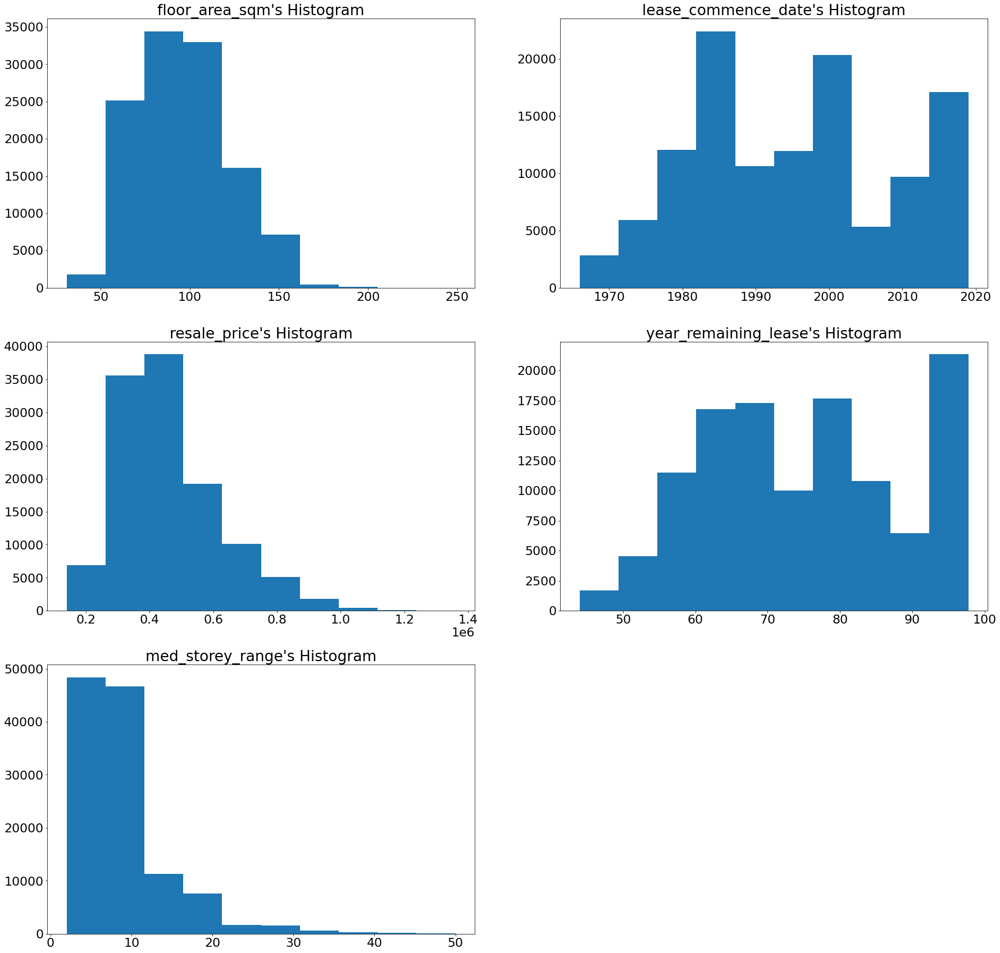

In [10]:
col = list(df.columns)
plt.figure(figsize=(30,30))
plt.rcParams.update({'font.size': 22})

for i in num_col:
    plt.subplot(3,2,(num_col.index(i))+1)
    plt.hist(df[i])
    plt.title(i + "'s Histogram")

- __DATE__

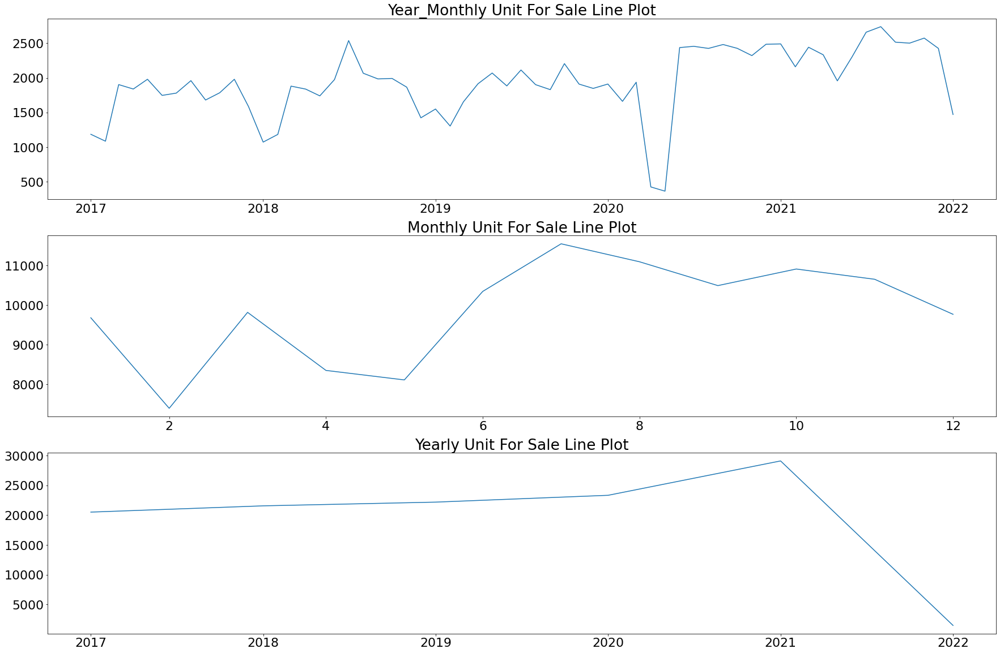

In [11]:
date_col = ['year_month', 'month', 'year']
plt.figure(figsize=(30,20))
plt.rcParams.update({'font.size': 22})

for i in date_col :
    group = df.groupby(i).count()
    plt.subplot(3,1,(date_col.index(i))+1)
    plt.plot(group[group.columns[0]])
    plt.title((i + "ly unit for sale Line Plot").title())

- __CATEGORIC__

In [12]:
def categoric_bar_uni(field, limit) :
    
    group = df.groupby(field).count().reset_index()
    group = group[group.columns[:2]].sort_values(by=[group.columns[1]], ascending=False).iloc[:limit]
    
    plt.bar(group[group.columns[0]], group[group.columns[1]])
    
    if limit == None:
        plt.title(("flat for sale in each "+field).title())
    else :
        plt.title(("flat for sale in each "+field+" (top"+str(limit)+")").title())

_Town_

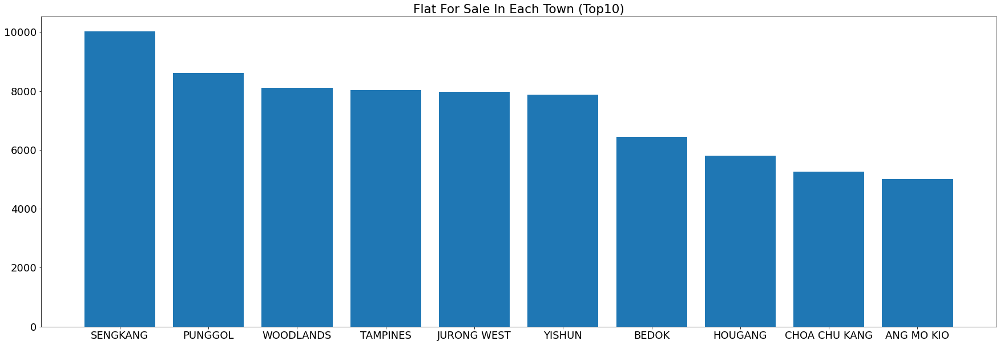

In [13]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni("town",10)
plt.show()

_Flat Type_

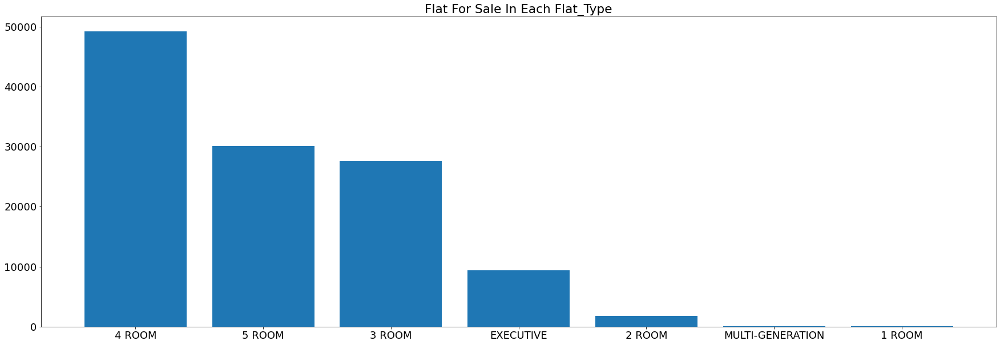

In [14]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni("flat_type",None)
plt.show()

_Storey Range_

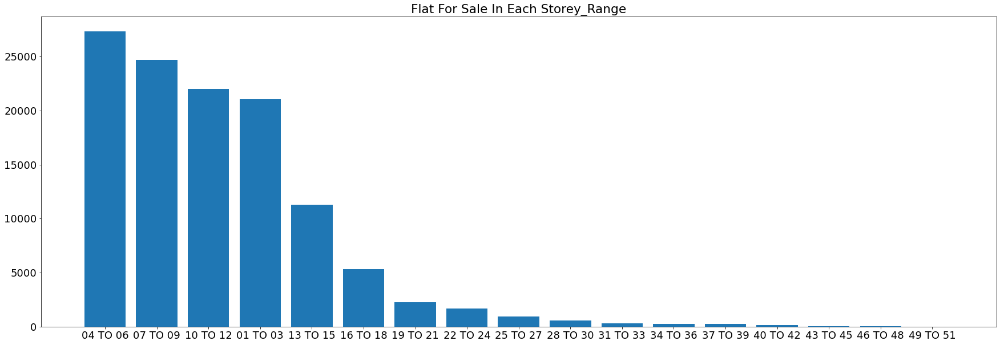

In [15]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni("storey_range",None)
plt.show()

_Flat Model_

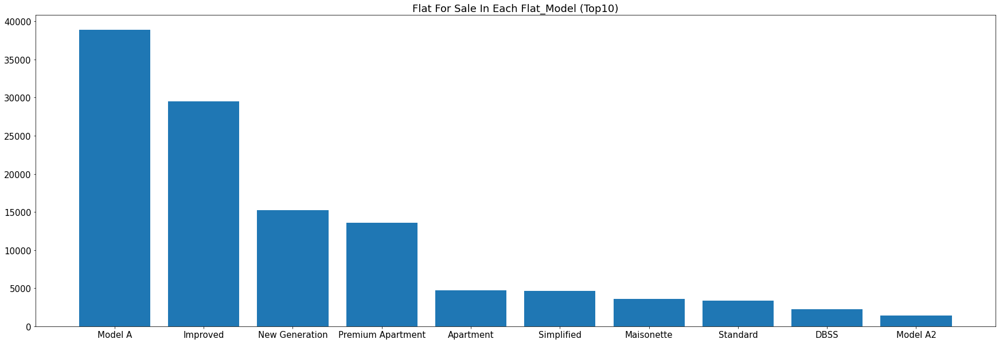

In [16]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 15})

categoric_bar_uni("flat_model",10)
plt.show()

### 2. Multivariate

__GROWTH__
____________________________________

_NUMBER OF UNIT SALE_

,year_month,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,year_remaining_lease,med_storey_range
year,,,,,,,,,,,,,
2017,20509,20509,20509,20509,20509,20509,20509,20509,20509,20509,20509,20509,20509
2018,21561,21561,21561,21561,21561,21561,21561,21561,21561,21561,21561,21561,21561
2019,22186,22186,22186,22186,22186,22186,22186,22186,22186,22186,22186,22186,22186
2020,23333,23333,23333,23333,23333,23333,23333,23333,23333,23333,23333,23333,23333
2021,29106,29106,29106,29106,29106,29106,29106,29106,29106,29106,29106,29106,29106
2022,1471,1471,1471,1471,1471,1471,1471,1471,1471,1471,1471,1471,1471


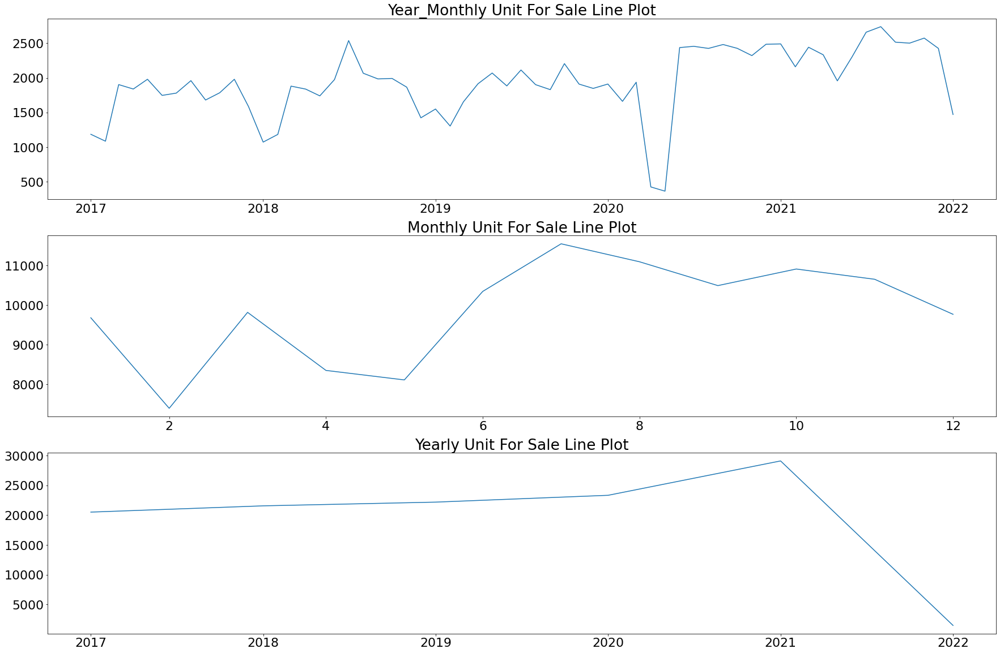

In [17]:
date_col = ['year_month', 'month', 'year']
plt.figure(figsize=(30,20))
plt.rcParams.update({'font.size': 22})

for i in date_col :
    group = df.groupby(i).count()
    plt.subplot(3,1,(date_col.index(i))+1)
    plt.plot(group[group.columns[0]])
    plt.title((i + "ly unit for sale Line Plot").title())
group

_PRICE_

,month,floor_area_sqm,lease_commence_date,resale_price,year_remaining_lease,med_storey_range
year,,,,,,
2017,7.0,96.0,1993.0,410000.0,74.67,8.0
2018,7.0,97.0,1993.0,408000.0,74.42,8.0
2019,7.0,94.0,1994.0,400000.0,74.21,8.0
2020,8.0,93.0,1996.0,425000.0,75.42,8.0
2021,7.0,93.0,1997.5,483000.0,75.58,8.0
2022,1.0,93.0,1997.0,505000.0,74.58,8.0


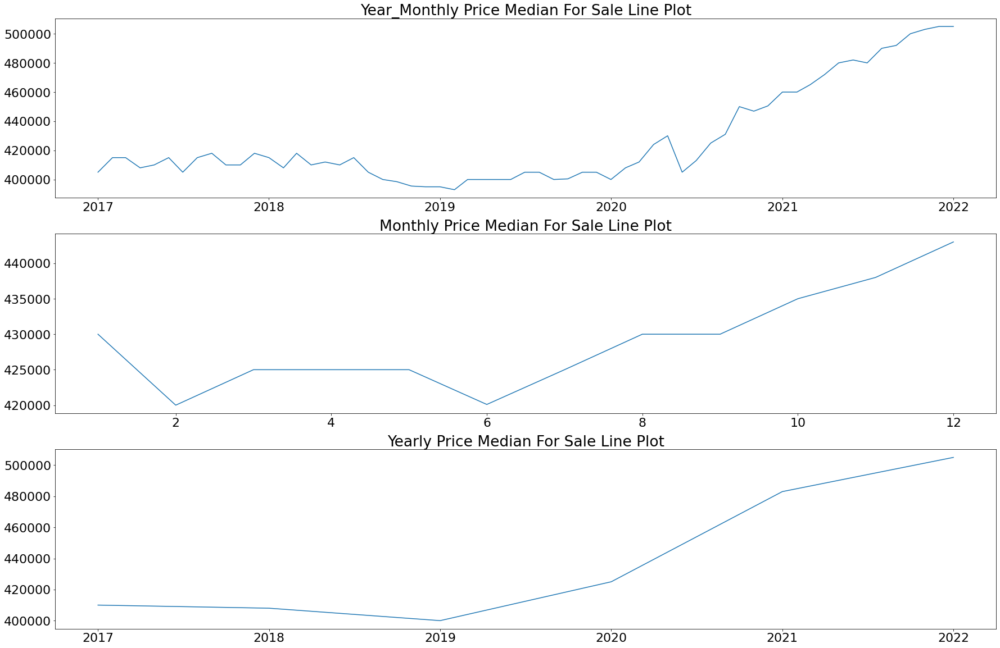

In [18]:
date_col = ['year_month', 'month', 'year']
plt.figure(figsize=(30,20))
plt.rcParams.update({'font.size': 22})

for i in date_col :
    group = df.groupby(i).median()
    plt.subplot(3,1,(date_col.index(i))+1)
    plt.plot(group["resale_price"])
    plt.title((i + "ly price median for sale Line Plot").title())
group

_VOLUME_

,month,floor_area_sqm,lease_commence_date,resale_price,year_remaining_lease,med_storey_range
year,,,,,,
2017,138712,2004816.3,40868799,9.103710e+09,1531921.21,177590.0
2018,146679,2122625.4,42982634,9.514483e+09,1606630.50,187017.0
2019,150161,2154003.4,44249224,9.587412e+09,1651783.70,188975.0
2020,167765,2277736.1,46579917,1.055303e+10,1756855.33,201394.0
2021,192714,2859279.0,58134181,1.488349e+10,2193762.70,261717.0
2022,1471,143162.0,2937854,7.787349e+08,109895.92,13223.0


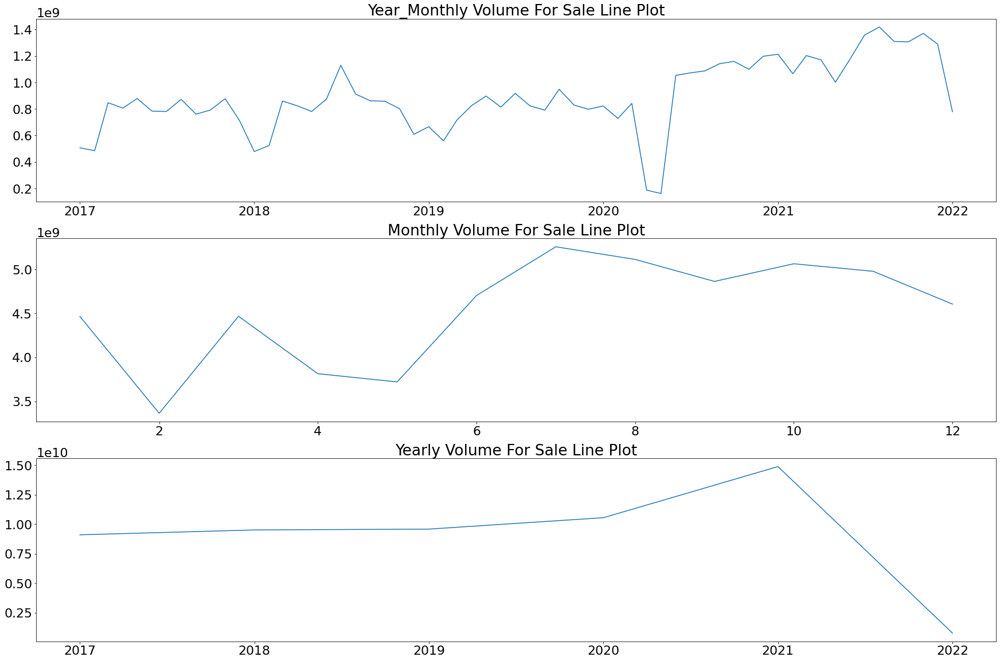

In [19]:
date_col = ['year_month', 'month', 'year']
plt.figure(figsize=(30,20))
plt.rcParams.update({'font.size': 22})

for i in date_col :
    group = df.groupby(i).sum()
    plt.subplot(3,1,(date_col.index(i))+1)
    plt.plot(group["resale_price"])
    plt.title((i + "ly volume for sale Line Plot").title())
group

__________________________

__________________________

__________________________

__________________________

__PERYEAR ANALYSIS__
____________________________________

In [20]:
def categoric_bar_uni_year(field, limit, year) :
    group = df[df["year"]==year].groupby(field).count().reset_index()
    group = group[group.columns[:2]].sort_values(by=[group.columns[1]], ascending=False).iloc[:limit]
    
    plt.bar(group[group.columns[0]], group[group.columns[1]])
    
    if limit == None:
        plt.title(("flat for sale in each "+field+" in "+str(year)).title())
    else :
        plt.title(("flat for sale in each "+field+" (top "+str(limit)+")"+" in "+str(year)).title())
    print(group)

def categoric_bar_price_year(field, limit, year) :
    group = df[df["year"]==year].groupby(field).median().reset_index()
    group = group[[field, "resale_price"]].sort_values(by=["resale_price"], ascending=False).iloc[:limit]
    
    plt.bar(group[field], group["resale_price"])
    
    if limit == None:
        plt.title(("flat's price median in each "+field+" in "+str(year)).title())
    else :
        plt.title(("flat's price median in each "+field+" (top"+str(limit)+")"+" in "+str(year)).title())
    print(group)
    
def categoric_bar_volume_year(field, limit, year) :
    group = df[df["year"]==year].groupby(field).sum().reset_index()
    group = group[[field, "resale_price"]].sort_values(by=["resale_price"], ascending=False).iloc[:limit]
    
    plt.bar(group[field], group["resale_price"])
    
    if limit == None:
        plt.title(("Volume in each "+field+" in "+str(year)).title())
    else :
        plt.title(("Volume in each "+field+" (top"+str(limit)+")"+" in "+str(year)).title())
    print(group)
        
def line_plot_uni_monthly(field, limit, year) :
    top_num = np.array(df[df["year"]==year].groupby(field)
                      .count()
                      .reset_index()
                      .sort_values(by=[df[df["year"]==year].groupby(field)
                                       .count()
                                       .reset_index()
                                       .columns[1]], ascending=False)
                      .iloc[:limit][field])
    growth_num = df[df["year"]==year].groupby(["month",field]).count().reset_index()
    growth_num = growth_num.loc[growth_num[field].isin(top_num)].rename(columns={growth_num.columns[2] : "number"})
    sns.lineplot(data=growth_num, x="month", y="number", hue=field)
    if limit == None :
        plt.title(("number of units for sale monthly growth per "+field+" in "+str(year)).title())
    else :
        plt.title(("number of units for sale monthly growth per "+field+" in "+str(year)+" (Top "+str(limit)+")").title())
    print(pd.DataFrame(growth_num[growth_num.columns[:3]]))
    
def line_plot_price_monthly(field, limit, year) :
    top_price = np.array(df[df["year"]==year].groupby(field)
                      .median()
                      .reset_index()
                      .sort_values(by=["resale_price"], ascending=False)
                      .iloc[:limit][field])
    growth_price = df[df["year"]==year].groupby(["month",field]).median().reset_index()
    growth_price = growth_price.loc[growth_price[field].isin(top_price)]
    sns.lineplot(data=growth_price, x="month", y="resale_price", hue=field)
    if limit == None :
        plt.title(("median price monthly growth per "+field+" in "+str(year)).title())
    else :
        plt.title(("median price monthly growth per "+field+" in "+str(year)+" (Top "+str(limit)+")").title())
    print(pd.DataFrame(growth_price[["month", field, "resale_price"]]))
    
def line_plot_volume_monthly(field, limit, year) :
    top_vol = np.array(df[df["year"]==year].groupby(field)
                      .sum()
                      .reset_index()
                      .sort_values(by=["resale_price"], ascending=False)
                      .iloc[:limit][field])
    growth_vol = df[df["year"]==year].groupby(["month",field]).sum().reset_index()
    growth_vol = growth_vol.loc[growth_vol[field].isin(top_vol)]
    sns.lineplot(data=growth_vol, x="month", y="resale_price", hue=field)
    if limit == None :
        plt.title(("volume monthly growth per "+field+" in "+str(year)).title())
    else :
        plt.title(("volume monthly growth per "+field+" in "+str(year)+" (Top "+str(limit)+")").title())
    print(pd.DataFrame(growth_vol[["month", field, "resale_price"]]))

#########################################################################################################################

__2017__

#########################################################################################################################

___________________________________
__TOWN__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           town  year_month
13  JURONG WEST        1620
20     SENGKANG        1534
24    WOODLANDS        1531
17      PUNGGOL        1316
22     TAMPINES        1299
25       YISHUN        1257
1         BEDOK        1148
11      HOUGANG         980
0    ANG MO KIO         942
4   BUKIT MERAH         829


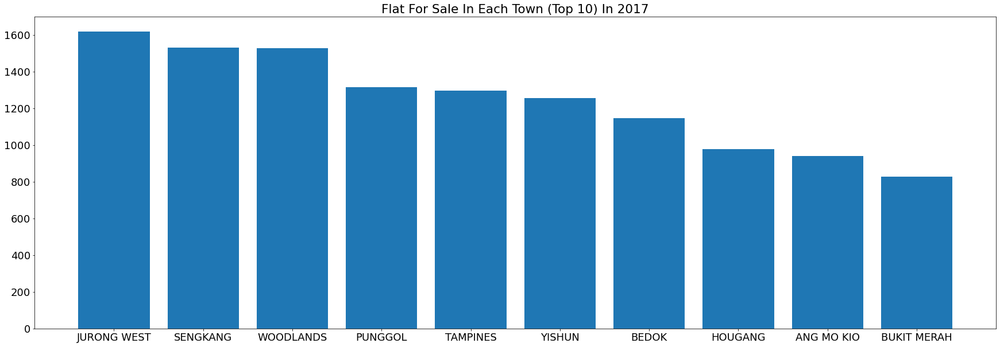

In [21]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("town",10,2017)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month         town  number
0        1   ANG MO KIO      56
1        1        BEDOK      70
4        1  BUKIT MERAH      56
11       1      HOUGANG      66
13       1  JURONG WEST     112
..     ...          ...     ...
303     12      PUNGGOL     126
306     12     SENGKANG     131
308     12     TAMPINES     108
310     12    WOODLANDS     103
311     12       YISHUN      93

[120 rows x 3 columns]


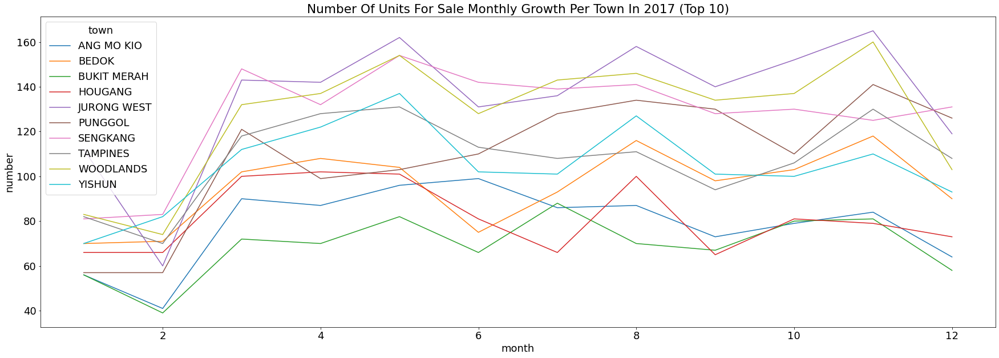

In [22]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('town', 10, 2017)
plt.show()

_PRICE AVERAGE GENERAL_

               town  resale_price
6       BUKIT TIMAH      698000.0
2            BISHAN      645694.0
4       BUKIT MERAH      579000.0
18       QUEENSTOWN      565000.0
7      CENTRAL AREA      514000.0
15    MARINE PARADE      469000.0
16        PASIR RIS      465000.0
14  KALLANG/WHAMPOA      465000.0
21        SERANGOON      463000.0
22         TAMPINES      455000.0


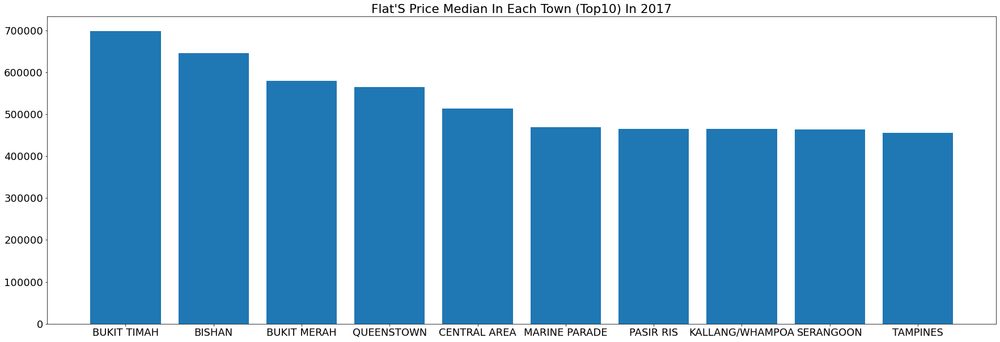

In [23]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("town", 10, 2017)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month             town  resale_price
2        1           BISHAN      604000.0
4        1      BUKIT MERAH      540000.0
6        1      BUKIT TIMAH      876888.0
7        1     CENTRAL AREA      470000.0
14       1  KALLANG/WHAMPOA      405000.0
..     ...              ...           ...
301     12    MARINE PARADE      472500.0
302     12        PASIR RIS      461000.0
304     12       QUEENSTOWN      565500.0
307     12        SERANGOON      423888.0
308     12         TAMPINES      465000.0

[120 rows x 3 columns]


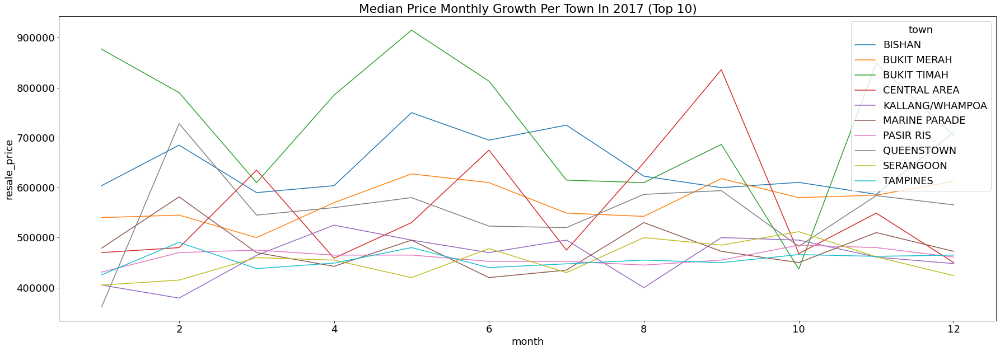

In [24]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('town', 10, 2017)
plt.show()

_VOLUME GENERAL_

           town  resale_price
20     SENGKANG  6.635920e+08
13  JURONG WEST  6.404318e+08
22     TAMPINES  6.157891e+08
24    WOODLANDS  5.940803e+08
17      PUNGGOL  5.933643e+08
1         BEDOK  4.840917e+08
4   BUKIT MERAH  4.679657e+08
25       YISHUN  4.432132e+08
11      HOUGANG  4.194178e+08
0    ANG MO KIO  3.979889e+08


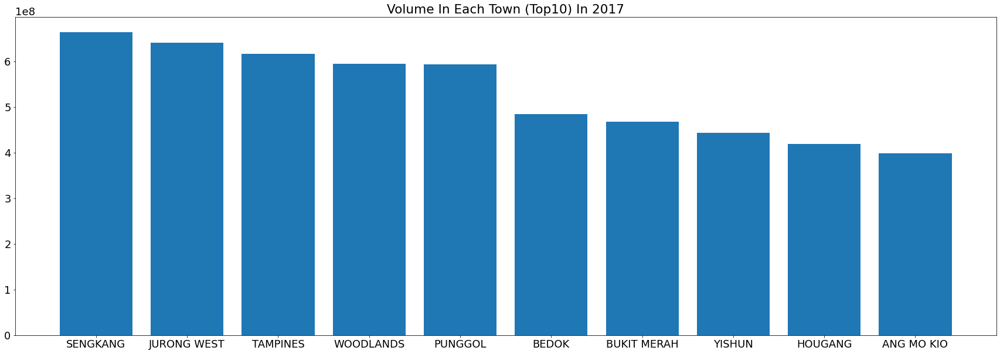

In [25]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("town", 10, 2017)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month         town  resale_price
0        1   ANG MO KIO    23182388.0
1        1        BEDOK    28601888.0
4        1  BUKIT MERAH    28687000.0
11       1      HOUGANG    27501464.0
13       1  JURONG WEST    45037464.0
..     ...          ...           ...
303     12      PUNGGOL    57581004.0
306     12     SENGKANG    59056743.0
308     12     TAMPINES    51784488.0
310     12    WOODLANDS    40026364.0
311     12       YISHUN    33277176.0

[120 rows x 3 columns]


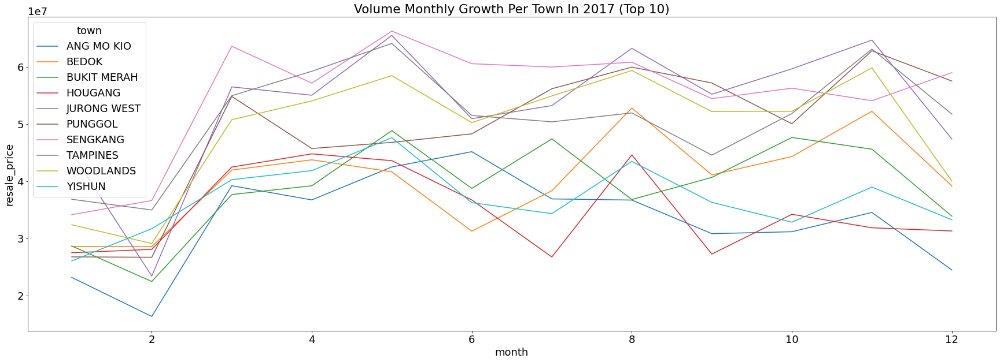

In [26]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('town', 10, 2017)
plt.show()

___________________________________
__FLAT TYPE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

          flat_type  year_month
3            4 ROOM        8604
2            3 ROOM        5047
4            5 ROOM        5002
5         EXECUTIVE        1624
1            2 ROOM         219
0            1 ROOM           9
6  MULTI-GENERATION           4


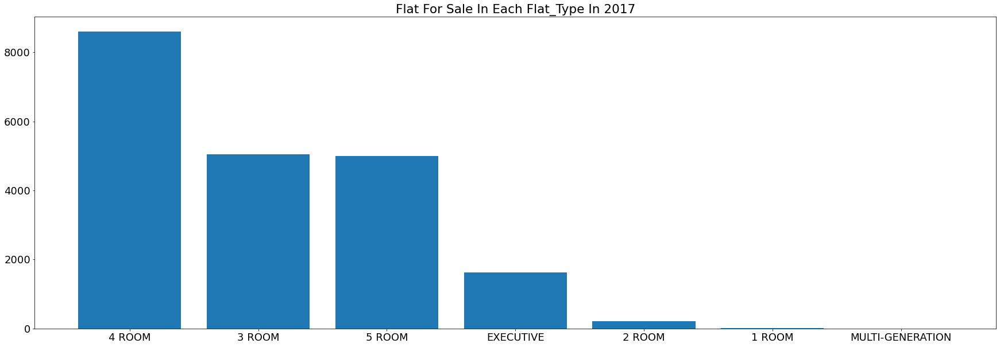

In [27]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_type",None,2017)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

    month         flat_type  number
0       1            2 ROOM      18
1       1            3 ROOM     332
2       1            4 ROOM     500
3       1            5 ROOM     256
4       1         EXECUTIVE      79
..    ...               ...     ...
64     12            3 ROOM     359
65     12            4 ROOM     643
66     12            5 ROOM     425
67     12         EXECUTIVE     142
68     12  MULTI-GENERATION       1

[69 rows x 3 columns]


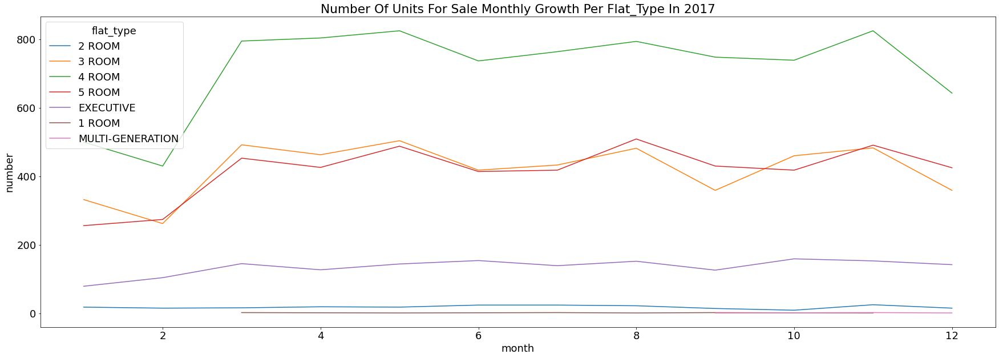

In [28]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_type', None, 2017)
plt.show()

_PRICE AVERAGE GENERAL_

          flat_type  resale_price
6  MULTI-GENERATION      765000.0
5         EXECUTIVE      600000.0
4            5 ROOM      478000.0
3            4 ROOM      408000.0
2            3 ROOM      301888.0
1            2 ROOM      240000.0
0            1 ROOM      203000.0


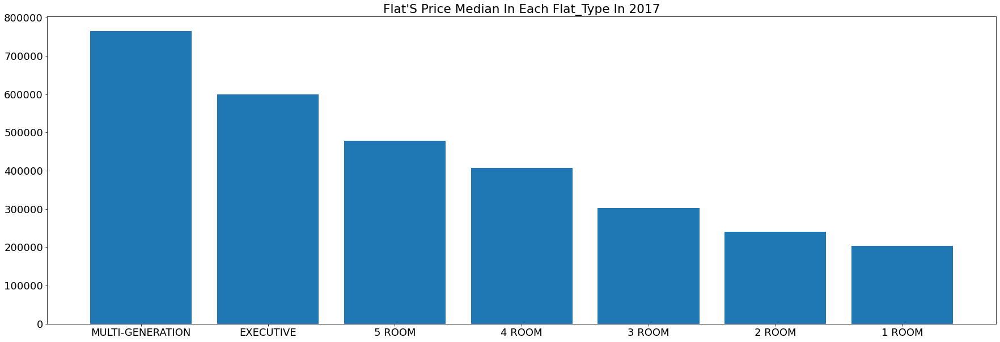

In [29]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_type", None, 2017)
plt.show()

_PRICE GRWOTH (MONTHLY)_

    month         flat_type  resale_price
0       1            2 ROOM      239000.0
1       1            3 ROOM      305000.0
2       1            4 ROOM      410000.0
3       1            5 ROOM      476944.0
4       1         EXECUTIVE      600000.0
..    ...               ...           ...
64     12            3 ROOM      292000.0
65     12            4 ROOM      405000.0
66     12            5 ROOM      475000.0
67     12         EXECUTIVE      603500.0
68     12  MULTI-GENERATION      830000.0

[69 rows x 3 columns]


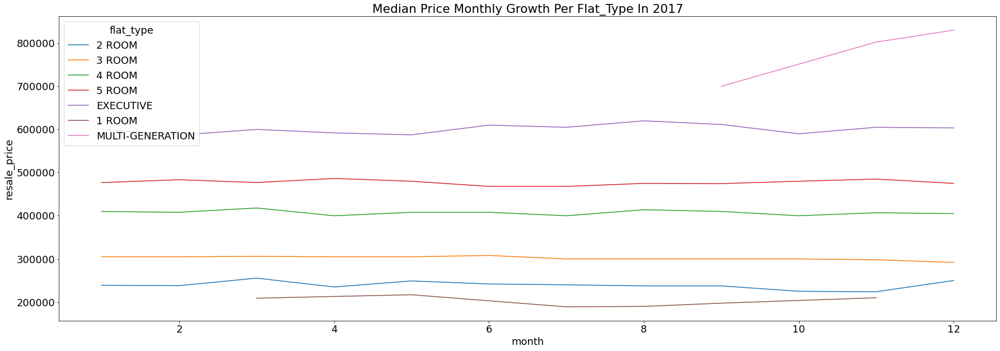

In [30]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_type', None, 2017)
plt.show()

_VOLUME GENERAL_

          flat_type  resale_price
3            4 ROOM  3.760980e+09
4            5 ROOM  2.662448e+09
2            3 ROOM  1.604109e+09
5         EXECUTIVE  1.018591e+09
1            2 ROOM  5.263757e+07
6  MULTI-GENERATION  3.135000e+06
0            1 ROOM  1.808000e+06


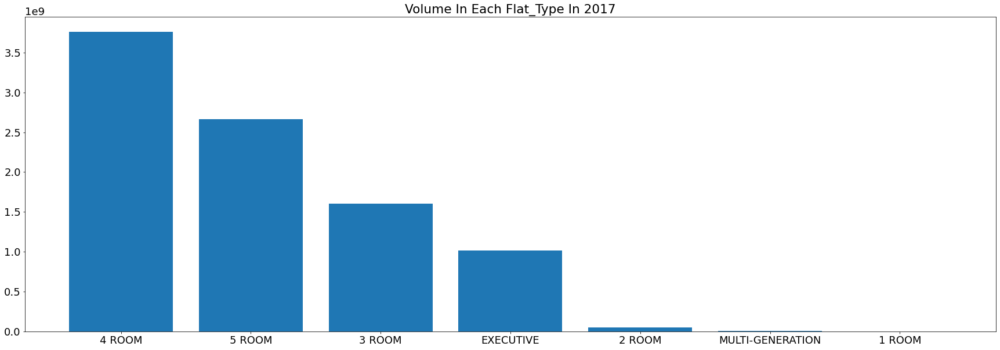

In [31]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_type", None, 2017)
plt.show()

_VOLUME GROWTH (MONTHLY)_

    month         flat_type  resale_price
0       1            2 ROOM     4365500.0
1       1            3 ROOM   105736574.0
2       1            4 ROOM   215024244.0
3       1            5 ROOM   132274107.0
4       1         EXECUTIVE    49195352.0
..    ...               ...           ...
64     12            3 ROOM   113671332.0
65     12            4 ROOM   277716598.0
66     12            5 ROOM   227328570.0
67     12         EXECUTIVE    89715080.0
68     12  MULTI-GENERATION      830000.0

[69 rows x 3 columns]


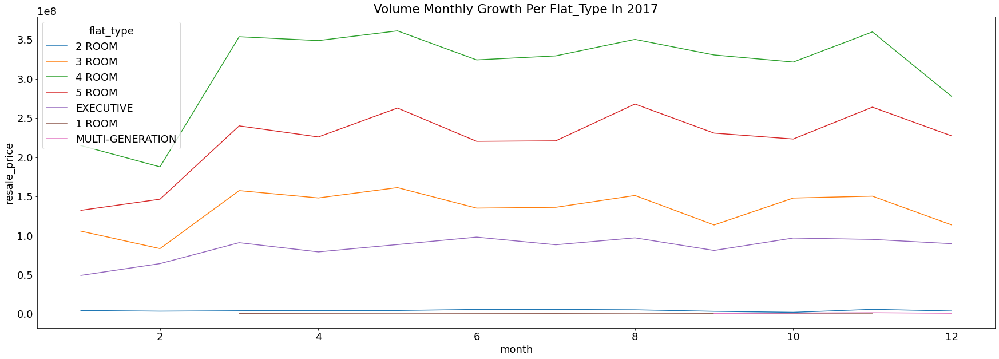

In [32]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_type', None, 2017)
plt.show()

___________________________________
__STOREY RANGE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

   storey_range  year_month
1      04 TO 06        4720
2      07 TO 09        4428
3      10 TO 12        3958
0      01 TO 03        3570
4      13 TO 15        1953
5      16 TO 18         812
6      19 TO 21         377
7      22 TO 24         264
8      25 TO 27         155
9      28 TO 30         111
11     34 TO 36          44
12     37 TO 39          44
10     31 TO 33          42
13     40 TO 42          22
14     43 TO 45           3
15     46 TO 48           3
16     49 TO 51           3


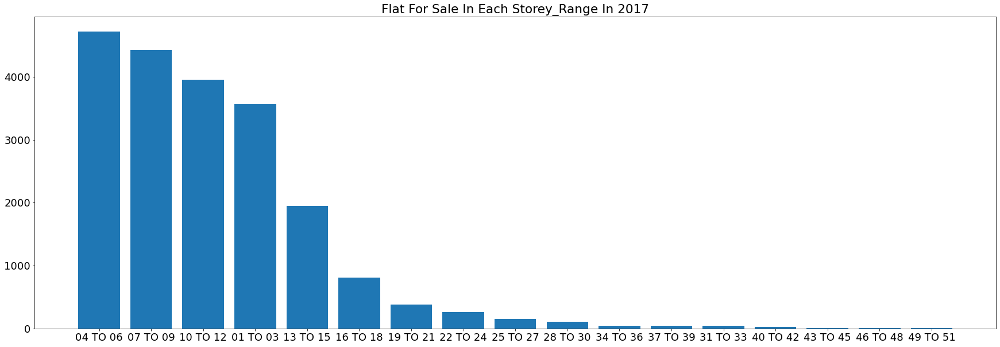

In [33]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("storey_range",None,2017)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month storey_range  number
0        1     01 TO 03     212
1        1     04 TO 06     311
2        1     07 TO 09     253
3        1     10 TO 12     229
4        1     13 TO 15      96
..     ...          ...     ...
166     12     28 TO 30       5
167     12     31 TO 33       4
168     12     34 TO 36       3
169     12     37 TO 39       9
170     12     40 TO 42       1

[171 rows x 3 columns]


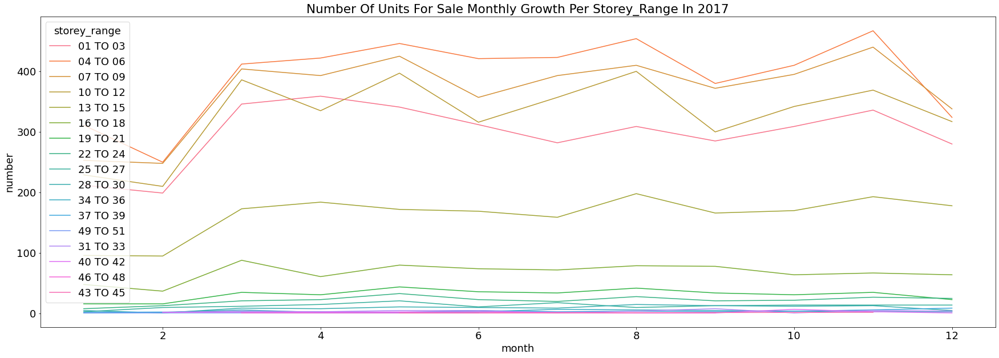

In [34]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('storey_range', None, 2017)
plt.show()

_PRICE AVERAGE GENERAL_

   storey_range  resale_price
14     43 TO 45     1058000.0
15     46 TO 48      998000.0
16     49 TO 51      978000.0
13     40 TO 42      915000.0
12     37 TO 39      831500.0
11     34 TO 36      809000.0
10     31 TO 33      795944.0
9      28 TO 30      760000.0
8      25 TO 27      675888.0
7      22 TO 24      642500.0
6      19 TO 21      605000.0
5      16 TO 18      468000.0
4      13 TO 15      450000.0
3      10 TO 12      418000.0
2      07 TO 09      408000.0
1      04 TO 06      392000.0
0      01 TO 03      366000.0


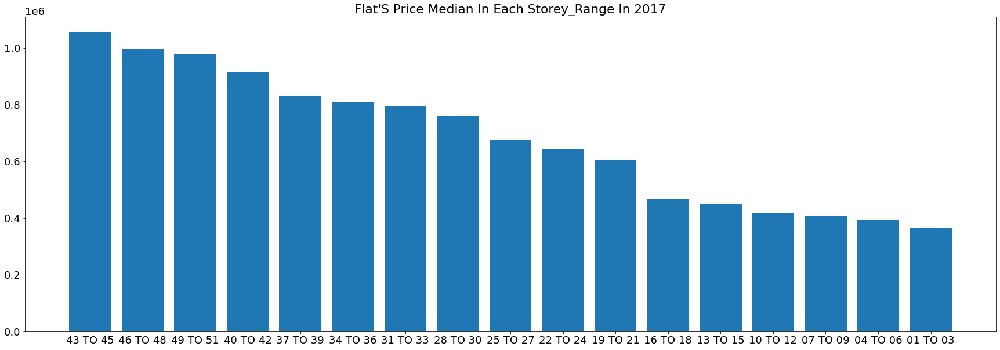

In [35]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("storey_range", None, 2017)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03      369000.0
1        1     04 TO 06      380000.0
2        1     07 TO 09      395000.0
3        1     10 TO 12      420000.0
4        1     13 TO 15      442000.0
..     ...          ...           ...
166     12     28 TO 30      770000.0
167     12     31 TO 33      909000.0
168     12     34 TO 36      470000.0
169     12     37 TO 39      780888.0
170     12     40 TO 42     1000000.0

[171 rows x 3 columns]


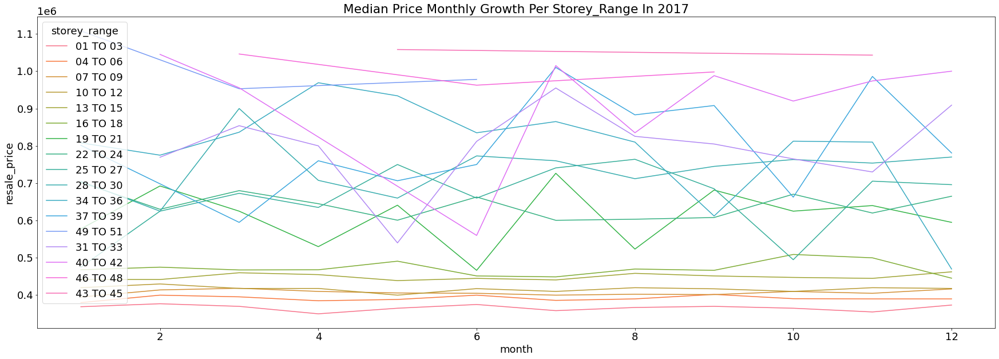

In [36]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('storey_range', None, 2017)
plt.show()

_VOLUME GENERAL_

   storey_range  resale_price
1      04 TO 06  1.977106e+09
2      07 TO 09  1.895792e+09
3      10 TO 12  1.747500e+09
0      01 TO 03  1.413110e+09
4      13 TO 15  9.429138e+08
5      16 TO 18  4.181188e+08
6      19 TO 21  2.262738e+08
7      22 TO 24  1.673820e+08
8      25 TO 27  1.025399e+08
9      28 TO 30  8.129824e+07
12     37 TO 39  3.563424e+07
11     34 TO 36  3.406966e+07
10     31 TO 33  3.306446e+07
13     40 TO 42  1.971678e+07
14     43 TO 45  3.144000e+06
16     49 TO 51  3.039000e+06
15     46 TO 48  3.006500e+06


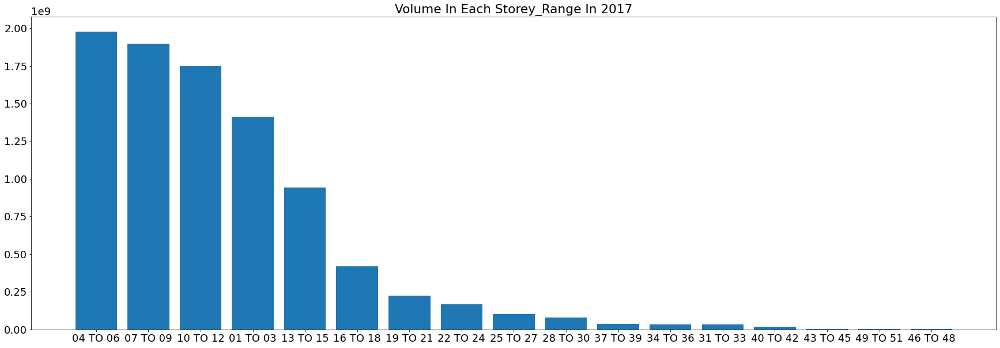

In [37]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("storey_range", None, 2017)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03    84079504.0
1        1     04 TO 06   126079262.0
2        1     07 TO 09   104050315.0
3        1     10 TO 12    99941792.0
4        1     13 TO 15    45726776.0
..     ...          ...           ...
166     12     28 TO 30     3878000.0
167     12     31 TO 33     3536888.0
168     12     34 TO 36     1545000.0
169     12     37 TO 39     6769888.0
170     12     40 TO 42     1000000.0

[171 rows x 3 columns]


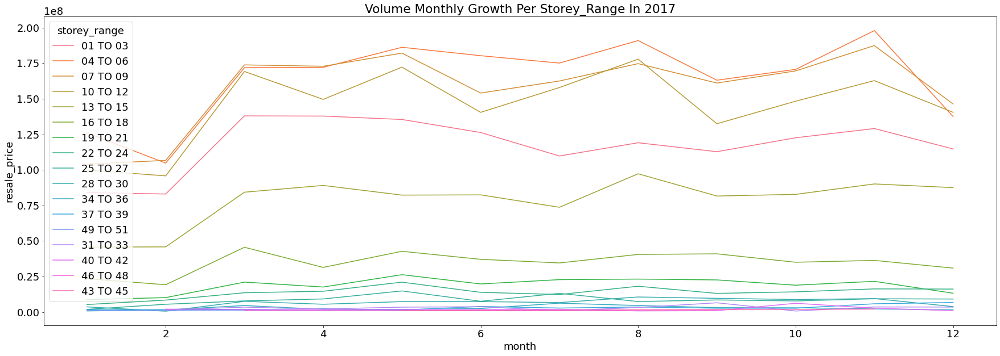

In [38]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('storey_range', None, 2017)
plt.show()

___________________________________
__FLAT MODEL__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           flat_model  year_month
6             Model A        6255
3            Improved        5058
10     New Generation        3002
11  Premium Apartment        2450
14         Simplified         976
1           Apartment         847
15           Standard         605
5          Maisonette         562
2                DBSS         306
8            Model A2         298


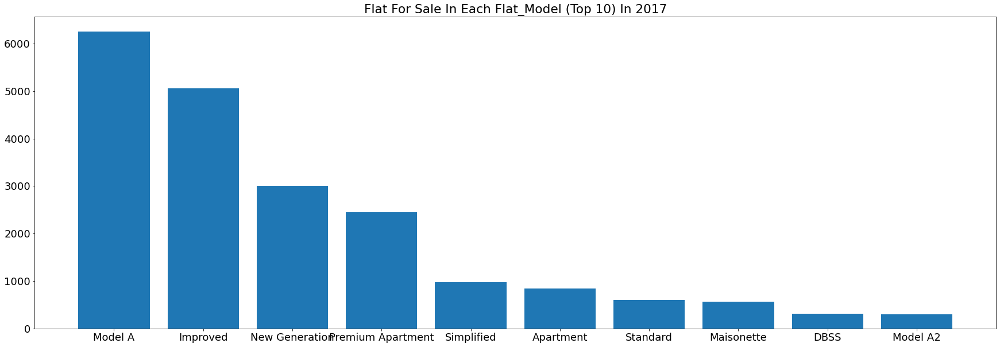

In [39]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_model",10,2017)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month         flat_model  number
1        1          Apartment      41
2        1               DBSS      10
3        1           Improved     286
4        1         Maisonette      25
5        1            Model A     375
..     ...                ...     ...
173     12           Model A2      21
175     12     New Generation     212
176     12  Premium Apartment     191
177     12         Simplified      56
178     12           Standard      38

[120 rows x 3 columns]


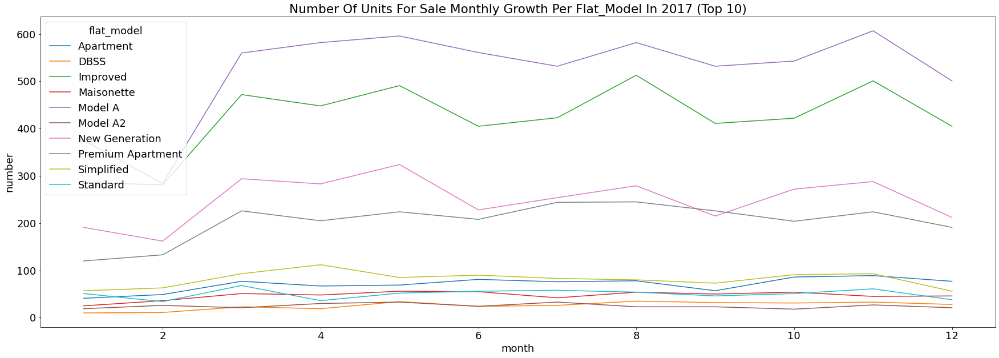

In [40]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_model', 10, 2017)
plt.show()

_PRICE AVERAGE GENERAL_

                flat_model  resale_price
18                 Type S2      976000.0
17                 Type S1      888000.0
12  Premium Apartment Loft      860000.0
2                     DBSS      805000.0
16                 Terrace      792500.0
13      Premium Maisonette      768000.0
9         Multi Generation      765000.0
7       Model A-Maisonette      720000.0
0            Adjoined flat      691900.0
5               Maisonette      658000.0


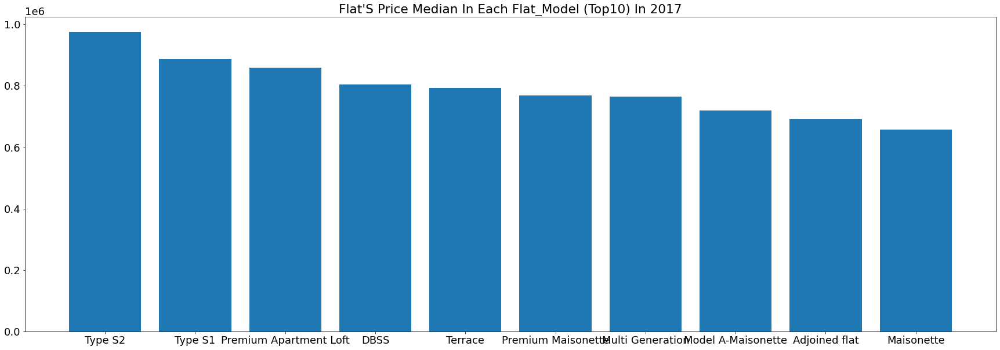

In [41]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_model", 10, 2017)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month          flat_model  resale_price
0        1       Adjoined flat      615000.0
2        1                DBSS      763000.0
4        1          Maisonette      664000.0
6        1  Model A-Maisonette      646500.0
12       1             Type S1      818000.0
..     ...                 ...           ...
170     12          Maisonette      638000.0
172     12  Model A-Maisonette      813500.0
174     12    Multi Generation      830000.0
179     12             Terrace      886944.0
180     12             Type S1      888000.0

[81 rows x 3 columns]


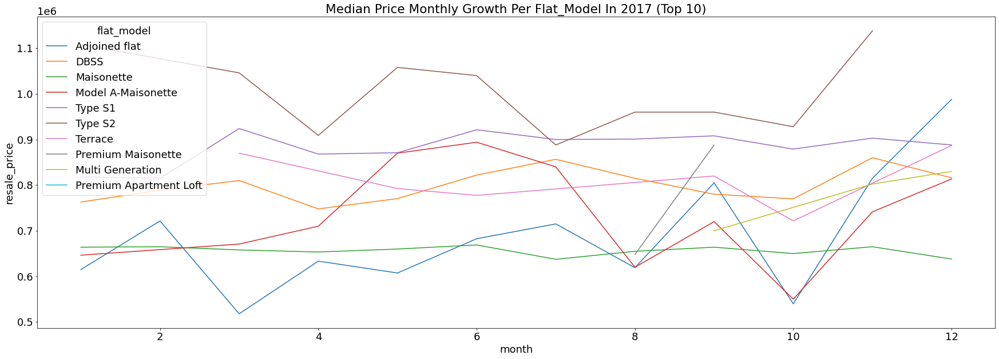

In [42]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_model', 10, 2017)
plt.show()

_VOLUME GENERAL_

           flat_model  resale_price
6             Model A  2.691683e+09
3            Improved  2.285206e+09
11  Premium Apartment  1.132155e+09
10     New Generation  1.039458e+09
1           Apartment  5.189798e+08
5          Maisonette  3.819529e+08
14         Simplified  3.400497e+08
2                DBSS  2.478091e+08
15           Standard  2.411710e+08
8            Model A2  1.033761e+08


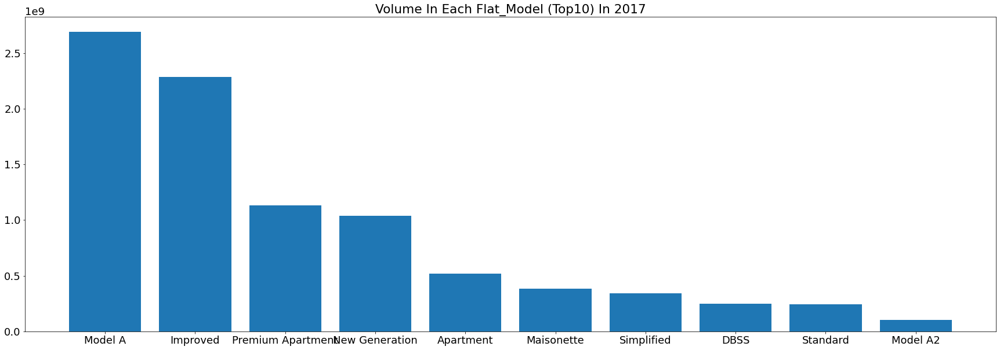

In [43]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_model", 10, 2017)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month         flat_model  resale_price
1        1          Apartment    24557888.0
2        1               DBSS     7905000.0
3        1           Improved   126262967.0
4        1         Maisonette    17098776.0
5        1            Model A   154381068.0
..     ...                ...           ...
173     12           Model A2     7155488.0
175     12     New Generation    72105940.0
176     12  Premium Apartment    90525118.0
177     12         Simplified    18556888.0
178     12           Standard    14136076.0

[120 rows x 3 columns]


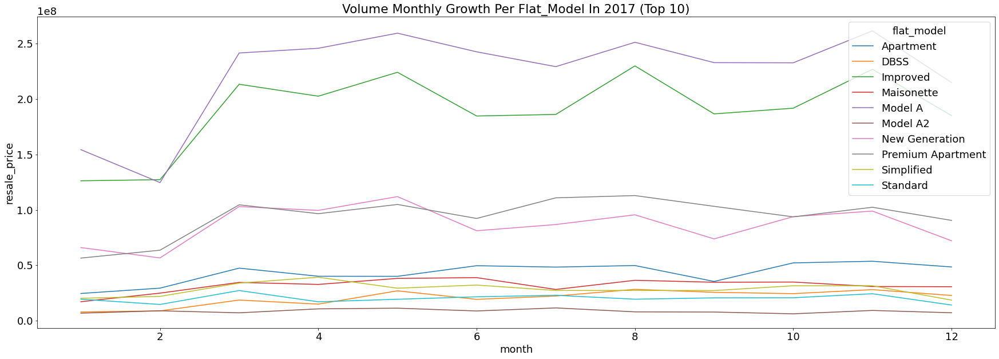

In [44]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_model', 10, 2017)
plt.show()

#########################################################################################################################

__2018__

#########################################################################################################################

___________________________________
__TOWN__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

             town  year_month
24      WOODLANDS        1663
20       SENGKANG        1641
13    JURONG WEST        1622
17        PUNGGOL        1537
22       TAMPINES        1368
25         YISHUN        1286
1           BEDOK        1138
11        HOUGANG        1035
0      ANG MO KIO        1014
8   CHOA CHU KANG         933


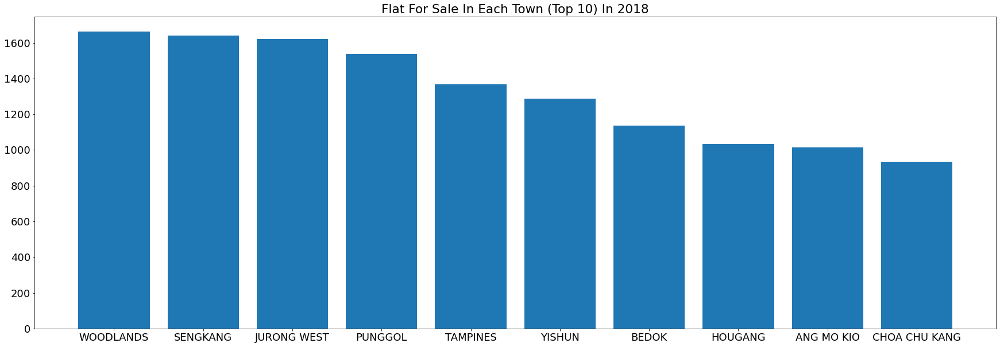

In [45]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("town",10,2018)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month           town  number
0        1     ANG MO KIO      55
1        1          BEDOK      59
8        1  CHOA CHU KANG      52
11       1        HOUGANG      48
13       1    JURONG WEST      71
..     ...            ...     ...
303     12        PUNGGOL     103
306     12       SENGKANG     108
308     12       TAMPINES      81
310     12      WOODLANDS     125
311     12         YISHUN      95

[120 rows x 3 columns]


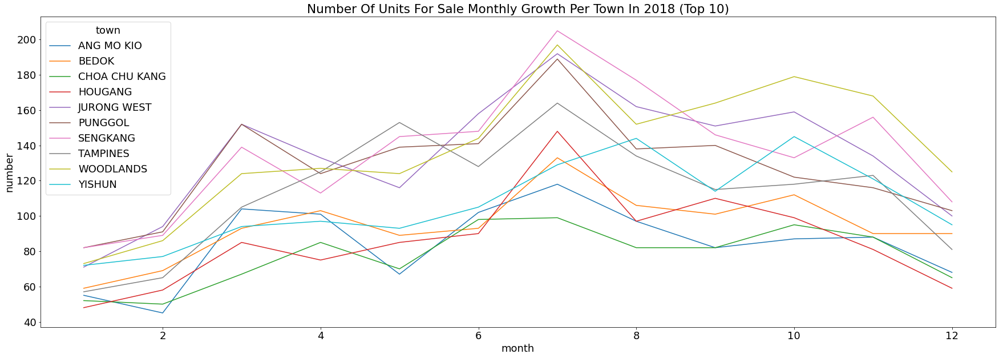

In [46]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('town', 10, 2018)
plt.show()

_PRICE AVERAGE GENERAL_

             town  resale_price
6     BUKIT TIMAH      738000.0
2          BISHAN      628888.0
4     BUKIT MERAH      590000.0
18     QUEENSTOWN      560000.0
7    CENTRAL AREA      508000.0
15  MARINE PARADE      489000.0
21      SERANGOON      475500.0
23      TOA PAYOH      470000.0
16      PASIR RIS      470000.0
22       TAMPINES      460000.0


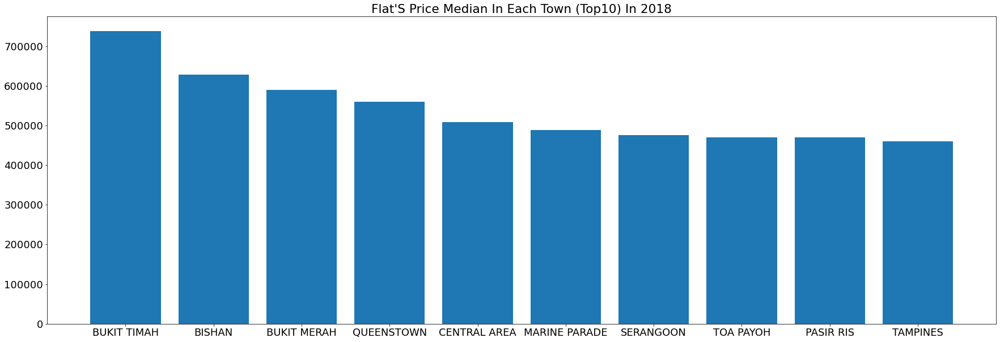

In [47]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("town", 10, 2018)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month           town  resale_price
2        1         BISHAN      550000.0
4        1    BUKIT MERAH      541500.0
6        1    BUKIT TIMAH      805000.0
7        1   CENTRAL AREA      474000.0
15       1  MARINE PARADE      395000.0
..     ...            ...           ...
302     12      PASIR RIS      451500.0
304     12     QUEENSTOWN      557500.0
307     12      SERANGOON      455000.0
308     12       TAMPINES      443000.0
309     12      TOA PAYOH      294000.0

[120 rows x 3 columns]


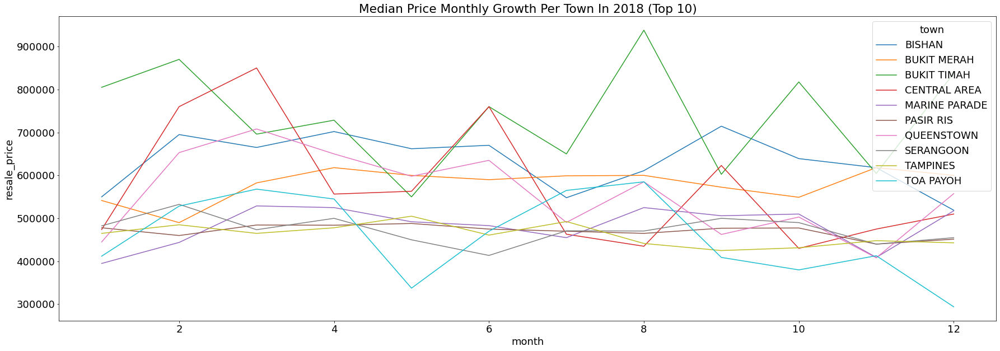

In [48]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('town', 10, 2018)
plt.show()

_VOLUME GENERAL_

           town  resale_price
20     SENGKANG  6.988399e+08
17      PUNGGOL  6.909538e+08
22     TAMPINES  6.609698e+08
13  JURONG WEST  6.208338e+08
24    WOODLANDS  6.187035e+08
4   BUKIT MERAH  4.960871e+08
1         BEDOK  4.726142e+08
11      HOUGANG  4.526689e+08
25       YISHUN  4.515427e+08
0    ANG MO KIO  4.322564e+08


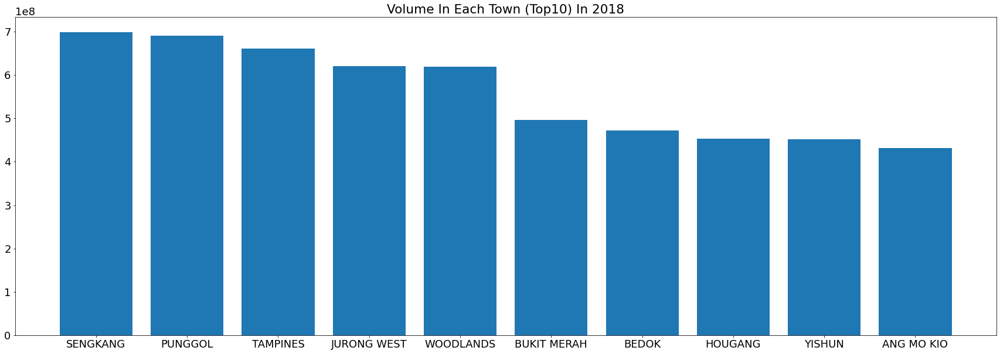

In [49]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("town", 10, 2018)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month         town  resale_price
0        1   ANG MO KIO    22147276.0
1        1        BEDOK    25751396.0
4        1  BUKIT MERAH    26395000.0
11       1      HOUGANG    23421976.0
13       1  JURONG WEST    27326664.0
..     ...          ...           ...
303     12      PUNGGOL    48699844.0
306     12     SENGKANG    45791388.0
308     12     TAMPINES    37243464.0
310     12    WOODLANDS    45891220.0
311     12       YISHUN    34143515.0

[120 rows x 3 columns]


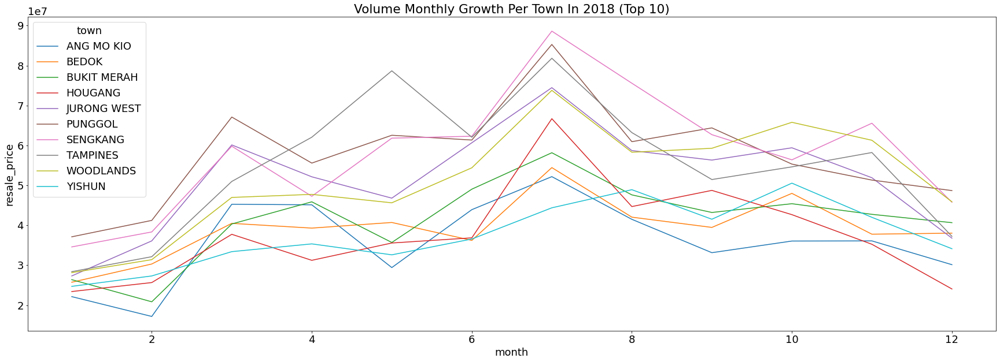

In [50]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('town', 10, 2018)
plt.show()

___________________________________
__FLAT TYPE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

          flat_type  year_month
3            4 ROOM        8769
4            5 ROOM        5487
2            3 ROOM        5119
5         EXECUTIVE        1876
1            2 ROOM         286
6  MULTI-GENERATION          15
0            1 ROOM           9


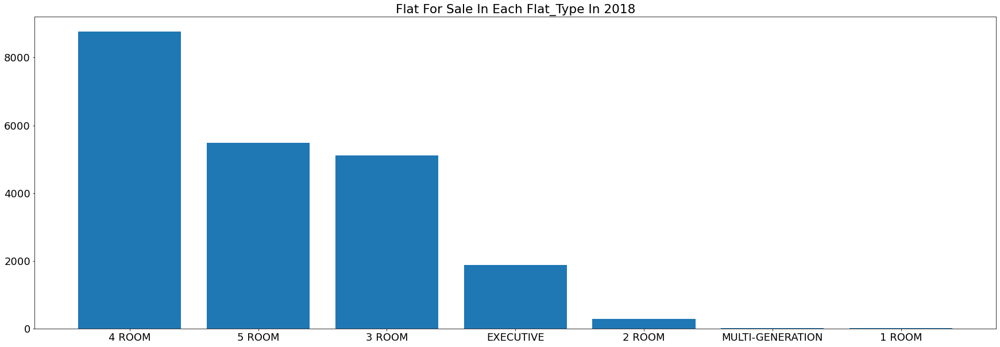

In [51]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_type",None,2018)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

    month  flat_type  number
0       1     2 ROOM      15
1       1     3 ROOM     261
2       1     4 ROOM     427
3       1     5 ROOM     264
4       1  EXECUTIVE     105
..    ...        ...     ...
68     12     2 ROOM      20
69     12     3 ROOM     357
70     12     4 ROOM     597
71     12     5 ROOM     352
72     12  EXECUTIVE      97

[73 rows x 3 columns]


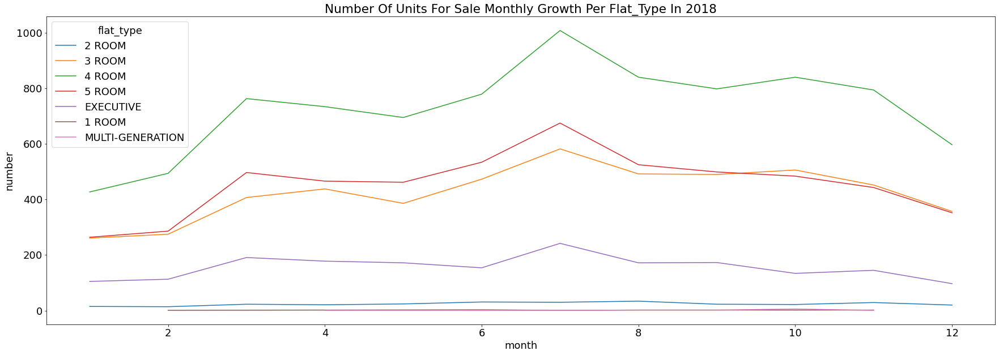

In [52]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_type', None, 2018)
plt.show()

_PRICE AVERAGE GENERAL_

          flat_type  resale_price
6  MULTI-GENERATION      780000.0
5         EXECUTIVE      610000.0
4            5 ROOM      475000.0
3            4 ROOM      400000.0
2            3 ROOM      290000.0
1            2 ROOM      230000.0
0            1 ROOM      180000.0


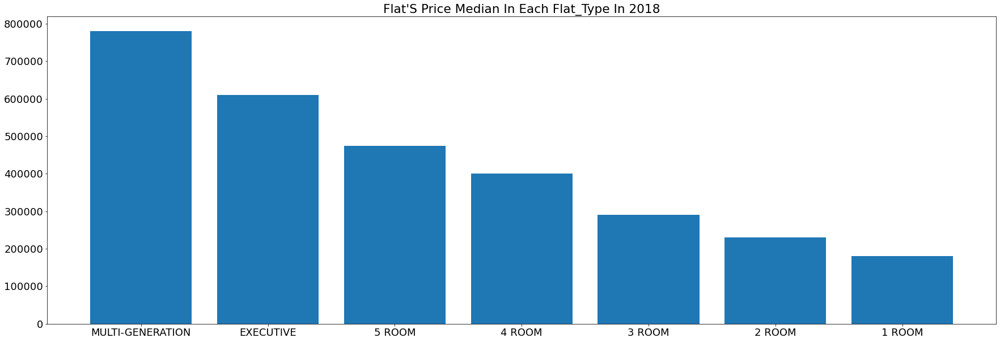

In [53]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_type", None, 2018)
plt.show()

_PRICE GRWOTH (MONTHLY)_

    month  flat_type  resale_price
0       1     2 ROOM      230000.0
1       1     3 ROOM      295000.0
2       1     4 ROOM      410000.0
3       1     5 ROOM      485000.0
4       1  EXECUTIVE      628000.0
..    ...        ...           ...
68     12     2 ROOM      220000.0
69     12     3 ROOM      285000.0
70     12     4 ROOM      395000.0
71     12     5 ROOM      477444.0
72     12  EXECUTIVE      600000.0

[73 rows x 3 columns]


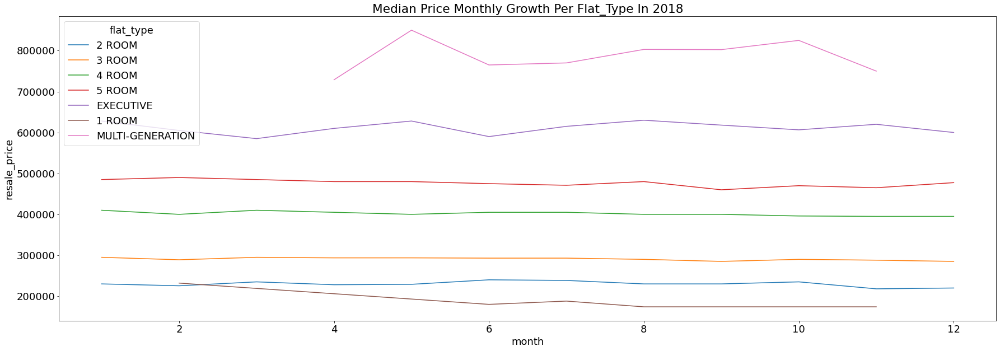

In [54]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_type', None, 2018)
plt.show()

_VOLUME GENERAL_

          flat_type  resale_price
3            4 ROOM  3.786041e+09
4            5 ROOM  2.895131e+09
2            3 ROOM  1.568861e+09
5         EXECUTIVE  1.183344e+09
1            2 ROOM  6.742833e+07
6  MULTI-GENERATION  1.202089e+07
0            1 ROOM  1.657000e+06


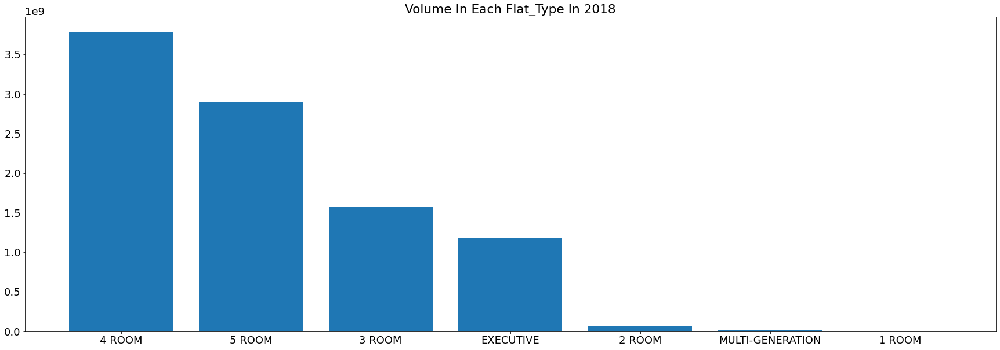

In [55]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_type", None, 2018)
plt.show()

_VOLUME GROWTH (MONTHLY)_

    month  flat_type  resale_price
0       1     2 ROOM     3438000.0
1       1     3 ROOM    81486980.0
2       1     4 ROOM   185848435.0
3       1     5 ROOM   140058928.0
4       1  EXECUTIVE    67686552.0
..    ...        ...           ...
68     12     2 ROOM     4552000.0
69     12     3 ROOM   106875839.0
70     12     4 ROOM   252645516.0
71     12     5 ROOM   184872179.0
72     12  EXECUTIVE    59743764.0

[73 rows x 3 columns]


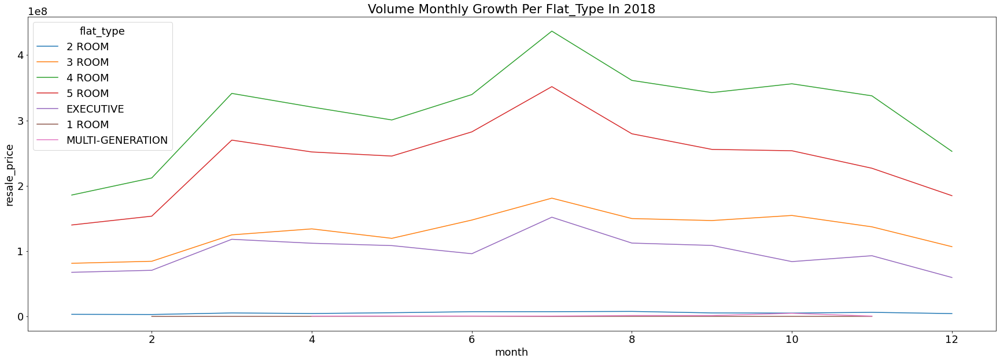

In [56]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_type', None, 2018)
plt.show()

___________________________________
__STOREY RANGE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

   storey_range  year_month
1      04 TO 06        4966
2      07 TO 09        4607
3      10 TO 12        4104
0      01 TO 03        3836
4      13 TO 15        1963
5      16 TO 18         895
6      19 TO 21         412
7      22 TO 24         317
8      25 TO 27         164
9      28 TO 30         102
11     34 TO 36          62
12     37 TO 39          51
10     31 TO 33          50
13     40 TO 42          25
15     46 TO 48           4
16     49 TO 51           2
14     43 TO 45           1


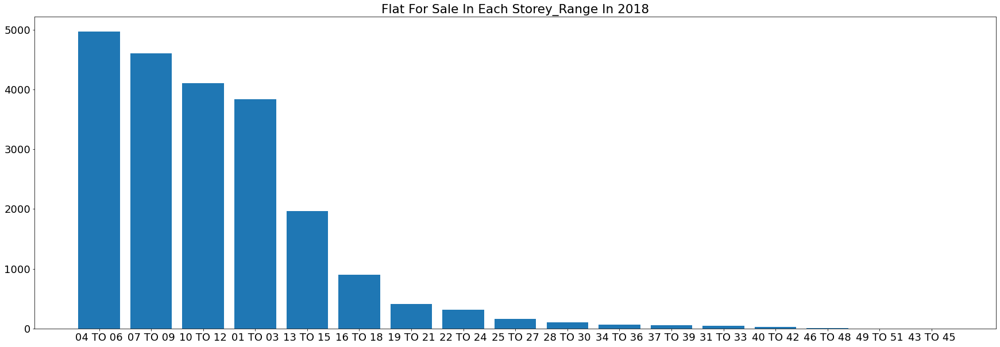

In [57]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("storey_range",None,2018)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month storey_range  number
0        1     01 TO 03     194
1        1     04 TO 06     249
2        1     07 TO 09     217
3        1     10 TO 12     218
4        1     13 TO 15      89
..     ...          ...     ...
168     12     25 TO 27       6
169     12     28 TO 30       4
170     12     31 TO 33       2
171     12     34 TO 36       4
172     12     37 TO 39       3

[173 rows x 3 columns]


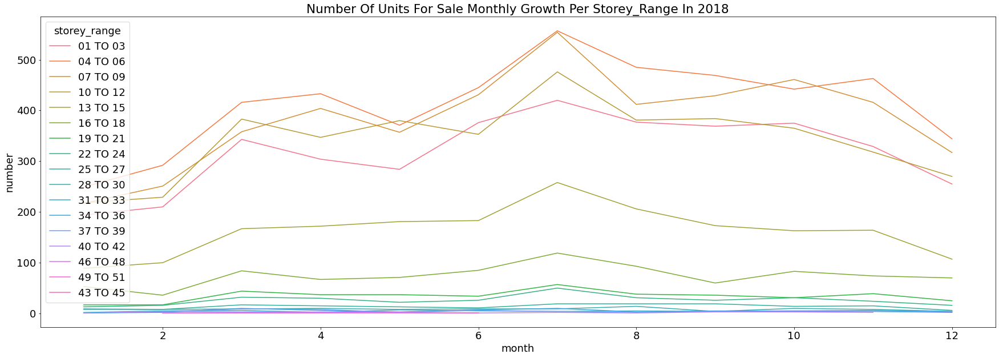

In [58]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('storey_range', None, 2018)
plt.show()

_PRICE AVERAGE GENERAL_

   storey_range  resale_price
16     49 TO 51      993944.0
14     43 TO 45      985000.0
15     46 TO 48      964000.0
13     40 TO 42      880000.0
12     37 TO 39      848000.0
11     34 TO 36      837000.0
10     31 TO 33      819444.0
9      28 TO 30      780000.0
8      25 TO 27      722344.0
6      19 TO 21      596500.0
7      22 TO 24      582000.0
5      16 TO 18      470000.0
4      13 TO 15      438000.0
3      10 TO 12      412000.0
2      07 TO 09      400000.0
1      04 TO 06      385000.0
0      01 TO 03      370000.0


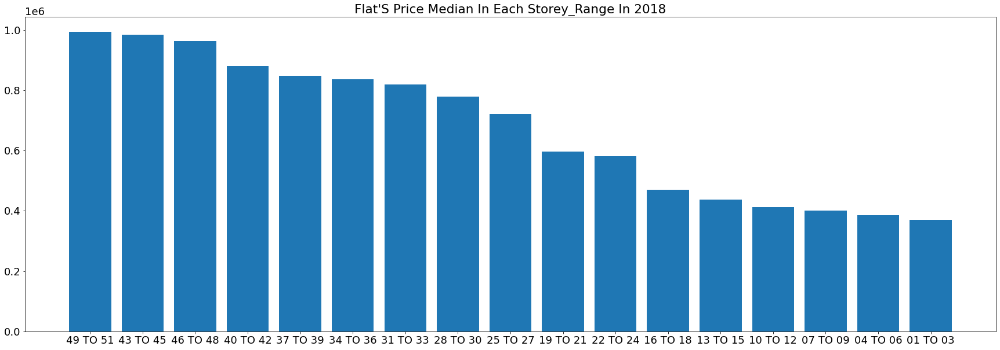

In [59]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("storey_range", None, 2018)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03      370000.0
1        1     04 TO 06      410000.0
2        1     07 TO 09      397500.0
3        1     10 TO 12      420000.0
4        1     13 TO 15      440000.0
..     ...          ...           ...
168     12     25 TO 27      793400.0
169     12     28 TO 30      731500.0
170     12     31 TO 33      934000.0
171     12     34 TO 36      787250.0
172     12     37 TO 39     1150000.0

[173 rows x 3 columns]


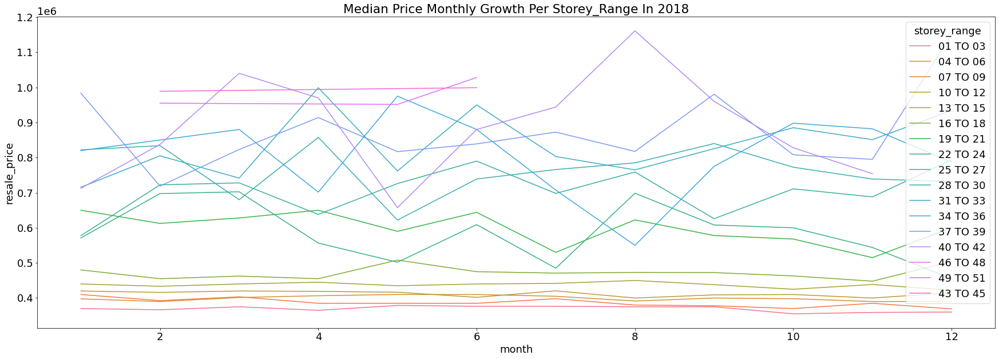

In [60]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('storey_range', None, 2018)
plt.show()

_VOLUME GENERAL_

   storey_range  resale_price
1      04 TO 06  2.056470e+09
2      07 TO 09  1.952137e+09
3      10 TO 12  1.803090e+09
0      01 TO 03  1.532474e+09
4      13 TO 15  9.194806e+08
5      16 TO 18  4.653070e+08
6      19 TO 21  2.436163e+08
7      22 TO 24  1.902759e+08
8      25 TO 27  1.119482e+08
9      28 TO 30  7.634654e+07
11     34 TO 36  5.079508e+07
12     37 TO 39  4.390194e+07
10     31 TO 33  4.021578e+07
13     40 TO 42  2.156528e+07
15     46 TO 48  3.886000e+06
16     49 TO 51  1.987888e+06
14     43 TO 45  9.850000e+05


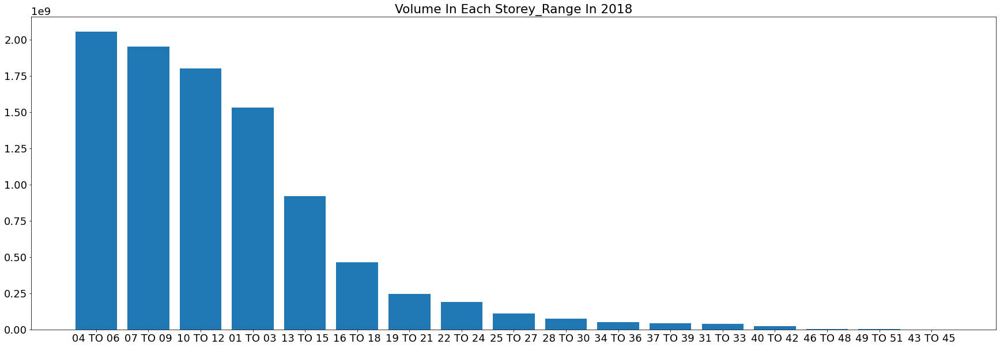

In [61]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("storey_range", None, 2018)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03    77823272.0
1        1     04 TO 06   105231604.0
2        1     07 TO 09    93012592.0
3        1     10 TO 12    98802031.0
4        1     13 TO 15    42835216.0
..     ...          ...           ...
168     12     25 TO 27     4474800.0
169     12     28 TO 30     2928100.0
170     12     31 TO 33     1868000.0
171     12     34 TO 36     3024500.0
172     12     37 TO 39     3220000.0

[173 rows x 3 columns]


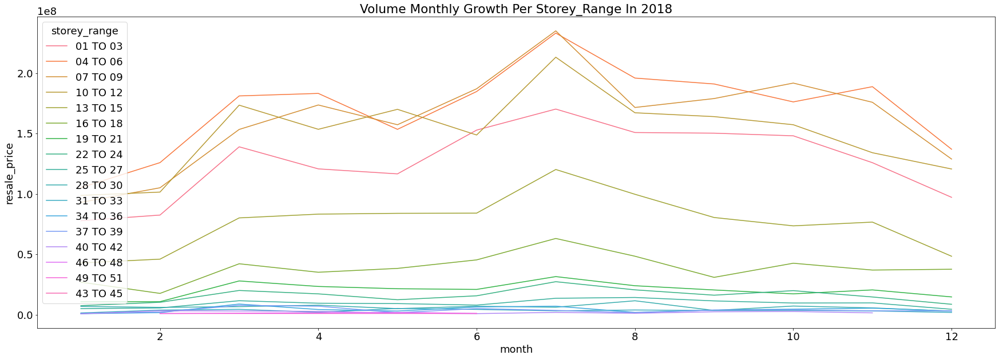

In [62]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('storey_range', None, 2018)
plt.show()

___________________________________
__FLAT MODEL__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           flat_model  year_month
6             Model A        6826
3            Improved        5477
10     New Generation        3007
11  Premium Apartment        2374
1           Apartment         964
14         Simplified         850
5          Maisonette         685
15           Standard         551
8            Model A2         333
2                DBSS         320


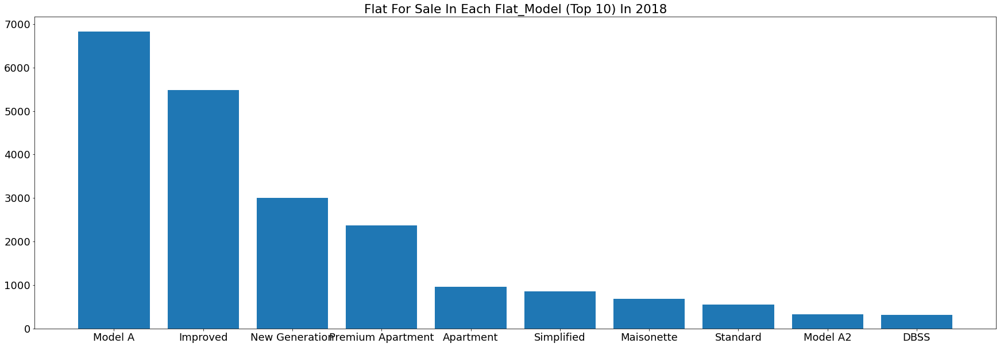

In [63]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_model",10,2018)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month         flat_model  number
1        1          Apartment      54
2        1               DBSS      18
3        1           Improved     277
4        1         Maisonette      39
5        1            Model A     314
..     ...                ...     ...
182     12           Model A2      21
183     12     New Generation     209
184     12  Premium Apartment     141
185     12         Simplified      68
186     12           Standard      41

[120 rows x 3 columns]


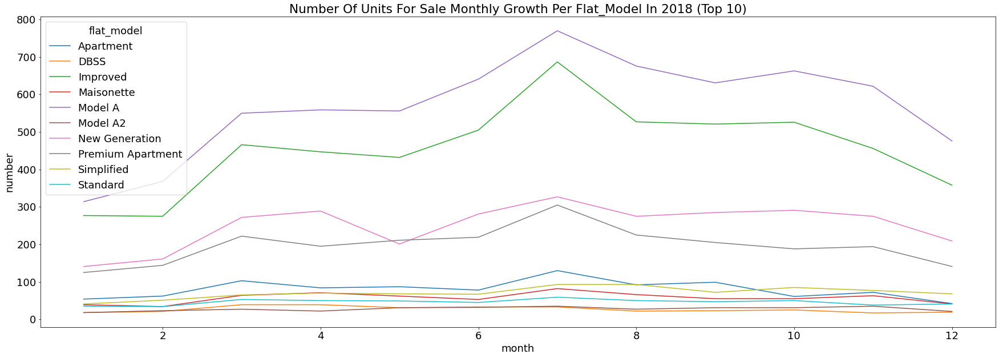

In [64]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_model', 10, 2018)
plt.show()

_PRICE AVERAGE GENERAL_

                flat_model  resale_price
18                 Type S2     1019444.0
17                 Type S1      920000.0
13      Premium Maisonette      900000.0
12  Premium Apartment Loft      835000.0
16                 Terrace      823000.0
2                     DBSS      820000.0
9         Multi Generation      780000.0
0            Adjoined flat      732500.0
7       Model A-Maisonette      720000.0
4      Improved-Maisonette      670000.0


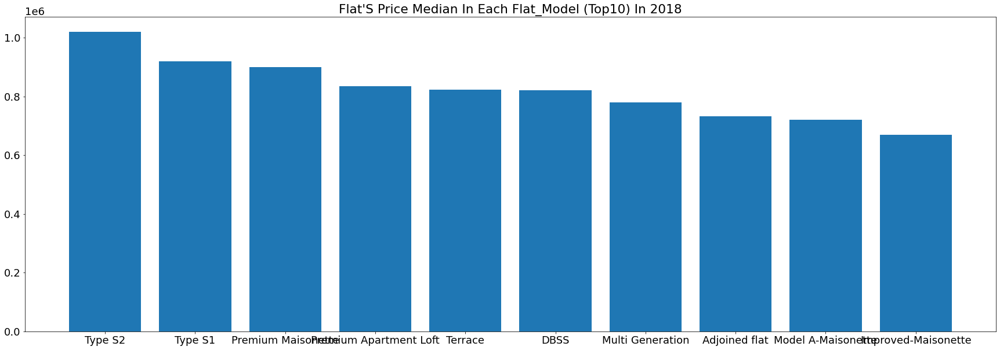

In [65]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_model", 10, 2018)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month          flat_model  resale_price
0        1       Adjoined flat      642500.0
2        1                DBSS      874194.0
9        1  Premium Maisonette      900000.0
12       1             Terrace      788000.0
13       1             Type S1      834000.0
..     ...                 ...           ...
177     12                DBSS      733000.0
181     12  Model A-Maisonette      628000.0
187     12             Terrace      693000.0
188     12             Type S1      920000.0
189     12             Type S2      988000.0

[82 rows x 3 columns]


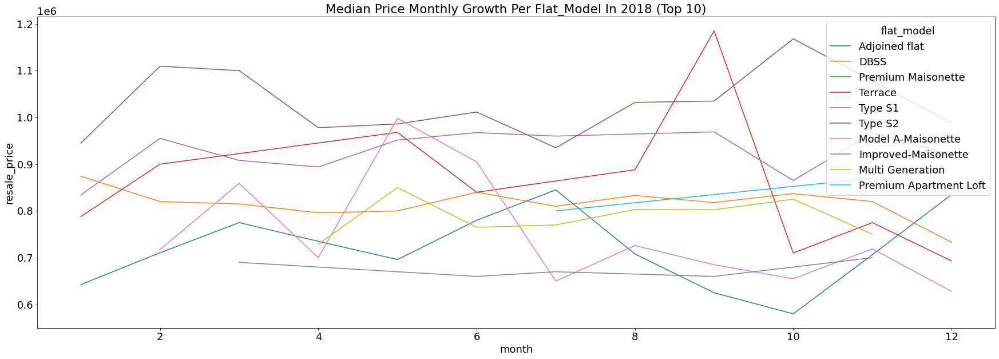

In [66]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_model', 10, 2018)
plt.show()

_VOLUME GENERAL_

           flat_model  resale_price
6             Model A  2.894839e+09
3            Improved  2.453295e+09
11  Premium Apartment  1.077776e+09
10     New Generation  9.906054e+08
1           Apartment  5.934899e+08
5          Maisonette  4.639124e+08
14         Simplified  2.906058e+08
2                DBSS  2.611364e+08
15           Standard  2.317289e+08
8            Model A2  1.134088e+08


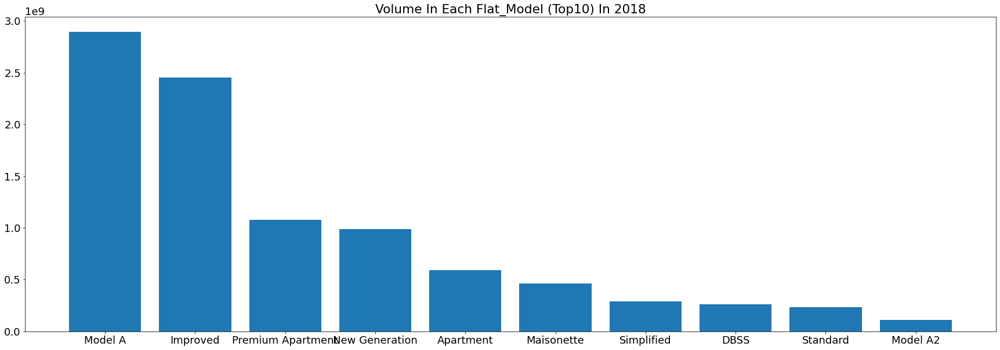

In [67]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_model", 10, 2018)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month         flat_model  resale_price
1        1          Apartment    32983888.0
2        1               DBSS    15044888.0
3        1           Improved   119761824.0
4        1         Maisonette    27609000.0
5        1            Model A   134508859.0
..     ...                ...           ...
182     12           Model A2     7406000.0
183     12     New Generation    66249663.0
184     12  Premium Apartment    64808956.0
185     12         Simplified    23350388.0
186     12           Standard    17058276.0

[120 rows x 3 columns]


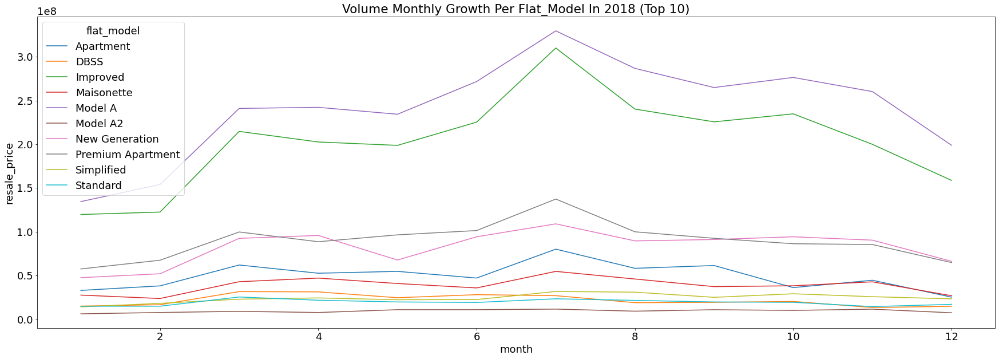

In [68]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_model', 10, 2018)
plt.show()

#########################################################################################################################

__2019__

#########################################################################################################################

___________________________________
__MONTH__
___________________________________

_NUMBER OF UNIT SALE_

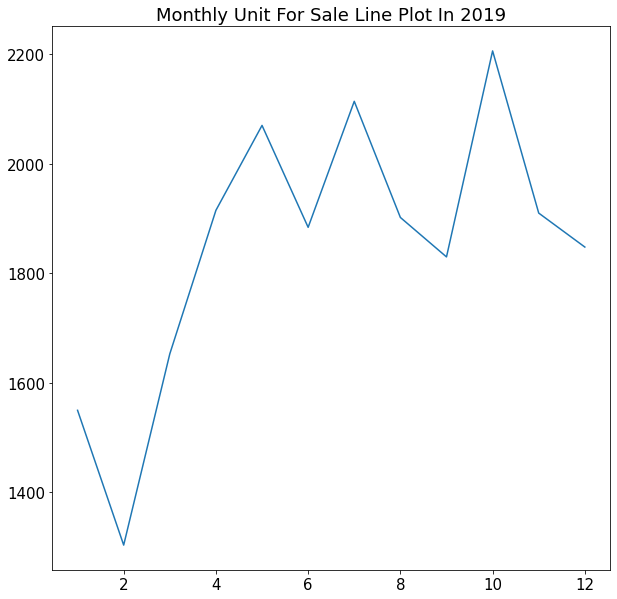

,year_month,year,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,year_remaining_lease,med_storey_range
month,,,,,,,,,,,,,
1,1550,1550,1550,1550,1550,1550,1550,1550,1550,1550,1550,1550,1550
2,1304,1304,1304,1304,1304,1304,1304,1304,1304,1304,1304,1304,1304
3,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653
4,1915,1915,1915,1915,1915,1915,1915,1915,1915,1915,1915,1915,1915
5,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070,2070
6,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884,1884
7,2114,2114,2114,2114,2114,2114,2114,2114,2114,2114,2114,2114,2114
8,1902,1902,1902,1902,1902,1902,1902,1902,1902,1902,1902,1902,1902
9,1830,1830,1830,1830,1830,1830,1830,1830,1830,1830,1830,1830,1830


In [69]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

group_month_2019_num = df[df['year']==2019].groupby("month").count()
plt.plot(group_month_2019_num[group_month_2019_num.columns[0]])
plt.title(("monthly unit for sale Line Plot in 2019").title())
plt.show()
group_month_2019_num

_PRICE_

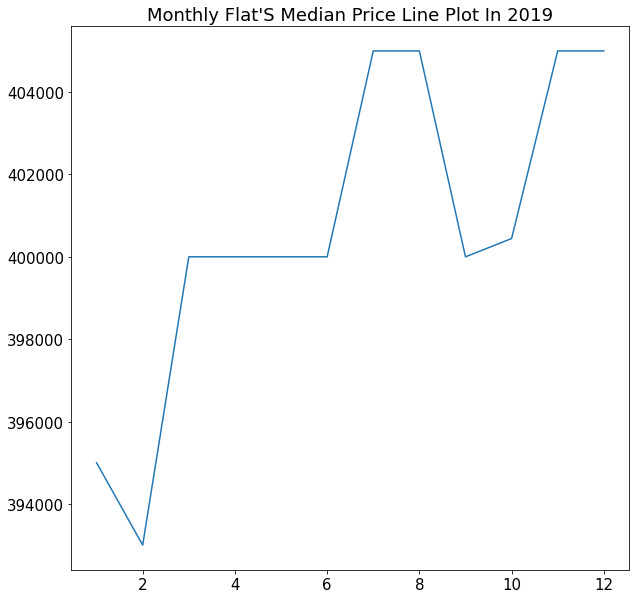

In [70]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

group_month_2019_price = df[df['year']==2019].groupby("month").median()
plt.plot(group_month_2019_price["resale_price"])
plt.title(("monthly flat's median price Line Plot in 2019").title())
plt.show()

_VOLUME_

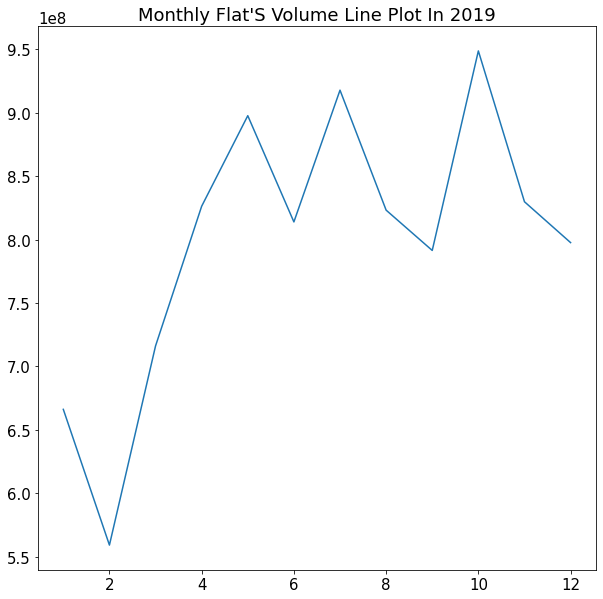

month
1     6.662063e+08
2     5.592779e+08
3     7.161731e+08
4     8.262175e+08
5     8.975508e+08
6     8.138664e+08
7     9.176652e+08
8     8.231471e+08
9     7.913935e+08
10    9.485872e+08
11    8.297605e+08
12    7.975664e+08
Name: resale_price, dtype: float64

In [71]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

group_month_2019_vol = df[df['year']==2019].groupby("month").sum()
plt.plot(group_month_2019_vol["resale_price"])
plt.title(("monthly flat's volume Line Plot in 2019").title())
plt.show()
group_month_2019_vol["resale_price"]

___________________________________
__TOWN__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

             town  year_month
20       SENGKANG        1795
24      WOODLANDS        1794
25         YISHUN        1790
13    JURONG WEST        1703
22       TAMPINES        1413
17        PUNGGOL        1160
1           BEDOK        1147
11        HOUGANG         967
0      ANG MO KIO         954
5   BUKIT PANJANG         937


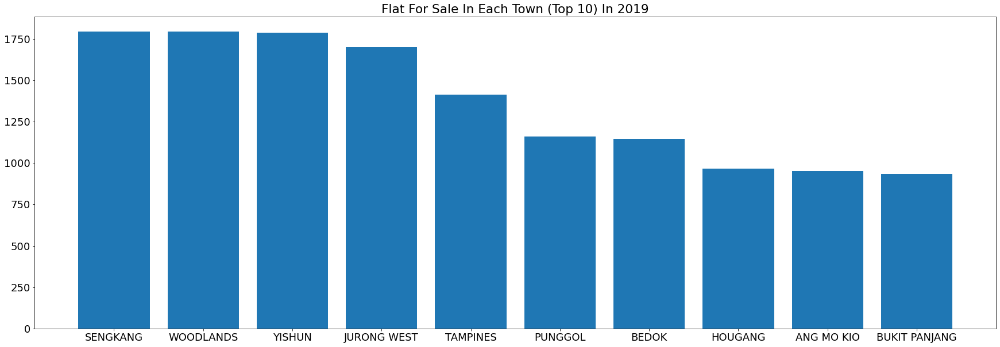

In [72]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("town",10,2019)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month           town  number
0        1     ANG MO KIO      74
1        1          BEDOK      82
5        1  BUKIT PANJANG      48
11       1        HOUGANG      53
13       1    JURONG WEST     113
..     ...            ...     ...
303     12        PUNGGOL     105
306     12       SENGKANG     139
308     12       TAMPINES     122
310     12      WOODLANDS     134
311     12         YISHUN     183

[120 rows x 3 columns]


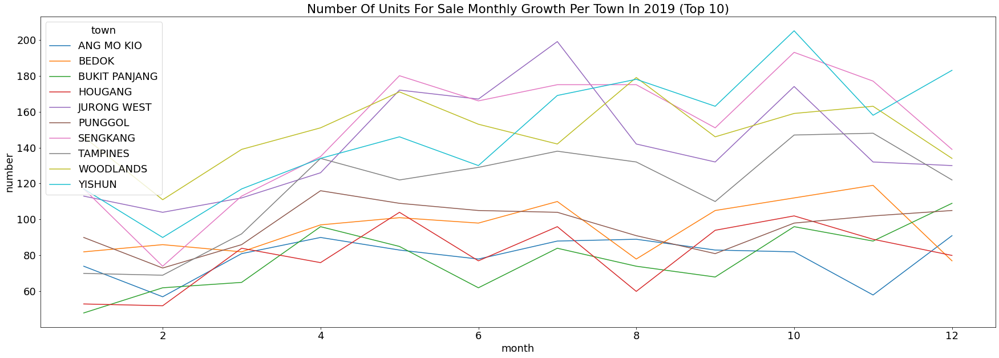

In [73]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('town', 10, 2019)
plt.show()

_PRICE AVERAGE GENERAL_

               town  resale_price
6       BUKIT TIMAH      725000.0
2            BISHAN      608000.0
4       BUKIT MERAH      581444.0
18       QUEENSTOWN      543000.0
7      CENTRAL AREA      512000.0
14  KALLANG/WHAMPOA      480000.0
16        PASIR RIS      475000.0
21        SERANGOON      460000.0
17          PUNGGOL      452000.0
15    MARINE PARADE      448000.0


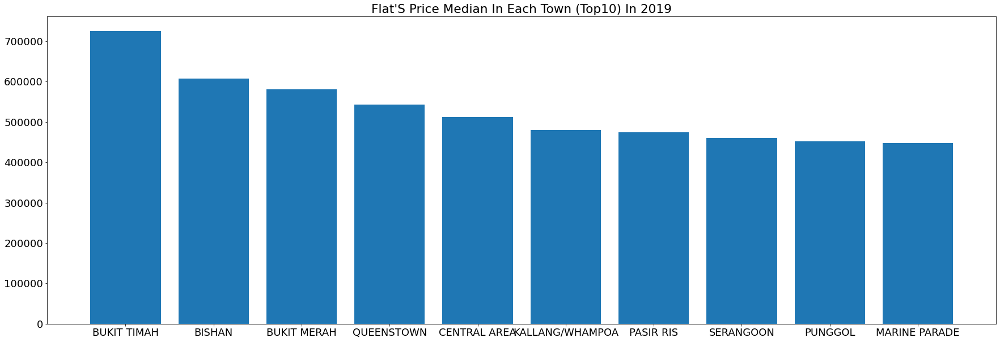

In [74]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("town", 10, 2019)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month             town  resale_price
2        1           BISHAN      568000.0
4        1      BUKIT MERAH      590000.0
6        1      BUKIT TIMAH      665000.0
7        1     CENTRAL AREA      560000.0
14       1  KALLANG/WHAMPOA      517500.0
..     ...              ...           ...
301     12    MARINE PARADE      417500.0
302     12        PASIR RIS      476000.0
303     12          PUNGGOL      458888.0
304     12       QUEENSTOWN      543000.0
307     12        SERANGOON      455000.0

[120 rows x 3 columns]


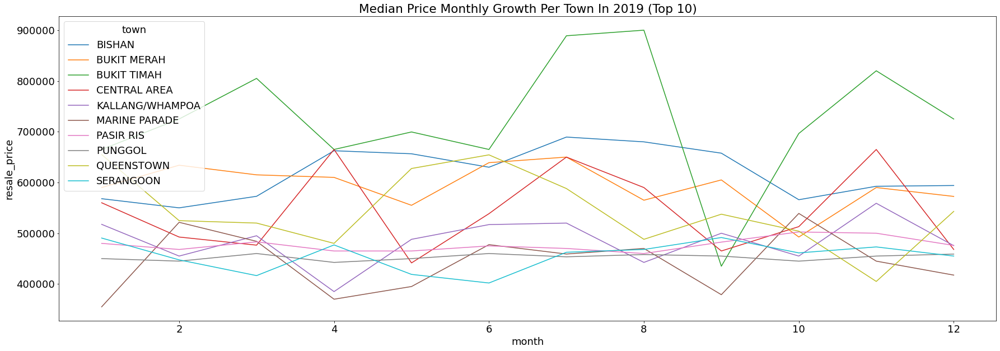

In [75]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('town', 10, 2019)
plt.show()

_VOLUME GENERAL_

           town  resale_price
20     SENGKANG  7.945188e+08
24    WOODLANDS  6.667484e+08
25       YISHUN  6.650752e+08
22     TAMPINES  6.579988e+08
13  JURONG WEST  6.567983e+08


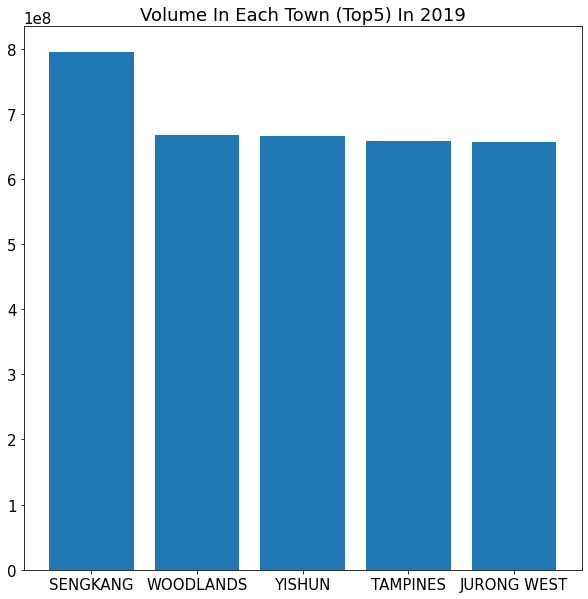

In [76]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

categoric_bar_volume_year("town", 5, 2019)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month           town  resale_price
1        1          BEDOK    33414500.0
4        1    BUKIT MERAH    25928676.0
5        1  BUKIT PANJANG    21124088.0
11       1        HOUGANG    20618680.0
13       1    JURONG WEST    43254552.0
..     ...            ...           ...
303     12        PUNGGOL    48151260.0
306     12       SENGKANG    61457416.0
308     12       TAMPINES    58182020.0
310     12      WOODLANDS    50093628.0
311     12         YISHUN    67513840.0

[120 rows x 3 columns]


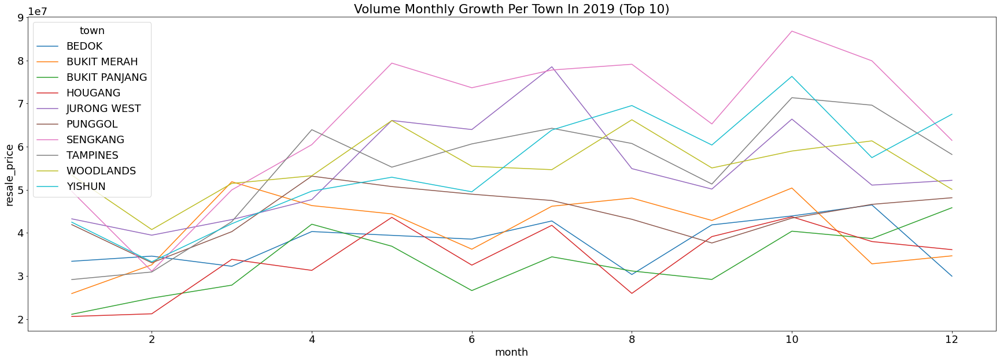

In [77]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('town', 10, 2019)
plt.show()

___________________________________
__FLAT TYPE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

          flat_type  year_month
3            4 ROOM        9228
4            5 ROOM        5427
2            3 ROOM        5423
5         EXECUTIVE        1669
1            2 ROOM         414
6  MULTI-GENERATION          14
0            1 ROOM          11


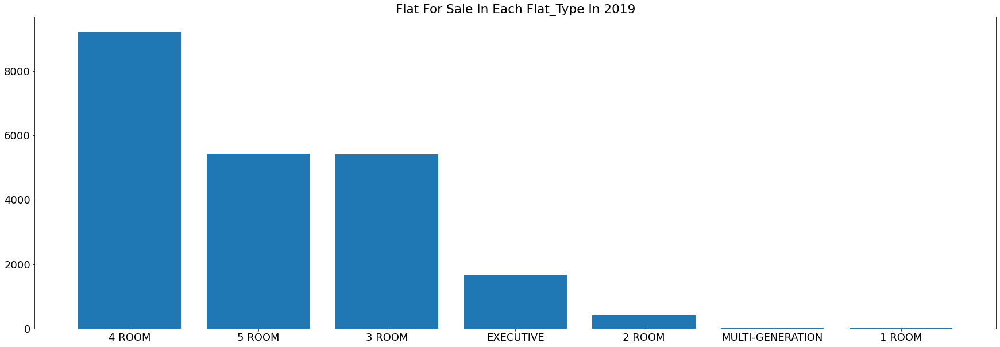

In [78]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_type",None,2019)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

    month  flat_type  number
0       1     1 ROOM       1
1       1     2 ROOM      18
2       1     3 ROOM     393
3       1     4 ROOM     650
4       1     5 ROOM     366
..    ...        ...     ...
69     12     2 ROOM      34
70     12     3 ROOM     475
71     12     4 ROOM     765
72     12     5 ROOM     431
73     12  EXECUTIVE     143

[74 rows x 3 columns]


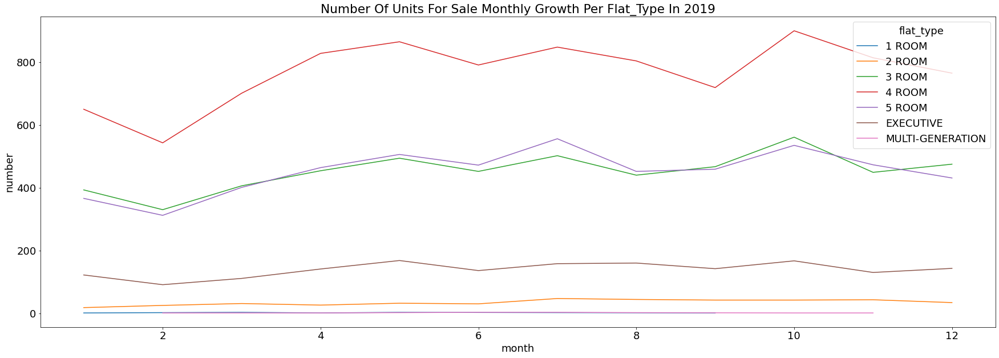

In [79]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_type', None, 2019)
plt.show()

_PRICE AVERAGE GENERAL_

          flat_type  resale_price
6  MULTI-GENERATION      819444.0
5         EXECUTIVE      595000.0
4            5 ROOM      482500.0
3            4 ROOM      400000.0
2            3 ROOM      283000.0
1            2 ROOM      225000.0
0            1 ROOM      173268.0


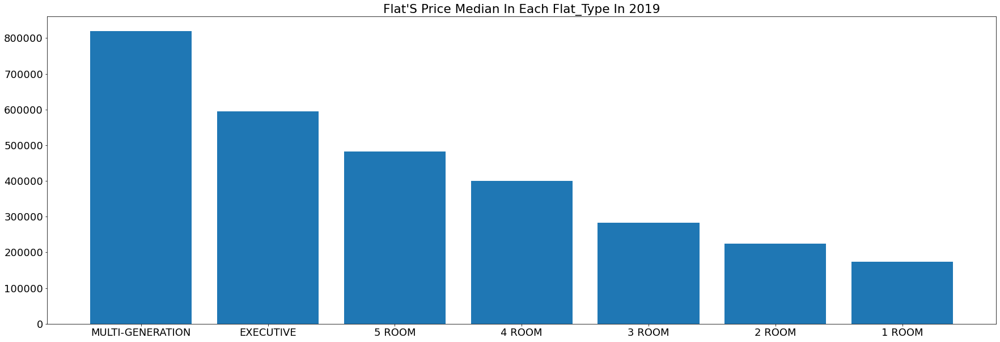

In [80]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_type", None, 2019)
plt.show()

_PRICE GRWOTH (MONTHLY)_

    month  flat_type  resale_price
0       1     1 ROOM      172000.0
1       1     2 ROOM      236000.0
2       1     3 ROOM      285000.0
3       1     4 ROOM      395000.0
4       1     5 ROOM      470000.0
..    ...        ...           ...
69     12     2 ROOM      225500.0
70     12     3 ROOM      285000.0
71     12     4 ROOM      405000.0
72     12     5 ROOM      485000.0
73     12  EXECUTIVE      590000.0

[74 rows x 3 columns]


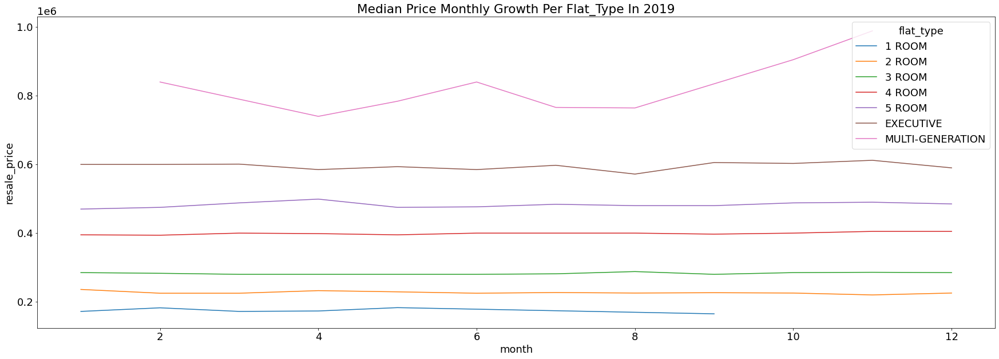

In [81]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_type', None, 2019)
plt.show()

_VOLUME GENERAL_

          flat_type  resale_price
3            4 ROOM  3.965723e+09
4            5 ROOM  2.859007e+09
2            3 ROOM  1.623957e+09
5         EXECUTIVE  1.030710e+09
1            2 ROOM  9.461313e+07
6  MULTI-GENERATION  1.146866e+07
0            1 ROOM  1.934268e+06


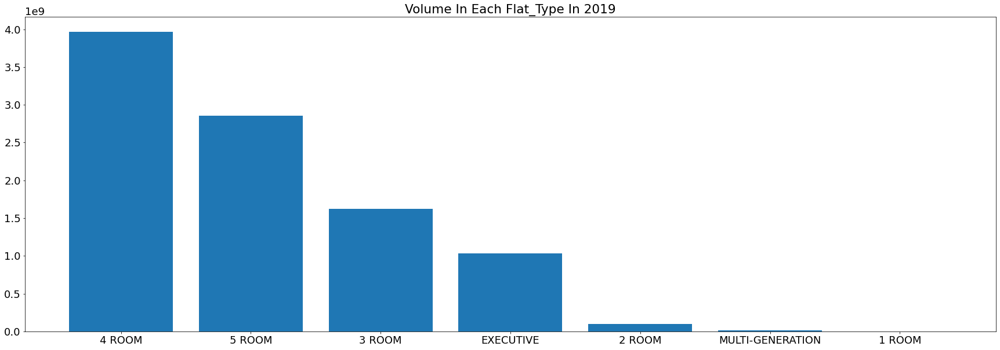

In [82]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_type", None, 2019)
plt.show()

_VOLUME GROWTH (MONTHLY)_

    month  flat_type  resale_price
0       1     1 ROOM      172000.0
1       1     2 ROOM     4191000.0
2       1     3 ROOM   117111427.0
3       1     4 ROOM   277752752.0
4       1     5 ROOM   190441488.0
..    ...        ...           ...
69     12     2 ROOM     7578088.0
70     12     3 ROOM   143015212.0
71     12     4 ROOM   331913540.0
72     12     5 ROOM   225416202.0
73     12  EXECUTIVE    89643316.0

[74 rows x 3 columns]


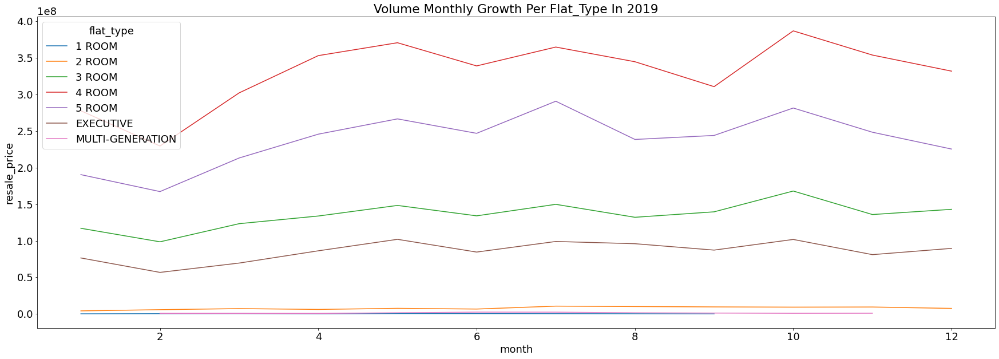

In [83]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_type', None, 2019)

plt.show()

___________________________________
__STOREY RANGE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

   storey_range  year_month
1      04 TO 06        5193
2      07 TO 09        4650
3      10 TO 12        4210
0      01 TO 03        4037
4      13 TO 15        2035
5      16 TO 18         984
6      19 TO 21         405
7      22 TO 24         310
8      25 TO 27         144
9      28 TO 30          96
10     31 TO 33          35
12     37 TO 39          34
11     34 TO 36          29
13     40 TO 42          17
15     46 TO 48           4
14     43 TO 45           2
16     49 TO 51           1


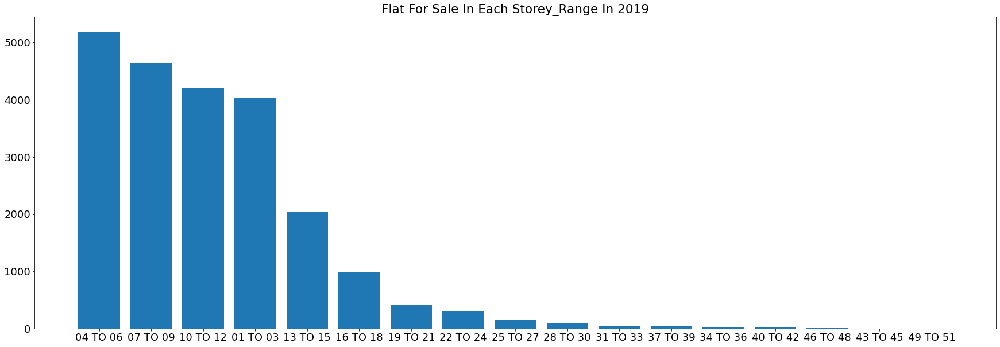

In [84]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("storey_range",None,2019)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month storey_range  number
0        1     01 TO 03     249
1        1     04 TO 06     364
2        1     07 TO 09     335
3        1     10 TO 12     301
4        1     13 TO 15     144
..     ...          ...     ...
165     12     28 TO 30       7
166     12     31 TO 33       4
167     12     37 TO 39       1
168     12     40 TO 42       1
169     12     46 TO 48       1

[170 rows x 3 columns]


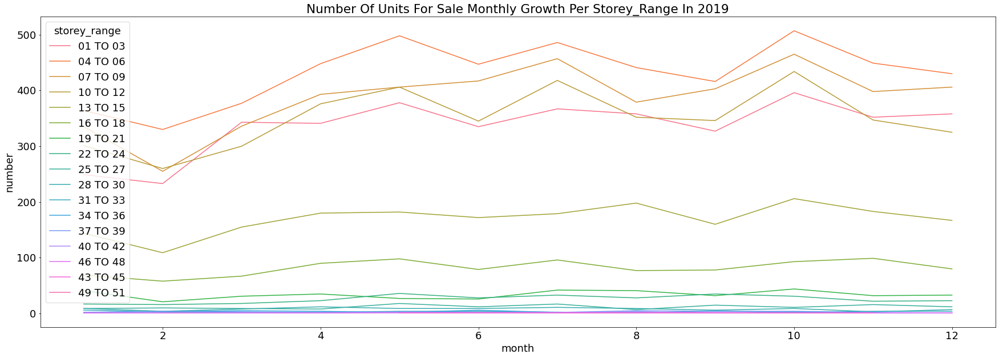

In [85]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('storey_range', None, 2019)
plt.show()

_PRICE AVERAGE GENERAL_

   storey_range  resale_price
16     49 TO 51     1110000.0
15     46 TO 48     1078400.0
14     43 TO 45     1049000.0
13     40 TO 42      950000.0
12     37 TO 39      888500.0
11     34 TO 36      825000.0
10     31 TO 33      815000.0
9      28 TO 30      790000.0
8      25 TO 27      669000.0
6      19 TO 21      585000.0
7      22 TO 24      580000.0
5      16 TO 18      468000.0
4      13 TO 15      445000.0
3      10 TO 12      408000.0
2      07 TO 09      398000.0
1      04 TO 06      380000.0
0      01 TO 03      363000.0


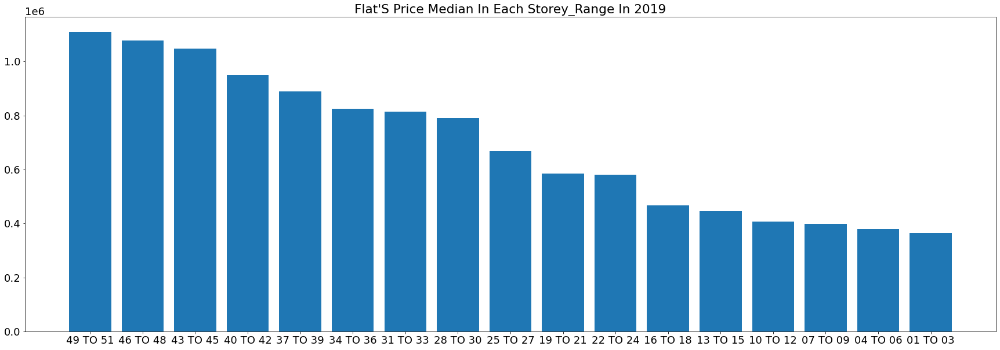

In [86]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("storey_range", None, 2019)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03      350000.0
1        1     04 TO 06      365000.0
2        1     07 TO 09      388000.0
3        1     10 TO 12      400888.0
4        1     13 TO 15      445000.0
..     ...          ...           ...
165     12     28 TO 30      710000.0
166     12     31 TO 33      797500.0
167     12     37 TO 39      373000.0
168     12     40 TO 42      980000.0
169     12     46 TO 48     1056800.0

[170 rows x 3 columns]


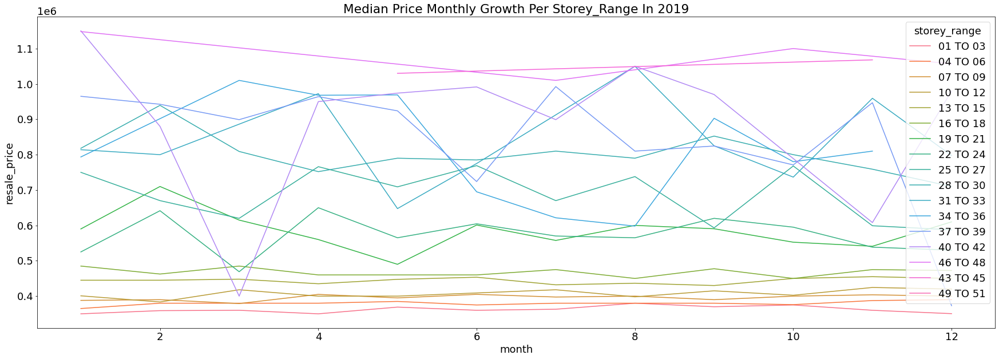

In [87]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('storey_range', None, 2019)
plt.show()

_VOLUME GENERAL_

   storey_range  resale_price
1      04 TO 06  2.098643e+09
2      07 TO 09  1.947594e+09
3      10 TO 12  1.825731e+09
0      01 TO 03  1.565851e+09
4      13 TO 15  9.521834e+08
5      16 TO 18  5.014550e+08
6      19 TO 21  2.362488e+08
7      22 TO 24  1.859613e+08
8      25 TO 27  9.429550e+07
9      28 TO 30  7.453527e+07
12     37 TO 39  2.954658e+07
10     31 TO 33  2.839989e+07
11     34 TO 36  2.350758e+07
13     40 TO 42  1.593689e+07
15     46 TO 48  4.314800e+06
14     43 TO 45  2.098000e+06
16     49 TO 51  1.110000e+06


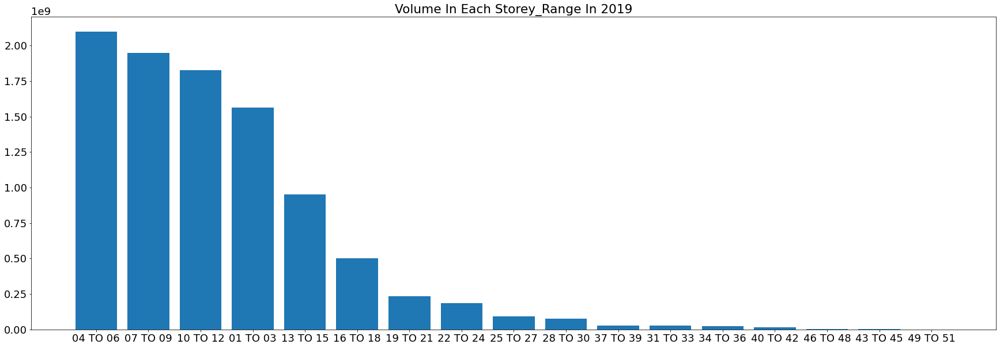

In [88]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("storey_range", None, 2019)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03    91635688.0
1        1     04 TO 06   143894861.0
2        1     07 TO 09   138070170.0
3        1     10 TO 12   132553180.0
4        1     13 TO 15    67128552.0
..     ...          ...           ...
165     12     28 TO 30     4737000.0
166     12     31 TO 33     3245000.0
167     12     37 TO 39      373000.0
168     12     40 TO 42      980000.0
169     12     46 TO 48     1056800.0

[170 rows x 3 columns]


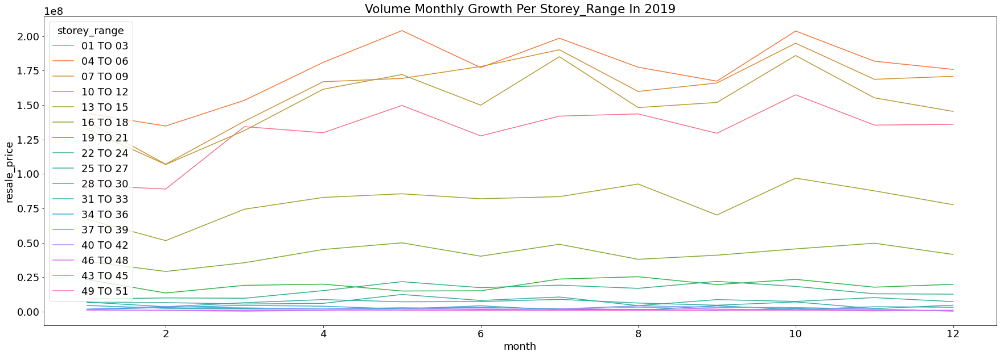

In [89]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('storey_range', None, 2019)
plt.show()

___________________________________
__FLAT MODEL__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           flat_model  year_month
6             Model A        7662
3            Improved        5552
10     New Generation        3052
11  Premium Apartment        2121
14         Simplified         928
1           Apartment         816
5          Maisonette         662
15           Standard         646
2                DBSS         310
8            Model A2         254


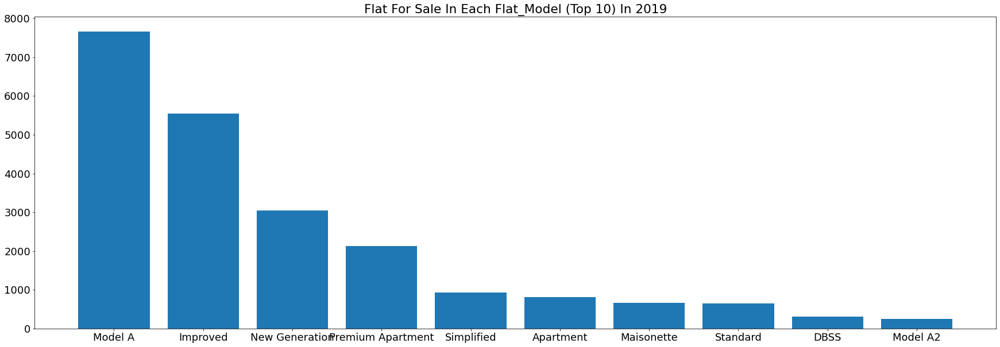

In [90]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_model",10,2019)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month         flat_model  number
1        1          Apartment      65
2        1               DBSS      21
3        1           Improved     387
4        1         Maisonette      42
5        1            Model A     523
..     ...                ...     ...
180     12           Model A2      21
181     12     New Generation     264
182     12  Premium Apartment     165
184     12         Simplified      82
185     12           Standard      58

[120 rows x 3 columns]


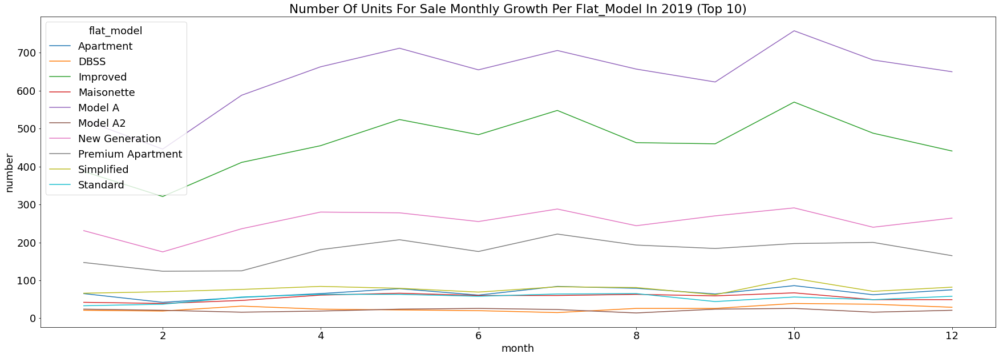

In [91]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_model', 10, 2019)
plt.show()

_PRICE AVERAGE GENERAL_

                flat_model  resale_price
18                 Type S2     1044000.0
17                 Type S1      950000.0
12  Premium Apartment Loft      904444.0
9         Multi Generation      819444.0
16                 Terrace      765000.0
2                     DBSS      725000.0
4      Improved-Maisonette      704000.0
7       Model A-Maisonette      664000.0
5               Maisonette      640000.0
13      Premium Maisonette      637500.0


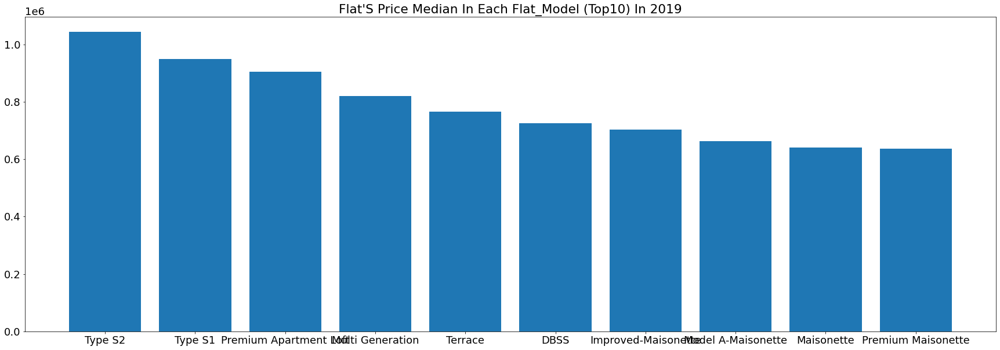

In [92]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_model", 10, 2019)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month              flat_model  resale_price
2        1                    DBSS      718188.0
4        1              Maisonette      651944.0
9        1  Premium Apartment Loft      910888.0
12       1                 Terrace      660000.0
13       1                 Type S1      840000.0
..     ...                     ...           ...
177     12              Maisonette      665000.0
179     12      Model A-Maisonette      780000.0
183     12  Premium Apartment Loft      871000.0
186     12                 Type S1      970088.0
187     12                 Type S2      945888.0

[80 rows x 3 columns]


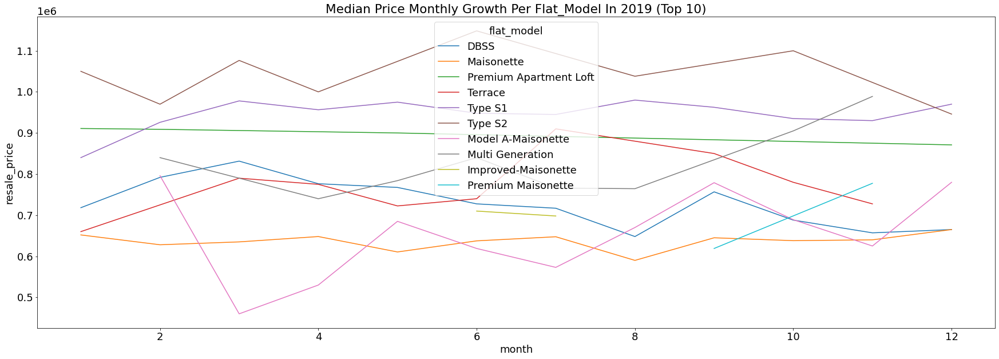

In [93]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_model', 10, 2019)
plt.show()

_VOLUME GENERAL_

           flat_model  resale_price
6             Model A  3.203867e+09
3            Improved  2.498106e+09
10     New Generation  9.759880e+08
11  Premium Apartment  9.740612e+08
1           Apartment  4.872891e+08
5          Maisonette  4.379558e+08
14         Simplified  3.061404e+08
15           Standard  2.495897e+08
2                DBSS  2.260889e+08
8            Model A2  8.559346e+07


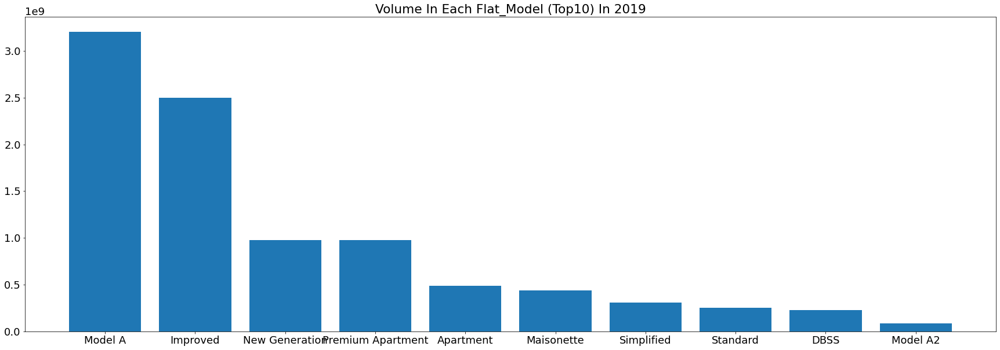

In [94]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_model", 10, 2019)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month         flat_model  resale_price
1        1          Apartment    40232276.0
2        1               DBSS    14510688.0
3        1           Improved   173295023.0
4        1         Maisonette    28095388.0
5        1            Model A   215940096.0
..     ...                ...           ...
180     12           Model A2     7049500.0
181     12     New Generation    84407992.0
182     12  Premium Apartment    75832804.0
184     12         Simplified    26746876.0
185     12           Standard    22256768.0

[120 rows x 3 columns]


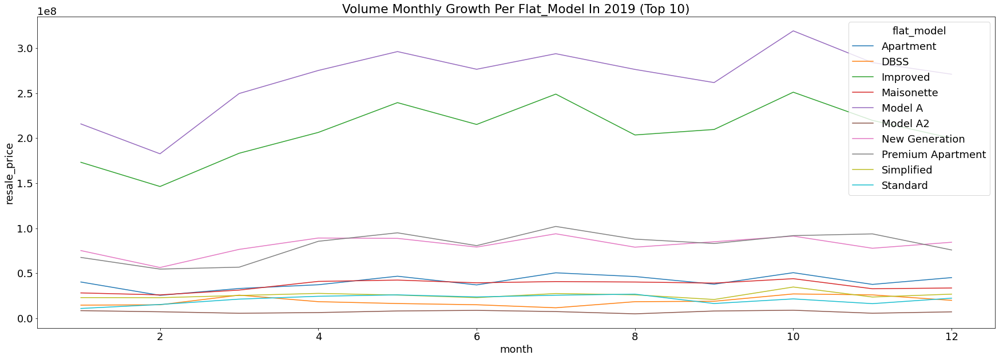

In [95]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_model', 10, 2019)
plt.show()

#########################################################################################################################

__2020__

#########################################################################################################################

___________________________________
__MONTH__
___________________________________

_NUMBER OF UNIT SALE_

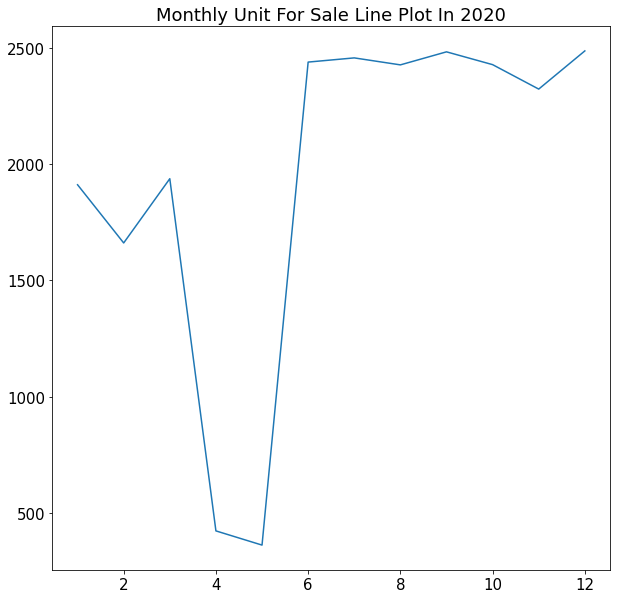

,year_month,year,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,year_remaining_lease,med_storey_range
month,,,,,,,,,,,,,
1,1911,1911,1911,1911,1911,1911,1911,1911,1911,1911,1911,1911,1911
2,1661,1661,1661,1661,1661,1661,1661,1661,1661,1661,1661,1661,1661
3,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937
4,424,424,424,424,424,424,424,424,424,424,424,424,424
5,363,363,363,363,363,363,363,363,363,363,363,363,363
6,2438,2438,2438,2438,2438,2438,2438,2438,2438,2438,2438,2438,2438
7,2456,2456,2456,2456,2456,2456,2456,2456,2456,2456,2456,2456,2456
8,2426,2426,2426,2426,2426,2426,2426,2426,2426,2426,2426,2426,2426
9,2482,2482,2482,2482,2482,2482,2482,2482,2482,2482,2482,2482,2482


In [96]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

group_month_2020_num = df[df['year']==2020].groupby("month").count()
plt.plot(group_month_2020_num[group_month_2020_num.columns[0]])
plt.title(("monthly unit for sale Line Plot in 2020").title())
plt.show()
group_month_2020_num

_PRICE_

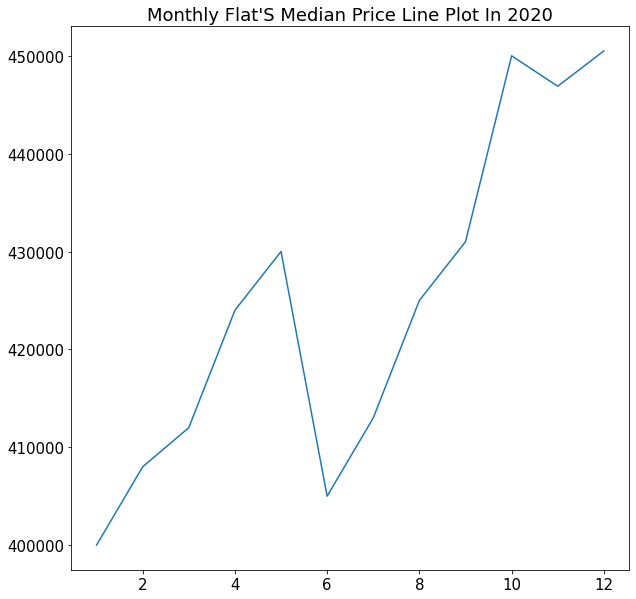

In [97]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

group_month_2020_price = df[df['year']==2020].groupby("month").median()
plt.plot(group_month_2020_price["resale_price"])
plt.title(("monthly flat's median price Line Plot in 2020").title())
plt.show()

_VOLUME_

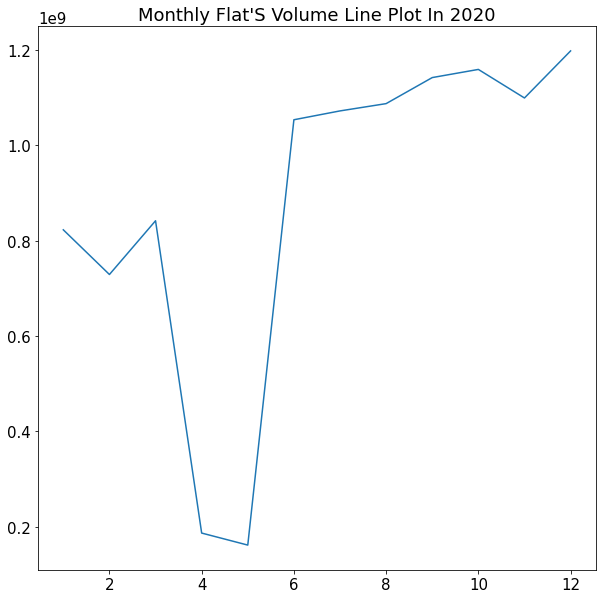

In [98]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

group_month_2020_vol = df[df['year']==2020].groupby("month").sum()
plt.plot(group_month_2020_vol["resale_price"])
plt.title(("monthly flat's volume Line Plot in 2020").title())
plt.show()

___________________________________
__TOWN__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           town  year_month
20     SENGKANG        2159
17      PUNGGOL        1748
22     TAMPINES        1700
25       YISHUN        1692
13  JURONG WEST        1439


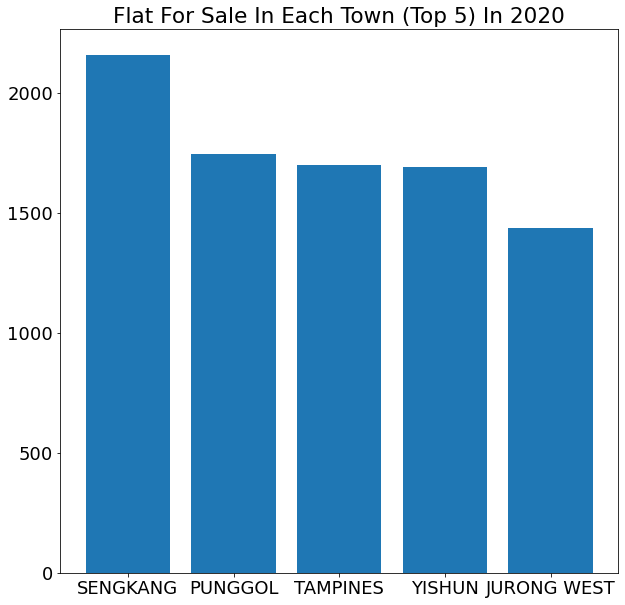

In [99]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("town",5
                       ,2020)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month           town  number
0        1     ANG MO KIO      87
1        1          BEDOK     107
5        1  BUKIT PANJANG     103
11       1        HOUGANG      95
13       1    JURONG WEST     138
..     ...            ...     ...
301     12        PUNGGOL     216
304     12       SENGKANG     251
306     12       TAMPINES     195
308     12      WOODLANDS     139
309     12         YISHUN     125

[120 rows x 3 columns]


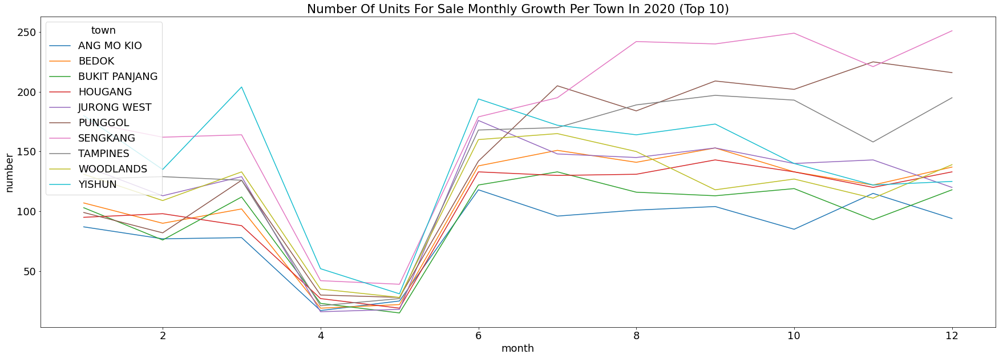

In [100]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('town', 10, 2020)
plt.show()

_PRICE AVERAGE GENERAL_

           town  resale_price
6   BUKIT TIMAH      710888.0
18   QUEENSTOWN      657000.0
2        BISHAN      600000.0
4   BUKIT MERAH      580000.0
16    PASIR RIS      500000.0


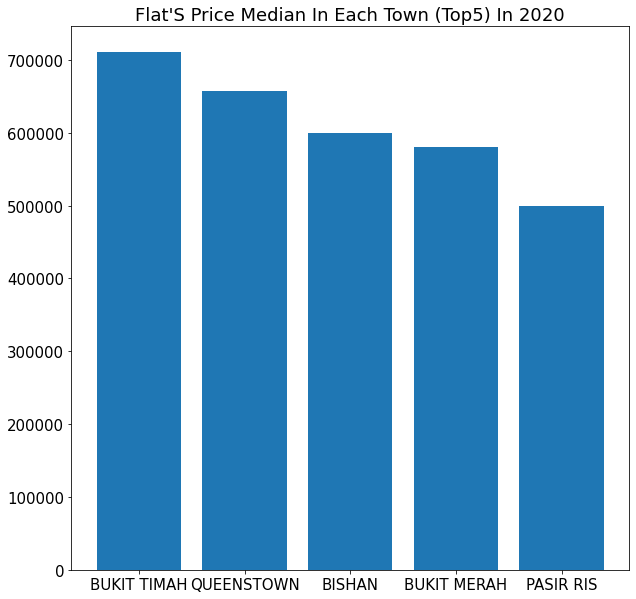

In [101]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

categoric_bar_price_year("town", 5, 2020)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month             town  resale_price
2        1           BISHAN      660000.0
4        1      BUKIT MERAH      606000.0
6        1      BUKIT TIMAH      589029.0
7        1     CENTRAL AREA      375000.0
14       1  KALLANG/WHAMPOA      490000.0
..     ...              ...           ...
300     12        PASIR RIS      515000.0
301     12          PUNGGOL      472694.0
302     12       QUEENSTOWN      720500.0
305     12        SERANGOON      466944.0
306     12         TAMPINES      490000.0

[118 rows x 3 columns]


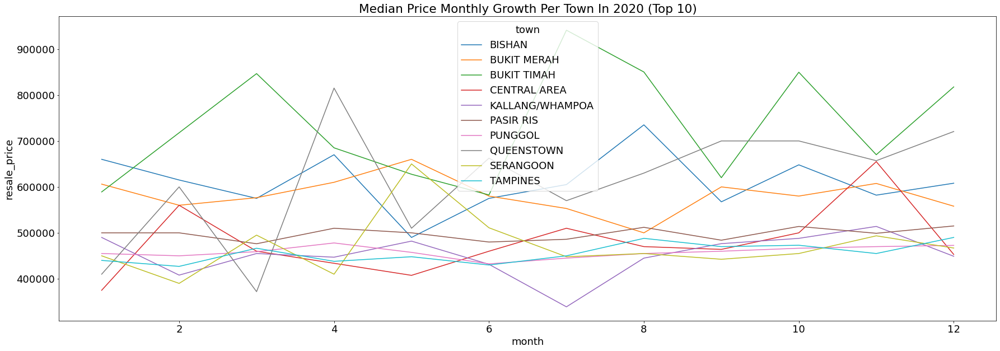

In [102]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('town', 10, 2020)
plt.show()

_VOLUME GENERAL_

             town  resale_price
20       SENGKANG  9.819338e+08
22       TAMPINES  8.210809e+08
17        PUNGGOL  8.183814e+08
25         YISHUN  6.490398e+08
13    JURONG WEST  5.941924e+08
11        HOUGANG  5.688246e+08
24      WOODLANDS  5.626163e+08
1           BEDOK  5.408635e+08
5   BUKIT PANJANG  5.005650e+08
4     BUKIT MERAH  4.472474e+08


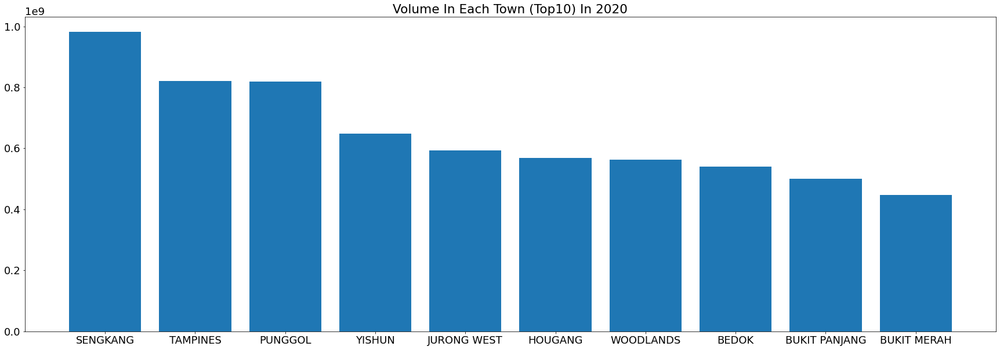

In [103]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("town", 10, 2020)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month           town  resale_price
1        1          BEDOK    43904376.0
4        1    BUKIT MERAH    36770052.0
5        1  BUKIT PANJANG    42899252.0
11       1        HOUGANG    41567552.0
13       1    JURONG WEST    54839435.0
..     ...            ...           ...
301     12        PUNGGOL   105271875.0
304     12       SENGKANG   118043702.0
306     12       TAMPINES    99899112.0
308     12      WOODLANDS    61891652.0
309     12         YISHUN    50534940.0

[120 rows x 3 columns]


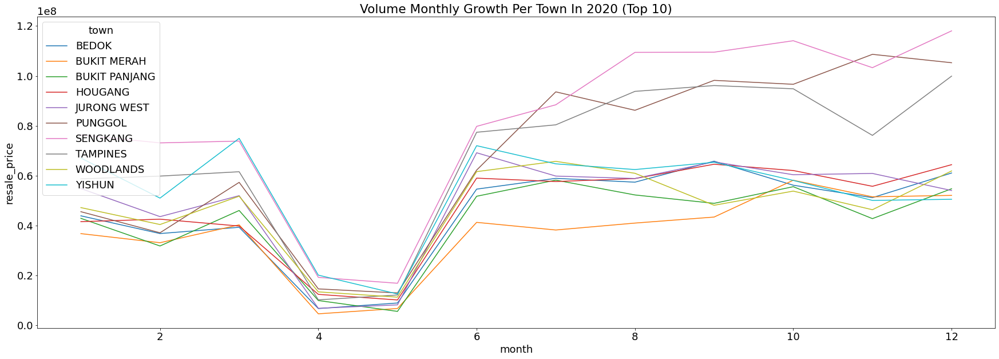

In [104]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('town', 10, 2020)
plt.show()

___________________________________
__FLAT TYPE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

   flat_type  year_month
3     4 ROOM        9647
4     5 ROOM        5984
2     3 ROOM        5384
5  EXECUTIVE        1882
1     2 ROOM         418


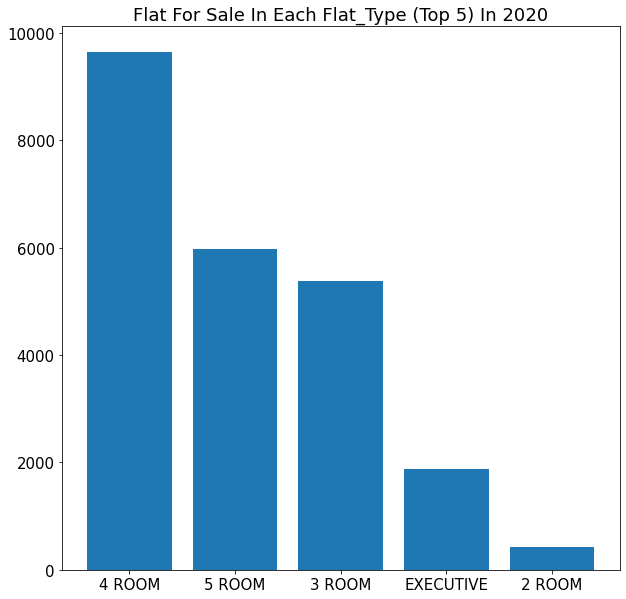

In [105]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 15})

categoric_bar_uni_year("flat_type",5,2020)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

    month  flat_type  number
0       1     2 ROOM      34
1       1     3 ROOM     453
2       1     4 ROOM     824
3       1     5 ROOM     469
4       1  EXECUTIVE     131
..    ...        ...     ...
66     12     2 ROOM      30
67     12     3 ROOM     547
68     12     4 ROOM     994
69     12     5 ROOM     697
70     12  EXECUTIVE     218

[71 rows x 3 columns]


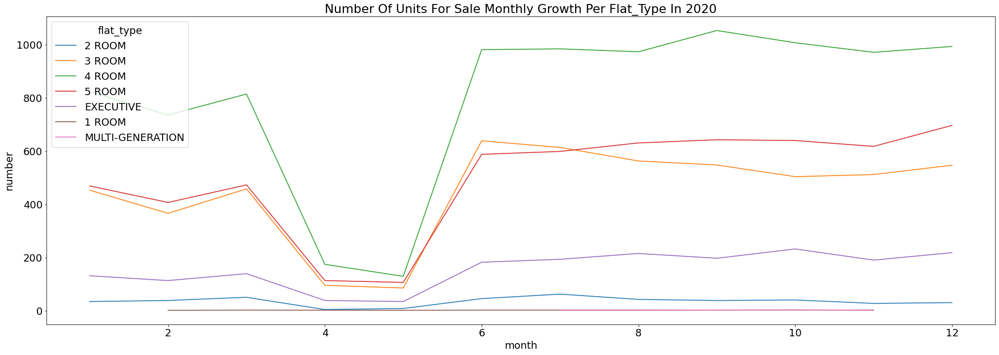

In [106]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_type', None, 2020)
plt.show()

_PRICE AVERAGE GENERAL_

          flat_type  resale_price
6  MULTI-GENERATION      762500.0
5         EXECUTIVE      618000.0
4            5 ROOM      508844.0
3            4 ROOM      420000.0
2            3 ROOM      295000.0


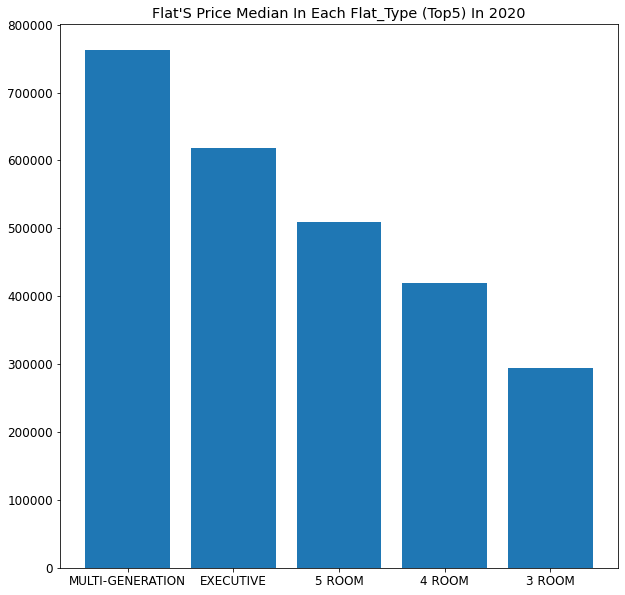

In [107]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 12})

categoric_bar_price_year("flat_type", 5, 2020)
plt.show()

_PRICE GRWOTH (MONTHLY)_

    month  flat_type  resale_price
0       1     2 ROOM      225750.0
1       1     3 ROOM      290000.0
2       1     4 ROOM      395000.0
3       1     5 ROOM      493000.0
4       1  EXECUTIVE      590000.0
..    ...        ...           ...
66     12     2 ROOM      241000.0
67     12     3 ROOM      305000.0
68     12     4 ROOM      440000.0
69     12     5 ROOM      530000.0
70     12  EXECUTIVE      650000.0

[71 rows x 3 columns]


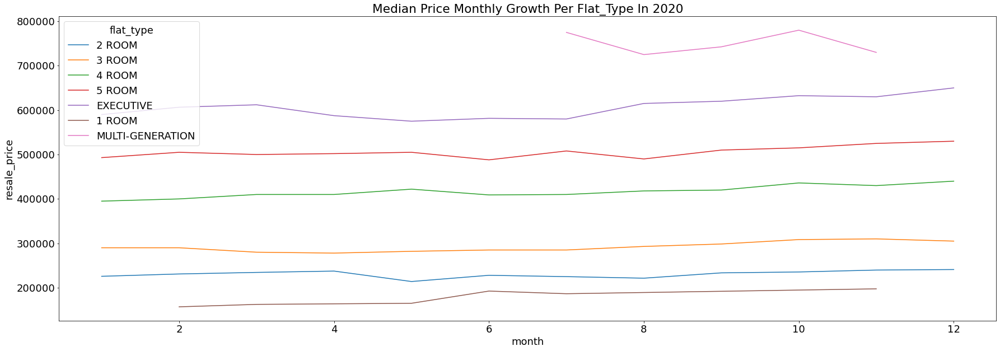

In [108]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_type', None, 2020)
plt.show()

_VOLUME GENERAL_

          flat_type  resale_price
3            4 ROOM  4.327724e+09
4            5 ROOM  3.240081e+09
2            3 ROOM  1.683624e+09
5         EXECUTIVE  1.195813e+09
1            2 ROOM  9.780744e+07
6  MULTI-GENERATION  6.185000e+06
0            1 ROOM  1.800000e+06


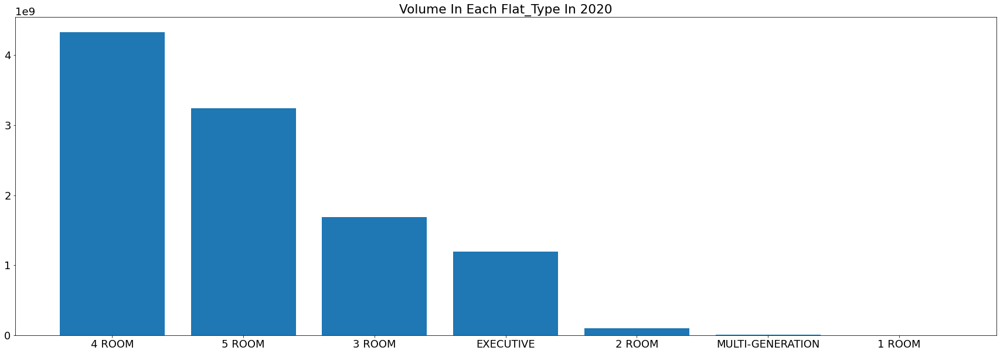

In [109]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_type", None, 2020)
plt.show()

_VOLUME GROWTH (MONTHLY)_

    month  flat_type  resale_price
0       1     2 ROOM     7786300.0
1       1     3 ROOM   137974796.0
2       1     4 ROOM   349881180.0
3       1     5 ROOM   244675467.0
4       1  EXECUTIVE    82423184.0
..    ...        ...           ...
66     12     2 ROOM     7304000.0
67     12     3 ROOM   179370592.0
68     12     4 ROOM   470573990.0
69     12     5 ROOM   395317617.0
70     12  EXECUTIVE   145223456.0

[71 rows x 3 columns]


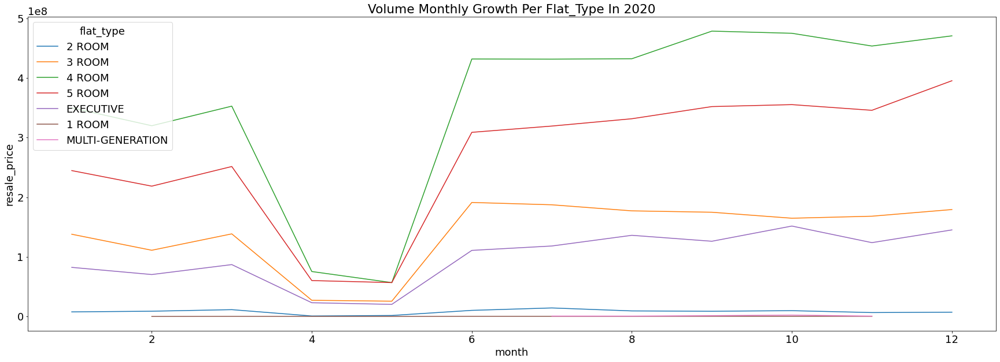

In [110]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_type', None, 2020)
plt.show()

___________________________________
__STOREY RANGE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

   storey_range  year_month
1      04 TO 06        5488
2      07 TO 09        4763
0      01 TO 03        4329
3      10 TO 12        4179
4      13 TO 15        2237
5      16 TO 18        1075
6      19 TO 21         440
7      22 TO 24         313
8      25 TO 27         198
9      28 TO 30         119
10     31 TO 33          57
12     37 TO 39          48
11     34 TO 36          43
13     40 TO 42          29
14     43 TO 45           7
15     46 TO 48           6
16     49 TO 51           2


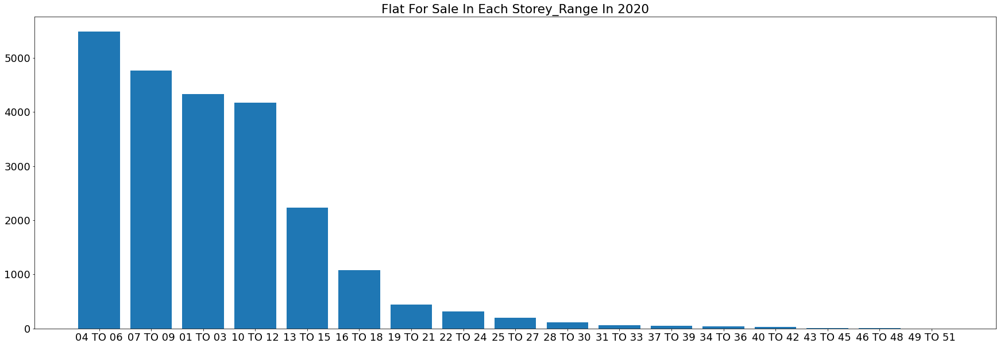

In [111]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("storey_range",None,2020)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month storey_range  number
0        1     01 TO 03     365
1        1     04 TO 06     442
2        1     07 TO 09     421
3        1     10 TO 12     313
4        1     13 TO 15     184
..     ...          ...     ...
164     12     31 TO 33       8
165     12     34 TO 36       6
166     12     37 TO 39       7
167     12     40 TO 42       6
168     12     43 TO 45       2

[169 rows x 3 columns]


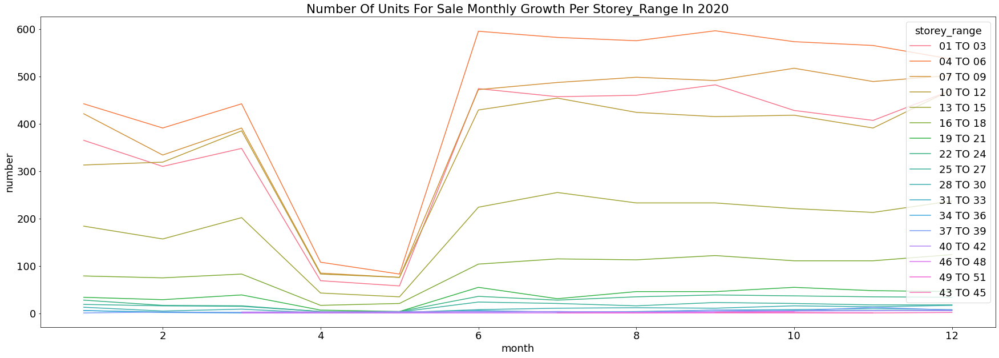

In [112]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('storey_range', None, 2020)
plt.show()

_PRICE AVERAGE GENERAL_

   storey_range  resale_price
16     49 TO 51     1166500.0
15     46 TO 48     1015000.0
14     43 TO 45      890000.0
13     40 TO 42      855000.0
12     37 TO 39      850000.0
11     34 TO 36      820000.0
9      28 TO 30      815000.0
10     31 TO 33      798888.0
8      25 TO 27      620000.0
7      22 TO 24      575000.0
6      19 TO 21      550000.0
5      16 TO 18      490000.0
4      13 TO 15      463000.0
3      10 TO 12      430000.0
2      07 TO 09      420000.0
1      04 TO 06      408000.0
0      01 TO 03      383000.0


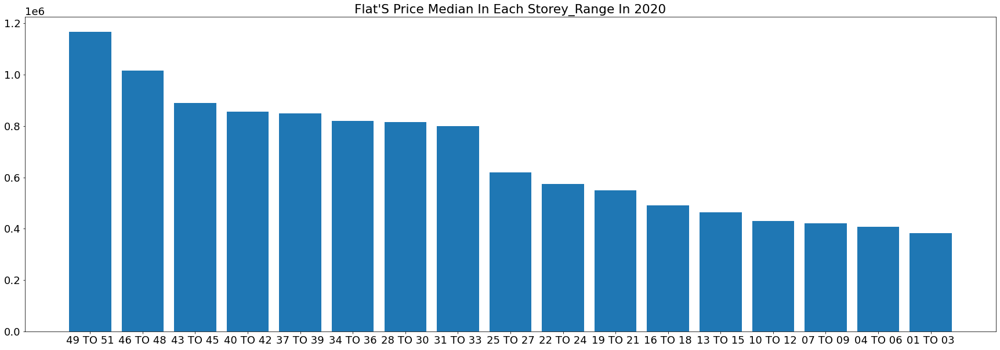

In [113]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("storey_range", None, 2020)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03      365000.0
1        1     04 TO 06      385000.0
2        1     07 TO 09      390000.0
3        1     10 TO 12      415000.0
4        1     13 TO 15      430944.0
..     ...          ...           ...
164     12     31 TO 33      795000.0
165     12     34 TO 36      920944.0
166     12     37 TO 39      860000.0
167     12     40 TO 42      840000.0
168     12     43 TO 45      865000.0

[169 rows x 3 columns]


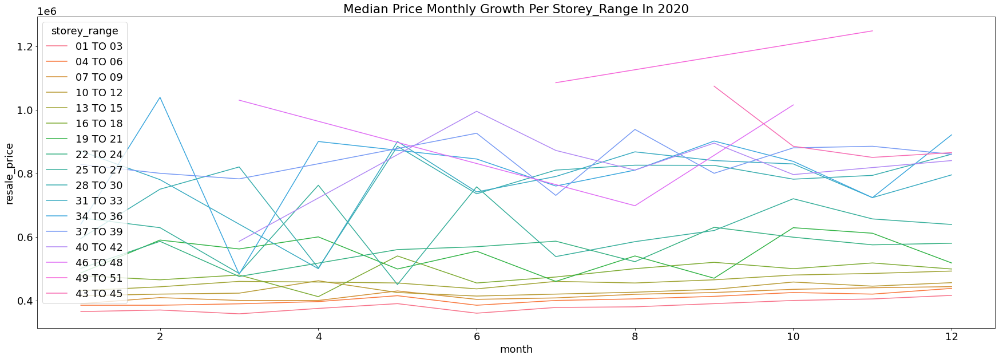

In [114]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('storey_range', None, 2020)
plt.show()

_VOLUME GENERAL_

   storey_range  resale_price
1      04 TO 06  2.342325e+09
2      07 TO 09  2.090865e+09
3      10 TO 12  1.887043e+09
0      01 TO 03  1.758241e+09
4      13 TO 15  1.092953e+09
5      16 TO 18  5.620150e+08
6      19 TO 21  2.521740e+08
7      22 TO 24  1.891083e+08
8      25 TO 27  1.273521e+08
9      28 TO 30  9.246829e+07
10     31 TO 33  4.524489e+07
12     37 TO 39  3.959880e+07
11     34 TO 36  3.374796e+07
13     40 TO 42  2.531066e+07
14     43 TO 45  6.498000e+06
15     46 TO 48  5.758000e+06
16     49 TO 51  2.333000e+06


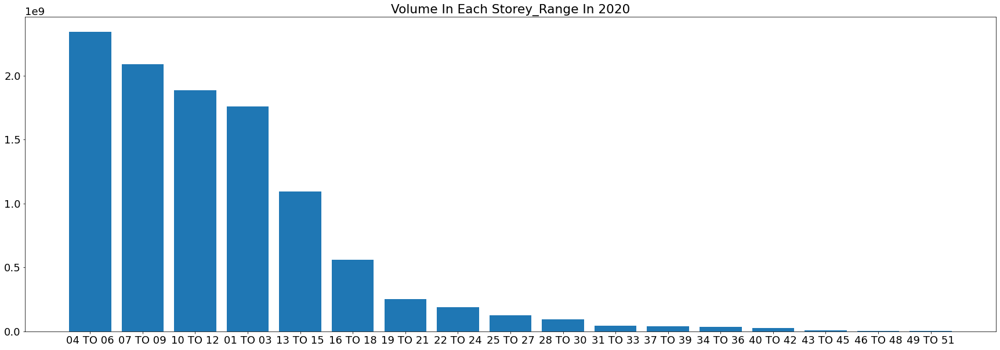

In [115]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("storey_range", None, 2020)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03   142471148.0
1        1     04 TO 06   178910475.0
2        1     07 TO 09   173394668.0
3        1     10 TO 12   138795760.0
4        1     13 TO 15    86379932.0
..     ...          ...           ...
164     12     31 TO 33     5794888.0
165     12     34 TO 36     5452888.0
166     12     37 TO 39     6143800.0
167     12     40 TO 42     5090000.0
168     12     43 TO 45     1730000.0

[169 rows x 3 columns]


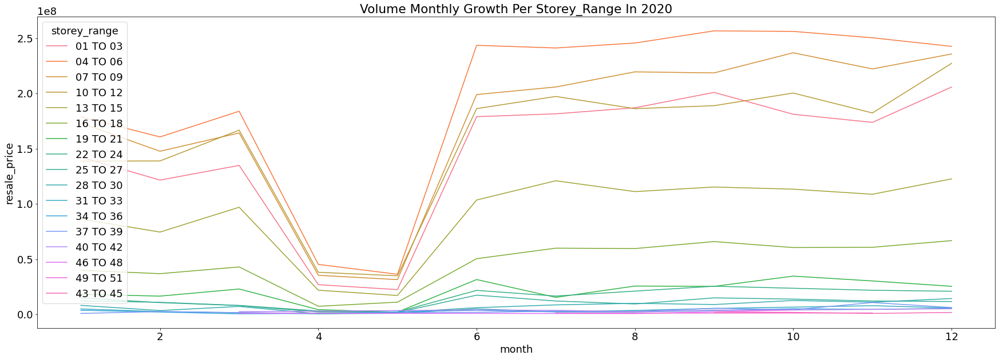

In [116]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('storey_range', None, 2020)
plt.show()

___________________________________
__FLAT MODEL__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           flat_model  year_month
7             Model A        7835
4            Improved        5865
11     New Generation        2851
12  Premium Apartment        2617
2           Apartment         941
15         Simplified         864
6          Maisonette         725
16           Standard         669
3                DBSS         567
9            Model A2         214


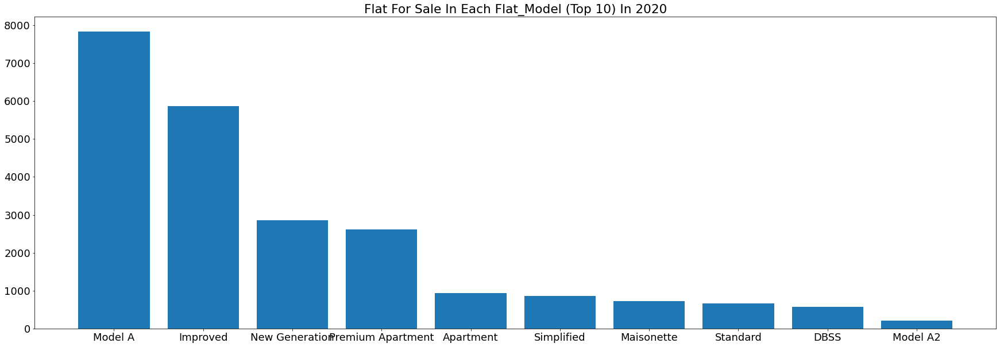

In [117]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_model",10,2020)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month         flat_model  number
2        1          Apartment      65
3        1               DBSS      37
4        1           Improved     474
5        1         Maisonette      51
6        1            Model A     666
..     ...                ...     ...
181     12           Model A2      14
182     12     New Generation     281
183     12  Premium Apartment     301
185     12         Simplified      86
186     12           Standard      92

[120 rows x 3 columns]


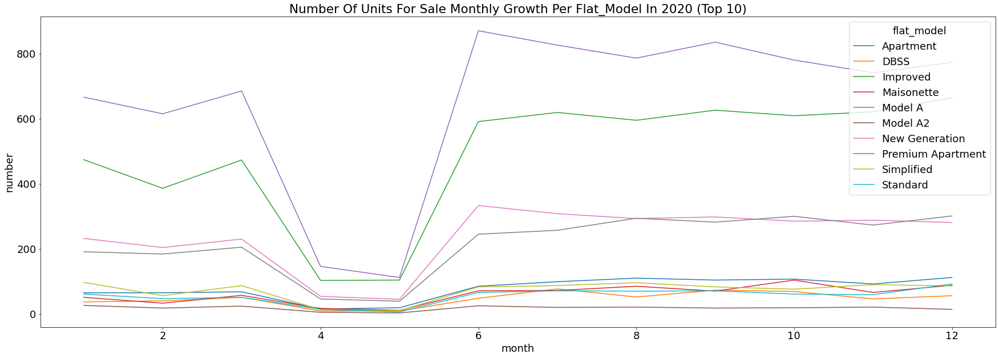

In [118]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_model', 10, 2020)
plt.show()

_PRICE AVERAGE GENERAL_

                flat_model  resale_price
19                 Type S2     1100000.0
18                 Type S1      954000.0
13  Premium Apartment Loft      872500.0
17                 Terrace      835000.0
10        Multi Generation      762500.0
14      Premium Maisonette      720000.0
3                     DBSS      715000.0
8       Model A-Maisonette      705000.0
5      Improved-Maisonette      682500.0
6               Maisonette      655000.0


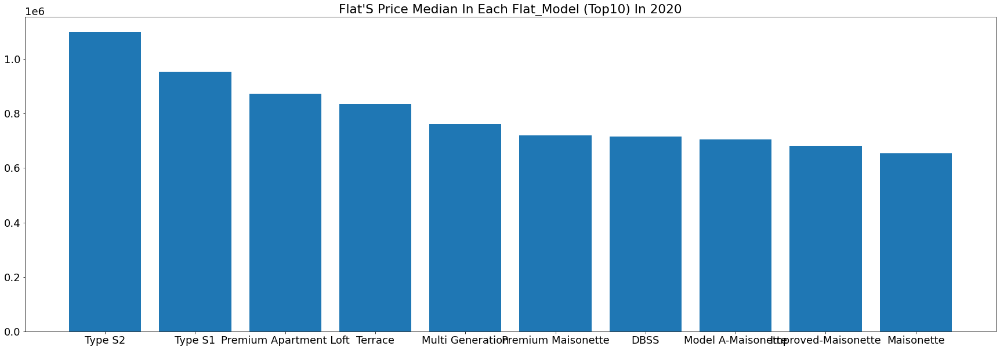

In [119]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_model", 10, 2020)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month              flat_model  resale_price
3        1                    DBSS      718000.0
5        1              Maisonette      628888.0
12       1                 Terrace      787500.0
13       1                 Type S1      958000.0
17       2                    DBSS      721500.0
..     ...                     ...           ...
178     12              Maisonette      668000.0
180     12      Model A-Maisonette      701500.0
184     12  Premium Apartment Loft      887500.0
187     12                 Terrace      797500.0
188     12                 Type S1      935000.0

[78 rows x 3 columns]


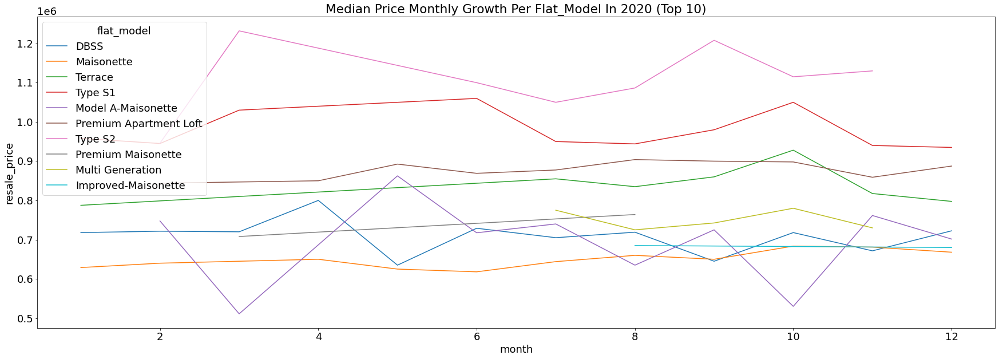

In [120]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_model', 10, 2020)
plt.show()

_VOLUME GENERAL_

           flat_model  resale_price
7             Model A  3.355563e+09
4            Improved  2.725211e+09
12  Premium Apartment  1.295597e+09
11     New Generation  9.346695e+08
2           Apartment  5.855471e+08
6          Maisonette  4.889059e+08
3                DBSS  3.979016e+08
15         Simplified  2.952019e+08
16           Standard  2.514600e+08
9            Model A2  7.624624e+07


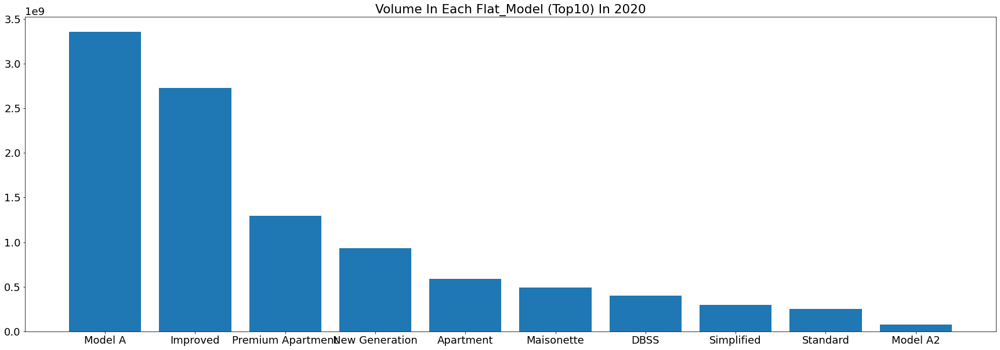

In [121]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_model", 10, 2020)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month         flat_model  resale_price
2        1          Apartment    40845020.0
3        1               DBSS    25956518.0
4        1           Improved   218099618.0
5        1         Maisonette    33388164.0
6        1            Model A   275196338.0
..     ...                ...           ...
181     12           Model A2     5620388.0
182     12     New Generation    97875092.0
183     12  Premium Apartment   160041616.0
185     12         Simplified    31089166.0
186     12           Standard    37065776.0

[120 rows x 3 columns]


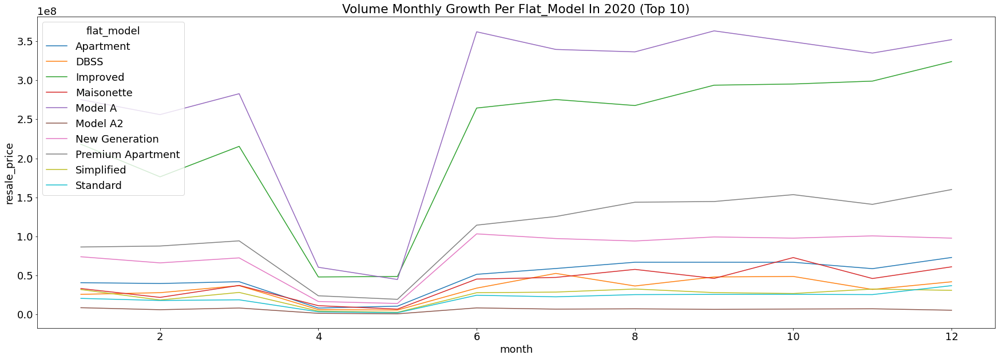

In [122]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_model', 10, 2020)
plt.show()

#########################################################################################################################

__2021__

#########################################################################################################################

___________________________________
__TOWN__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

             town  year_month
20       SENGKANG        2752
17        PUNGGOL        2744
22       TAMPINES        2151
25         YISHUN        1751
24      WOODLANDS        1638
1           BEDOK        1616
8   CHOA CHU KANG        1572
13    JURONG WEST        1502
11        HOUGANG        1473
4     BUKIT MERAH        1173


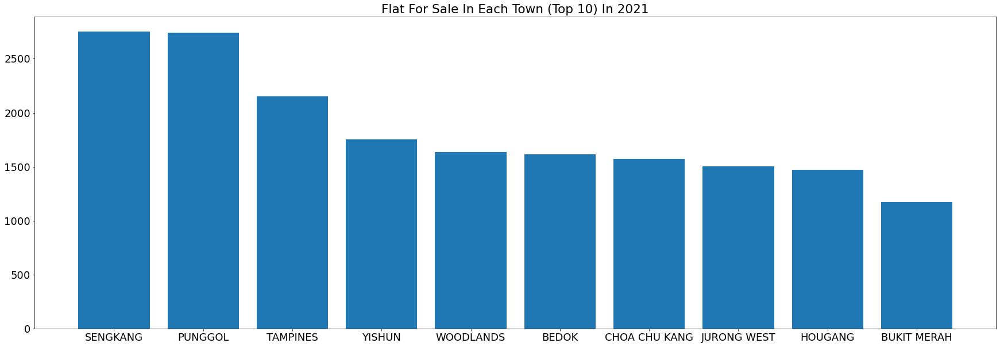

In [123]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("town",10,2021)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month           town  number
1        1          BEDOK     151
4        1    BUKIT MERAH      91
8        1  CHOA CHU KANG     116
11       1        HOUGANG     112
13       1    JURONG WEST     141
..     ...            ...     ...
303     12        PUNGGOL     218
306     12       SENGKANG     241
308     12       TAMPINES     175
310     12      WOODLANDS     144
311     12         YISHUN     181

[120 rows x 3 columns]


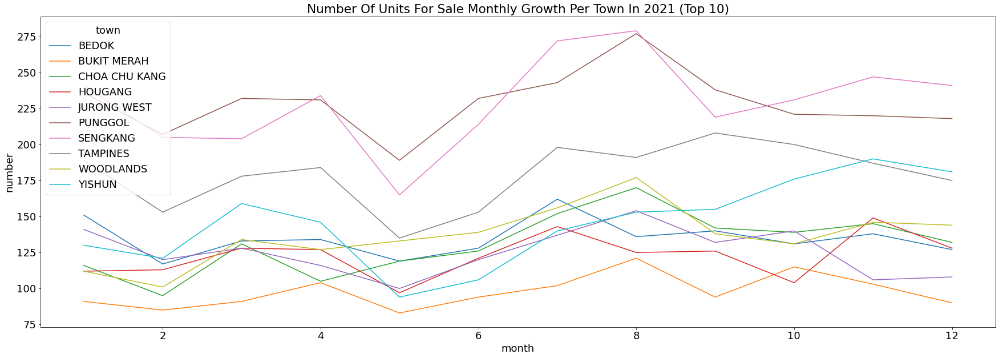

In [124]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('town', 10, 2021)
plt.show()

_PRICE AVERAGE GENERAL_

               town  resale_price
18       QUEENSTOWN      705000.0
6       BUKIT TIMAH      703300.0
7      CENTRAL AREA      665000.0
2            BISHAN      640000.0
4       BUKIT MERAH      630000.0
16        PASIR RIS      555000.0
14  KALLANG/WHAMPOA      538000.0
9          CLEMENTI      531500.0
21        SERANGOON      514000.0
22         TAMPINES      505000.0


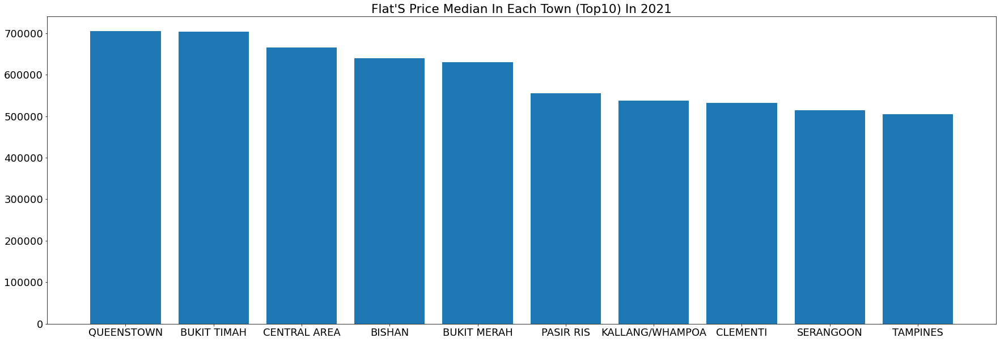

In [125]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("town", 10, 2021)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month             town  resale_price
2        1           BISHAN      600000.0
4        1      BUKIT MERAH      620000.0
6        1      BUKIT TIMAH      738000.0
7        1     CENTRAL AREA      480000.0
9        1         CLEMENTI      416500.0
..     ...              ...           ...
300     12  KALLANG/WHAMPOA      632500.0
302     12        PASIR RIS      560000.0
304     12       QUEENSTOWN      680000.0
307     12        SERANGOON      508000.0
308     12         TAMPINES      520000.0

[120 rows x 3 columns]


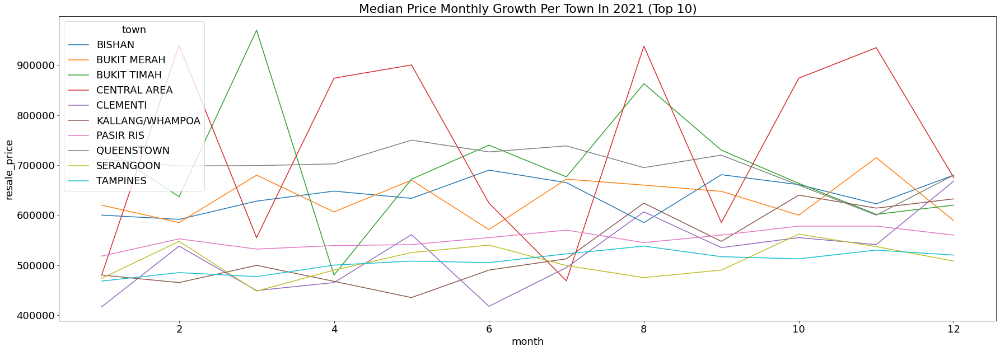

In [126]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('town', 10, 2021)
plt.show()

_VOLUME GENERAL_

             town  resale_price
17        PUNGGOL  1.409730e+09
20       SENGKANG  1.377812e+09
22       TAMPINES  1.132527e+09
25         YISHUN  7.711728e+08
1           BEDOK  7.648802e+08
8   CHOA CHU KANG  7.594962e+08
24      WOODLANDS  7.585399e+08
11        HOUGANG  7.436275e+08
4     BUKIT MERAH  7.152405e+08
13    JURONG WEST  6.844718e+08


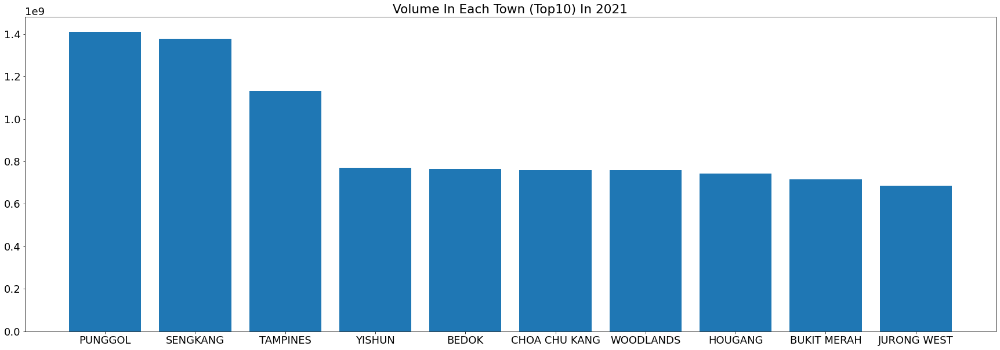

In [127]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("town", 10, 2021)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month           town  resale_price
1        1          BEDOK    70290664.0
4        1    BUKIT MERAH    52883064.0
8        1  CHOA CHU KANG    50945982.0
11       1        HOUGANG    54494604.0
13       1    JURONG WEST    61499828.0
..     ...            ...           ...
303     12        PUNGGOL   117883820.0
306     12       SENGKANG   125227145.0
308     12       TAMPINES    94963316.0
310     12      WOODLANDS    69700154.0
311     12         YISHUN    84721480.0

[120 rows x 3 columns]


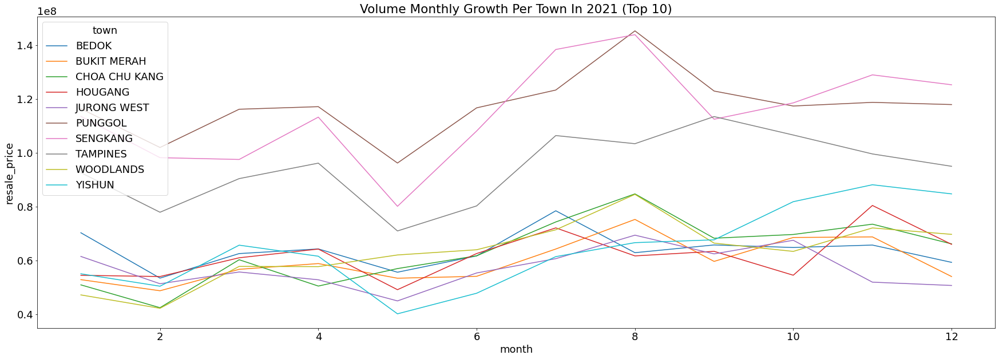

In [128]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('town', 10, 2021)
plt.show()

___________________________________
__FLAT TYPE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

          flat_type  year_month
3            4 ROOM       12354
4            5 ROOM        7807
2            3 ROOM        6271
5         EXECUTIVE        2261
1            2 ROOM         386
6  MULTI-GENERATION          18
0            1 ROOM           9


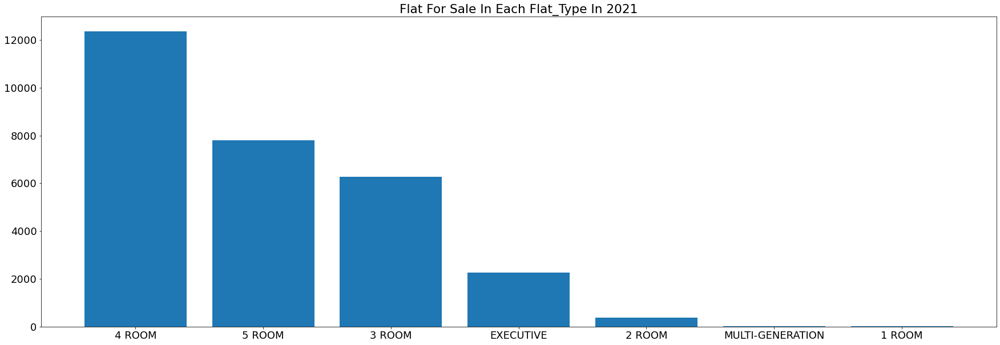

In [129]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_type",None,2021)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

    month         flat_type  number
0       1            1 ROOM       1
1       1            2 ROOM      38
2       1            3 ROOM     532
3       1            4 ROOM    1046
4       1            5 ROOM     651
..    ...               ...     ...
72     12            3 ROOM     536
73     12            4 ROOM    1054
74     12            5 ROOM     624
75     12         EXECUTIVE     177
76     12  MULTI-GENERATION       2

[77 rows x 3 columns]


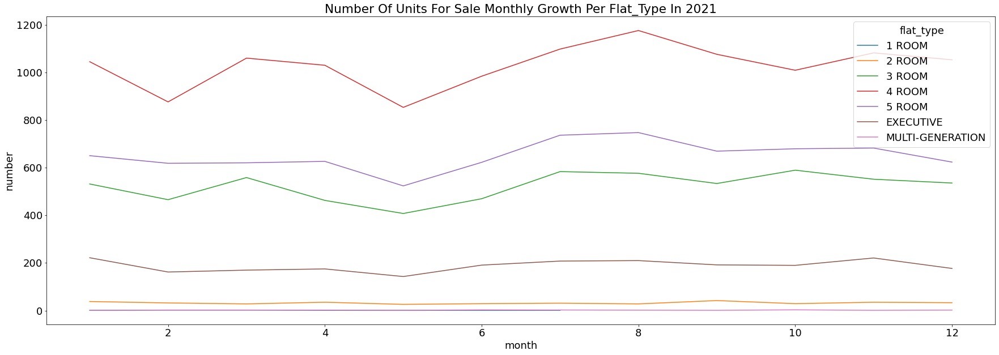

In [130]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_type', None, 2021)
plt.show()

_PRICE AVERAGE GENERAL_

          flat_type  resale_price
6  MULTI-GENERATION      855000.0
5         EXECUTIVE      690000.0
4            5 ROOM      570000.0
3            4 ROOM      470000.0
2            3 ROOM      335000.0
1            2 ROOM      265000.0
0            1 ROOM      198000.0


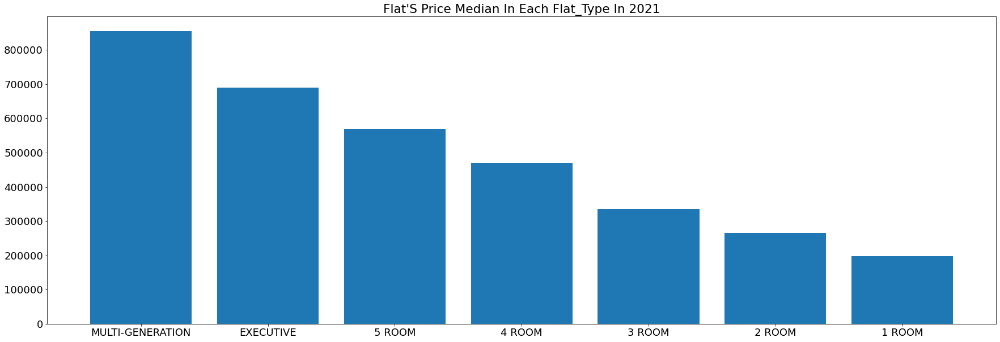

In [131]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_type", None, 2021)
plt.show()

_PRICE GRWOTH (MONTHLY)_

    month         flat_type  resale_price
0       1            1 ROOM      182000.0
1       1            2 ROOM      245000.0
2       1            3 ROOM      317000.0
3       1            4 ROOM      448000.0
4       1            5 ROOM      535000.0
..    ...               ...           ...
72     12            3 ROOM      350000.0
73     12            4 ROOM      490000.0
74     12            5 ROOM      588000.0
75     12         EXECUTIVE      720000.0
76     12  MULTI-GENERATION      857500.0

[77 rows x 3 columns]


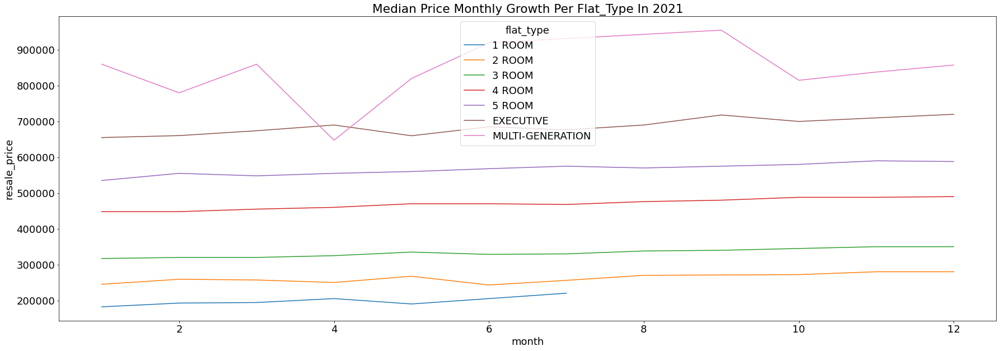

In [132]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_type', None, 2021)
plt.show()

_VOLUME GENERAL_

          flat_type  resale_price
3            4 ROOM  6.239774e+09
4            5 ROOM  4.715027e+09
2            3 ROOM  2.213222e+09
5         EXECUTIVE  1.595723e+09
1            2 ROOM  1.031979e+08
6  MULTI-GENERATION  1.477400e+07
0            1 ROOM  1.775000e+06


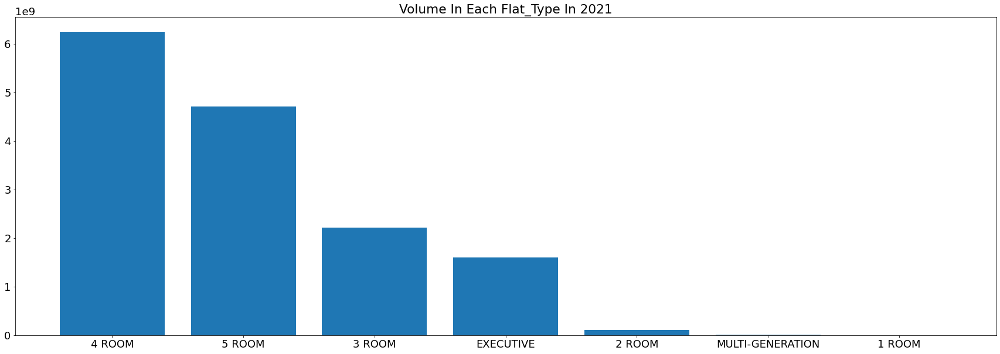

In [133]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_type", None, 2021)
plt.show()

_VOLUME GROWTH (MONTHLY)_

    month         flat_type  resale_price
0       1            1 ROOM  1.820000e+05
1       1            2 ROOM  9.772000e+06
2       1            3 ROOM  1.772452e+08
3       1            4 ROOM  4.968929e+08
4       1            5 ROOM  3.786300e+08
..    ...               ...           ...
72     12            3 ROOM  1.988232e+08
73     12            4 ROOM  5.551124e+08
74     12            5 ROOM  3.918537e+08
75     12         EXECUTIVE  1.324377e+08
76     12  MULTI-GENERATION  1.715000e+06

[77 rows x 3 columns]


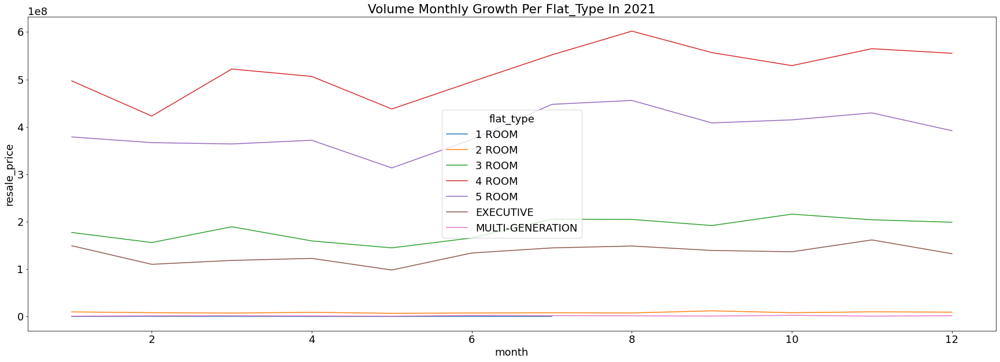

In [134]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_type', None, 2021)
plt.show()

___________________________________
__STOREY RANGE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

   storey_range  year_month
1      04 TO 06        6625
2      07 TO 09        5934
3      10 TO 12        5293
0      01 TO 03        5014
4      13 TO 15        2964
5      16 TO 18        1465
6      19 TO 21         590
7      22 TO 24         444
8      25 TO 27         256
9      28 TO 30         157
10     31 TO 33         113
11     34 TO 36          93
12     37 TO 39          83
13     40 TO 42          41
14     43 TO 45          21
15     46 TO 48          11
16     49 TO 51           2


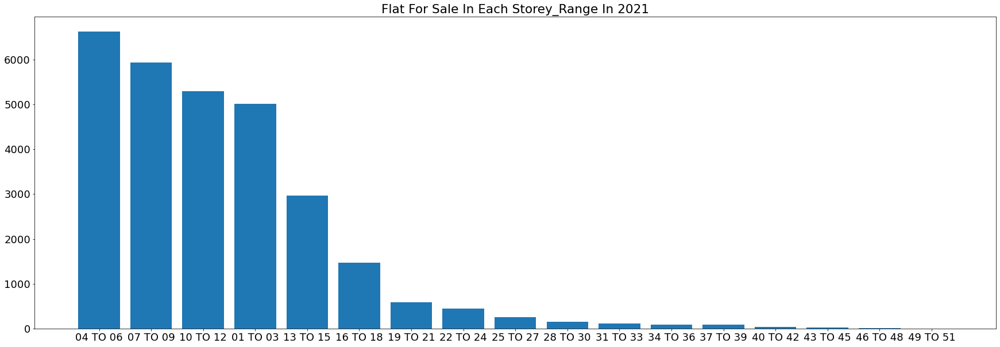

In [135]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("storey_range",None,2021)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month storey_range  number
0        1     01 TO 03     432
1        1     04 TO 06     584
2        1     07 TO 09     499
3        1     10 TO 12     442
4        1     13 TO 15     249
..     ...          ...     ...
183     12     34 TO 36       3
184     12     37 TO 39       6
185     12     40 TO 42       5
186     12     43 TO 45       3
187     12     46 TO 48       1

[188 rows x 3 columns]


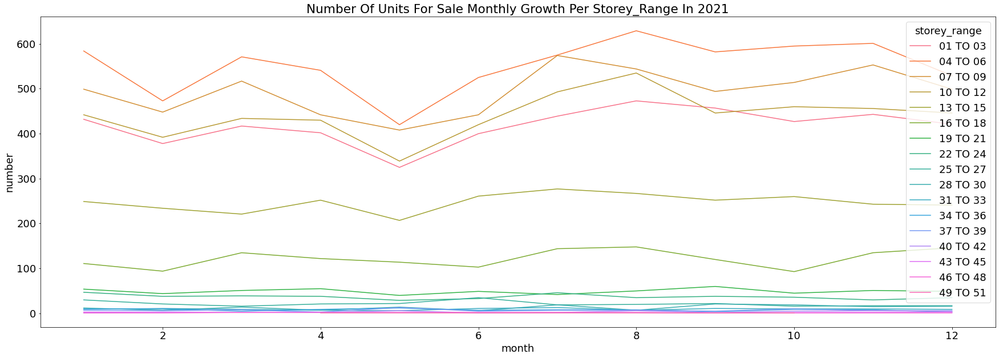

In [136]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('storey_range', None, 2021)
plt.show()

_PRICE AVERAGE GENERAL_

   storey_range  resale_price
16     49 TO 51     1165000.0
15     46 TO 48     1120000.0
13     40 TO 42      910000.0
14     43 TO 45      888000.0
11     34 TO 36      870888.0
12     37 TO 39      868888.0
10     31 TO 33      838000.0
9      28 TO 30      803500.0
8      25 TO 27      735500.0
7      22 TO 24      670444.0
6      19 TO 21      625000.0
5      16 TO 18      540000.0
4      13 TO 15      515000.0
3      10 TO 12      485000.0
2      07 TO 09      470888.0
1      04 TO 06      460000.0
0      01 TO 03      440000.0


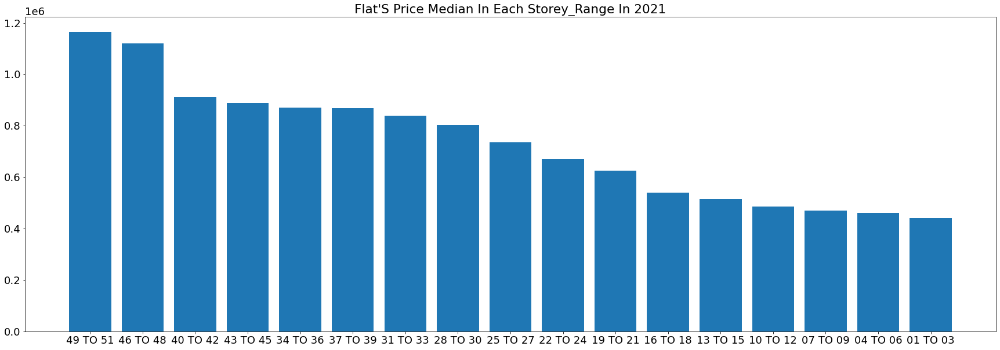

In [137]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("storey_range", None, 2021)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03      419000.0
1        1     04 TO 06      430000.0
2        1     07 TO 09      455000.0
3        1     10 TO 12      453500.0
4        1     13 TO 15      488000.0
..     ...          ...           ...
183     12     34 TO 36     1150000.0
184     12     37 TO 39      931944.0
185     12     40 TO 42     1138888.0
186     12     43 TO 45     1118000.0
187     12     46 TO 48     1280000.0

[188 rows x 3 columns]


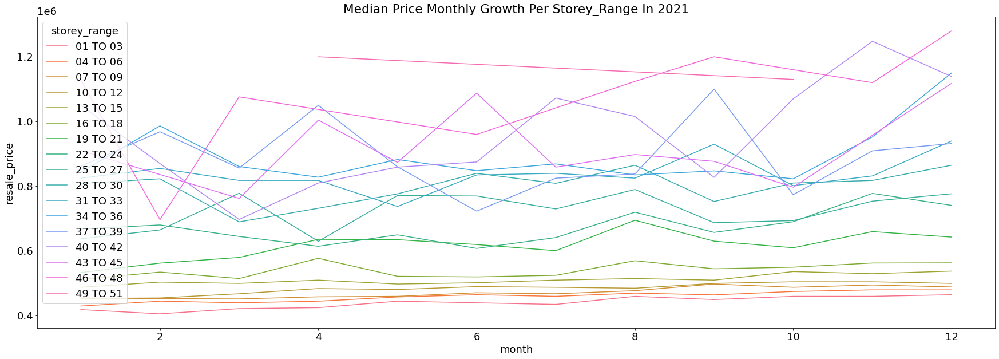

In [138]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('storey_range', None, 2021)
plt.show()

_VOLUME GENERAL_

   storey_range  resale_price
1      04 TO 06  3.202293e+09
2      07 TO 09  2.926209e+09
3      10 TO 12  2.679733e+09
0      01 TO 03  2.333819e+09
4      13 TO 15  1.597609e+09
5      16 TO 18  8.377836e+08
6      19 TO 21  3.763878e+08
7      22 TO 24  3.009563e+08
8      25 TO 27  1.828260e+08
9      28 TO 30  1.238002e+08
10     31 TO 33  9.389286e+07
11     34 TO 36  8.259488e+07
12     37 TO 39  7.253982e+07
13     40 TO 42  3.914578e+07
14     43 TO 45  1.982758e+07
15     46 TO 48  1.174500e+07
16     49 TO 51  2.330000e+06


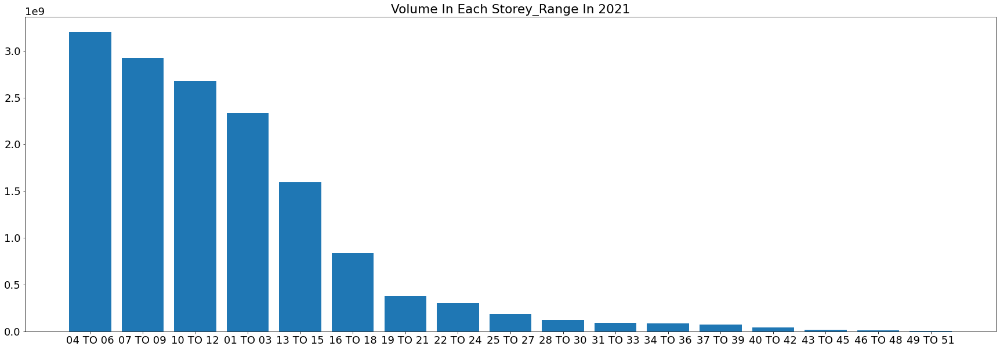

In [139]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("storey_range", None, 2021)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month storey_range  resale_price
0        1     01 TO 03   193694046.0
1        1     04 TO 06   267761267.0
2        1     07 TO 09   233895098.0
3        1     10 TO 12   208727481.0
4        1     13 TO 15   131887147.0
..     ...          ...           ...
183     12     34 TO 36     3338000.0
184     12     37 TO 39     5746664.0
185     12     40 TO 42     5576888.0
186     12     43 TO 45     3468000.0
187     12     46 TO 48     1280000.0

[188 rows x 3 columns]


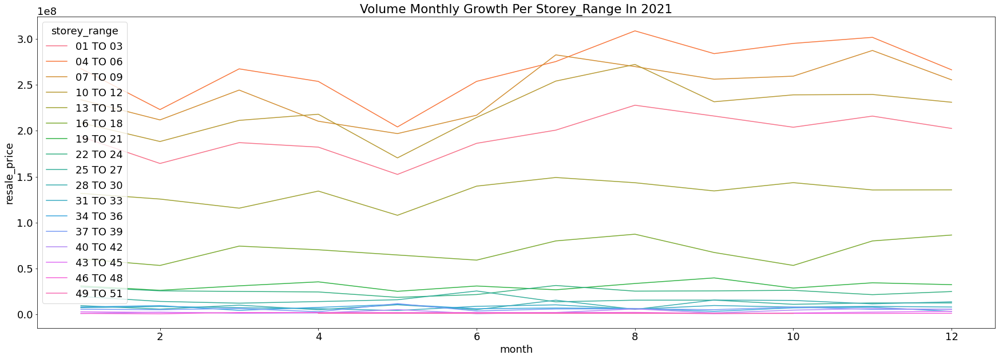

In [140]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('storey_range', None, 2021)
plt.show()

___________________________________
__FLAT MODEL__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           flat_model  year_month
7             Model A        9792
4            Improved        7218
12  Premium Apartment        3809
11     New Generation        3163
2           Apartment        1115
15         Simplified         961
6          Maisonette         888
16           Standard         840
3                DBSS         715
9            Model A2         284


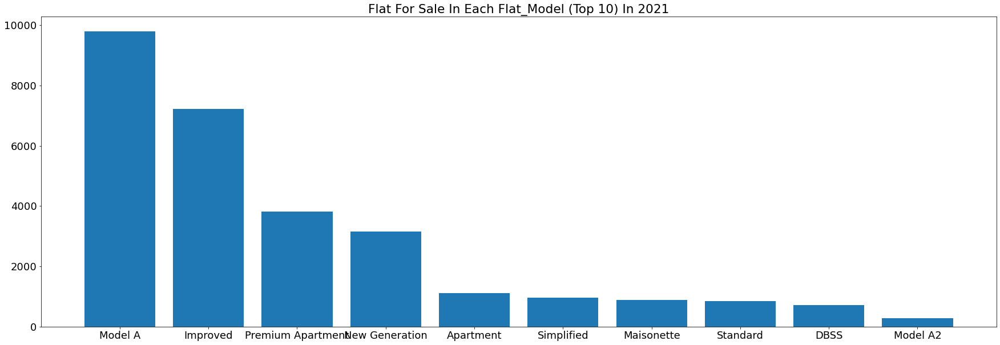

In [141]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_model",10,2021)
plt.show()

_NUMBER OF SELLING UNIT GRWOTH (MONTHLY)_

     month         flat_model  number
2        1          Apartment     114
3        1               DBSS      53
4        1           Improved     600
5        1         Maisonette      86
6        1            Model A     846
..     ...                ...     ...
200     12           Model A2      27
202     12     New Generation     272
203     12  Premium Apartment     303
205     12         Simplified      83
206     12           Standard      69

[120 rows x 3 columns]


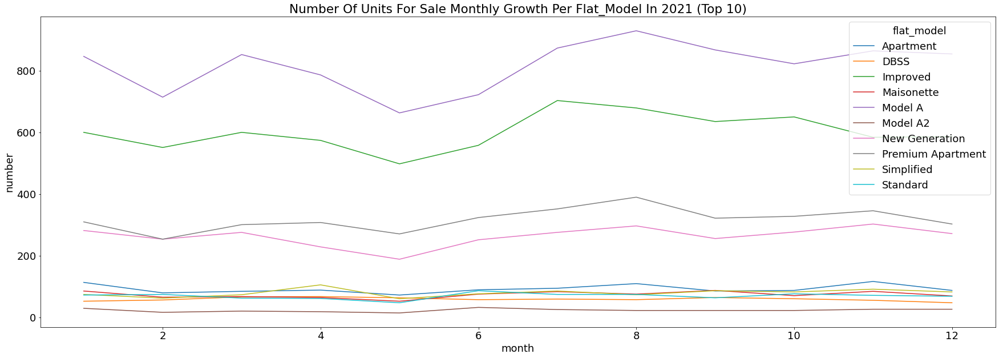

In [142]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_uni_monthly('flat_model', 10, 2021)
plt.show()

_PRICE AVERAGE GENERAL_

                flat_model  resale_price
19                 Type S2     1110000.0
18                 Type S1     1000000.0
13  Premium Apartment Loft      930888.0
17                 Terrace      895000.0
14      Premium Maisonette      890000.0
10        Multi Generation      855000.0
8       Model A-Maisonette      771000.0
1            Adjoined flat      735000.0
6               Maisonette      730000.0
3                     DBSS      730000.0


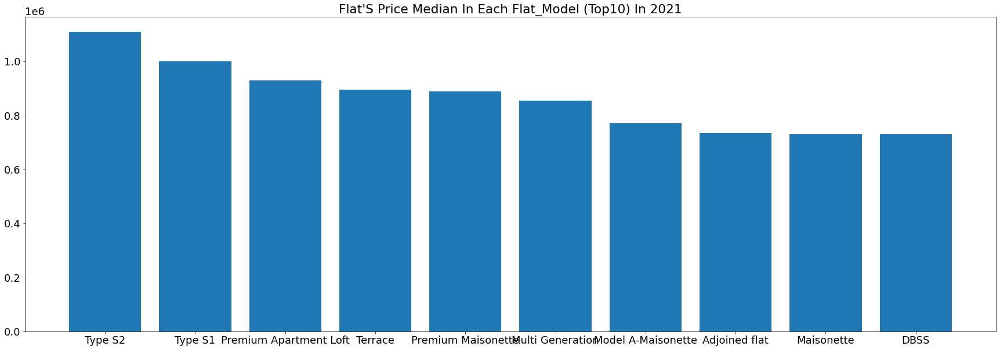

In [143]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_model", 10, 2021)
plt.show()

_PRICE GRWOTH (MONTHLY)_

     month              flat_model  resale_price
1        1           Adjoined flat      690000.0
3        1                    DBSS      750000.0
5        1              Maisonette      683750.0
7        1      Model A-Maisonette      817000.0
9        1        Multi Generation      860000.0
..     ...                     ...           ...
199     12      Model A-Maisonette      790000.0
201     12        Multi Generation      857500.0
204     12  Premium Apartment Loft      959000.0
207     12                 Type S1     1050000.0
208     12                 Type S2     1254000.0

[104 rows x 3 columns]


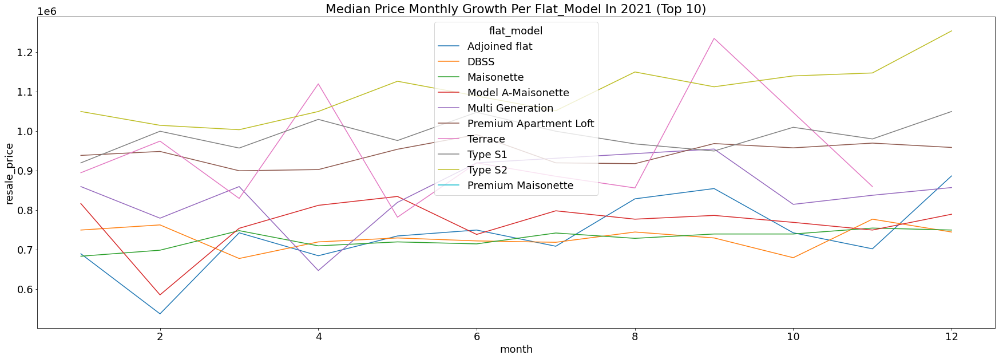

In [144]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_price_monthly('flat_model', 10, 2021)
plt.show()

_VOLUME GENERAL_

           flat_model  resale_price
7             Model A  4.772144e+09
4            Improved  3.733697e+09
12  Premium Apartment  2.109832e+09
11     New Generation  1.166129e+09
2           Apartment  7.661953e+08
6          Maisonette  6.669443e+08
3                DBSS  5.267029e+08
16           Standard  3.732492e+08
15         Simplified  3.717859e+08
9            Model A2  1.147471e+08


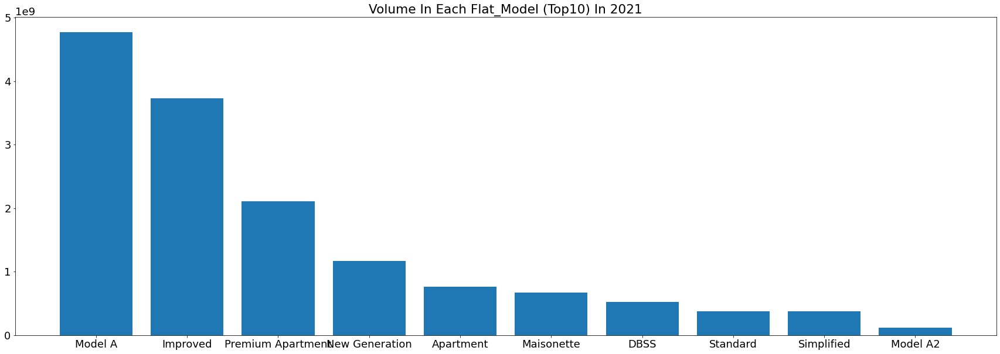

In [145]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_model", 10, 2021)
plt.show()

_VOLUME GROWTH (MONTHLY)_

     month         flat_model  resale_price
2        1          Apartment  7.505087e+07
3        1               DBSS  3.875705e+07
4        1           Improved  2.946758e+08
5        1         Maisonette  6.093616e+07
6        1            Model A  3.905053e+08
..     ...                ...           ...
200     12           Model A2  1.172169e+07
202     12     New Generation  1.071812e+08
203     12  Premium Apartment  1.738850e+08
205     12         Simplified  3.313390e+07
206     12           Standard  3.127966e+07

[120 rows x 3 columns]


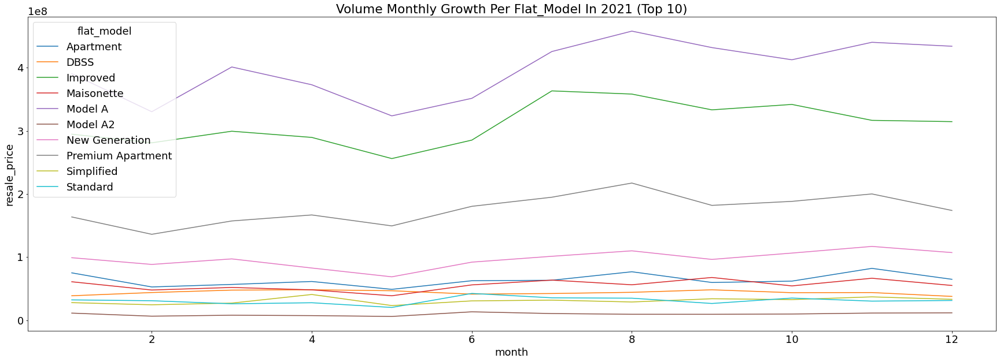

In [146]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

line_plot_volume_monthly('flat_model', 10, 2021)
plt.show()

#########################################################################################################################

__2022__

#########################################################################################################################

___________________________________
__TOWN__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

             town  year_month
20       SENGKANG         141
25         YISHUN         108
22       TAMPINES         103
17        PUNGGOL         101
8   CHOA CHU KANG          96
11        HOUGANG          94
13    JURONG WEST          80
24      WOODLANDS          73
1           BEDOK          72
5   BUKIT PANJANG          56


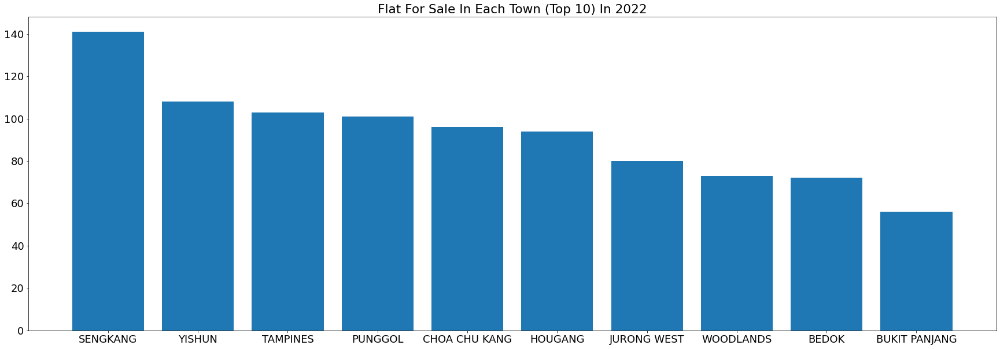

In [147]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("town",10,2022)
plt.show()

_PRICE AVERAGE GENERAL_

               town  resale_price
6       BUKIT TIMAH      800000.0
2            BISHAN      688000.0
4       BUKIT MERAH      661800.0
7      CENTRAL AREA      658800.0
15    MARINE PARADE      650000.0
18       QUEENSTOWN      645000.0
16        PASIR RIS      586500.0
23        TOA PAYOH      570000.0
14  KALLANG/WHAMPOA      555000.0
22         TAMPINES      522888.0


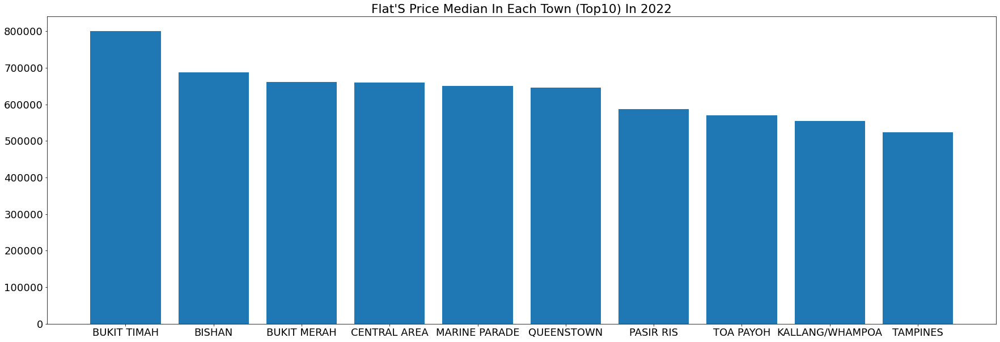

In [148]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("town", 10, 2022)
plt.show()

_VOLUME GENERAL_

             town  resale_price
20       SENGKANG   74278568.00
22       TAMPINES   55978304.00
17        PUNGGOL   53057984.00
25         YISHUN   51071388.00
11        HOUGANG   50130266.00
8   CHOA CHU KANG   49796352.00
13    JURONG WEST   36540439.99
24      WOODLANDS   36131064.00
1           BEDOK   34222752.00
18     QUEENSTOWN   34067240.00


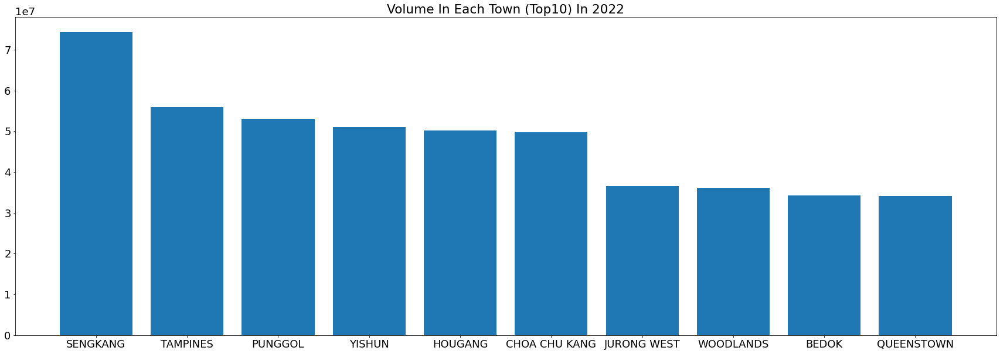

In [149]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("town", 10, 2022)
plt.show()

___________________________________
__FLAT TYPE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

          flat_type  year_month
2            4 ROOM         600
3            5 ROOM         395
1            3 ROOM         354
4         EXECUTIVE         100
0            2 ROOM          21
5  MULTI-GENERATION           1


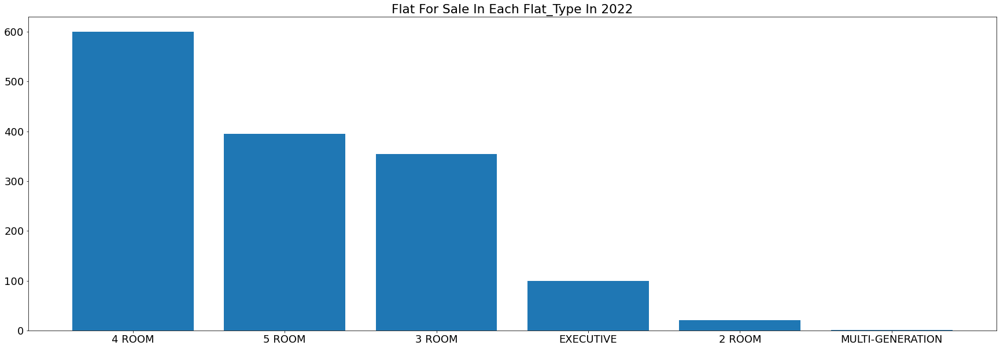

In [150]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_type",None,2022)
plt.show()

_PRICE AVERAGE GENERAL_

          flat_type  resale_price
5  MULTI-GENERATION      785000.0
4         EXECUTIVE      740000.0
3            5 ROOM      580000.0
2            4 ROOM      495000.0
1            3 ROOM      364000.0
0            2 ROOM      285000.0


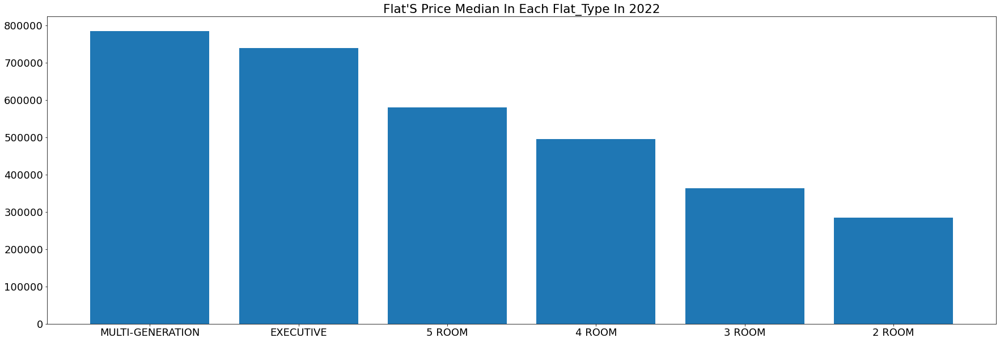

In [151]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_type", None, 2022)
plt.show()

_VOLUME GENERAL_

          flat_type  resale_price
2            4 ROOM  3.147726e+08
3            5 ROOM  2.477824e+08
1            3 ROOM  1.333235e+08
4         EXECUTIVE  7.627048e+07
0            2 ROOM  5.801000e+06
5  MULTI-GENERATION  7.850000e+05


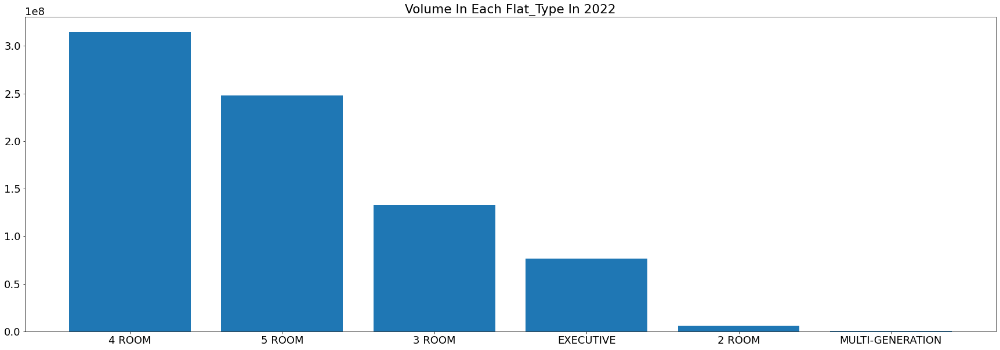

In [152]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_type", None, 2022)
plt.show()

___________________________________
__STOREY RANGE__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

   storey_range  year_month
1      04 TO 06         341
2      07 TO 09         302
3      10 TO 12         259
0      01 TO 03         253
4      13 TO 15         150
5      16 TO 18          78
6      19 TO 21          28
8      25 TO 27          18
7      22 TO 24          15
9      28 TO 30           6
11     34 TO 36           6
12     37 TO 39           6
10     31 TO 33           4
13     40 TO 42           4
14     43 TO 45           1


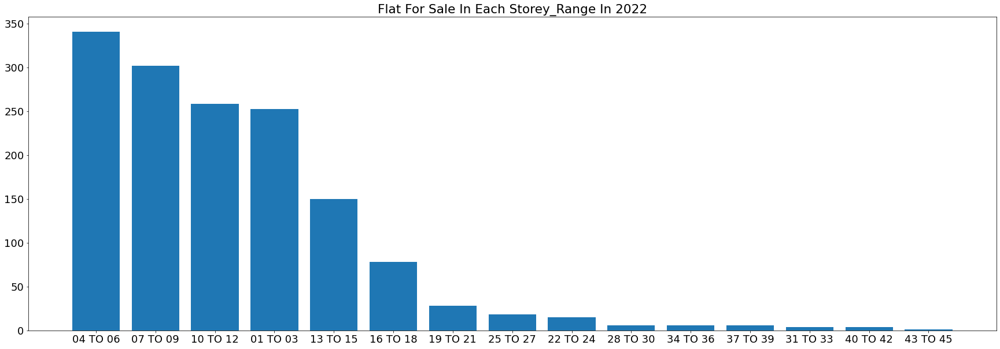

In [153]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("storey_range",None,2022)
plt.show()

_PRICE AVERAGE GENERAL_

   storey_range  resale_price
14     43 TO 45     1125000.0
13     40 TO 42      947500.0
11     34 TO 36      922500.0
10     31 TO 33      864500.0
9      28 TO 30      820000.0
8      25 TO 27      796000.0
12     37 TO 39      756500.0
6      19 TO 21      680500.0
7      22 TO 24      600000.0
5      16 TO 18      591500.0
4      13 TO 15      527500.0
2      07 TO 09      508000.0
3      10 TO 12      500000.0
1      04 TO 06      470000.0
0      01 TO 03      458000.0


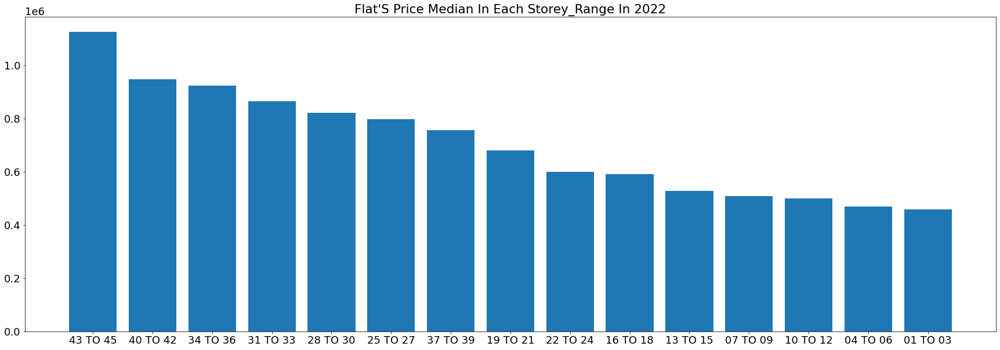

In [154]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("storey_range", None, 2022)
plt.show()

_VOLUME GENERAL_

   storey_range  resale_price
1      04 TO 06  1.678857e+08
2      07 TO 09  1.585044e+08
3      10 TO 12  1.329602e+08
0      01 TO 03  1.223678e+08
4      13 TO 15  8.124514e+07
5      16 TO 18  4.819832e+07
6      19 TO 21  1.985378e+07
8      25 TO 27  1.393589e+07
7      22 TO 24  9.743000e+06
11     34 TO 36  5.487776e+06
12     37 TO 39  4.972800e+06
9      28 TO 30  4.936888e+06
13     40 TO 42  3.858000e+06
10     31 TO 33  3.660188e+06
14     43 TO 45  1.125000e+06


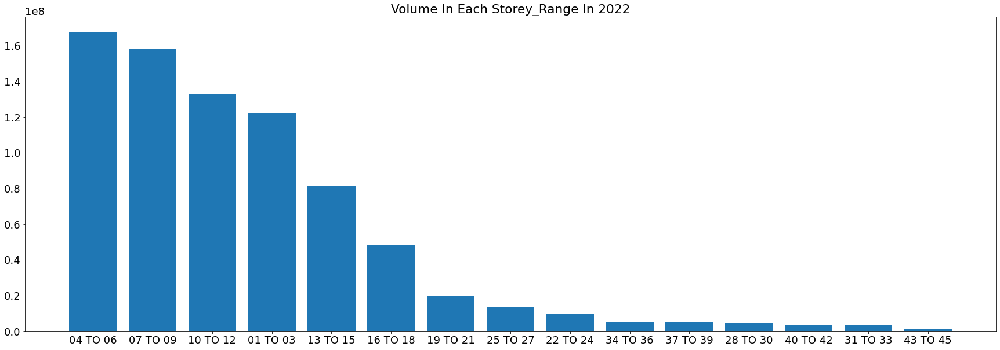

In [155]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("storey_range", None, 2022)
plt.show()

___________________________________
__FLAT MODEL__
___________________________________

_NUMBER OF SELLING UNITS GENERAL_

           flat_model  year_month
5             Model A         515
3            Improved         350
10  Premium Apartment         193
9      New Generation         175
12         Simplified          50
1           Apartment          49
4          Maisonette          43
13           Standard          38
2                DBSS          31
7            Model A2          17


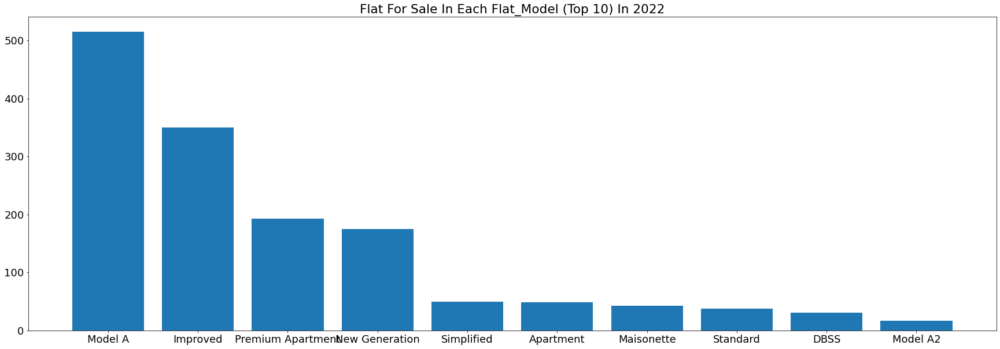

In [156]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_uni_year("flat_model",10,2022)
plt.show()

_PRICE AVERAGE GENERAL_

                flat_model  resale_price
11  Premium Apartment Loft     1238000.0
15                 Type S2     1088000.0
14                 Type S1     1068000.0
0            Adjoined flat      847500.0
8         Multi Generation      785000.0
4               Maisonette      778000.0
2                     DBSS      768000.0
1                Apartment      728000.0
6       Model A-Maisonette      684000.0
3                 Improved      542500.0


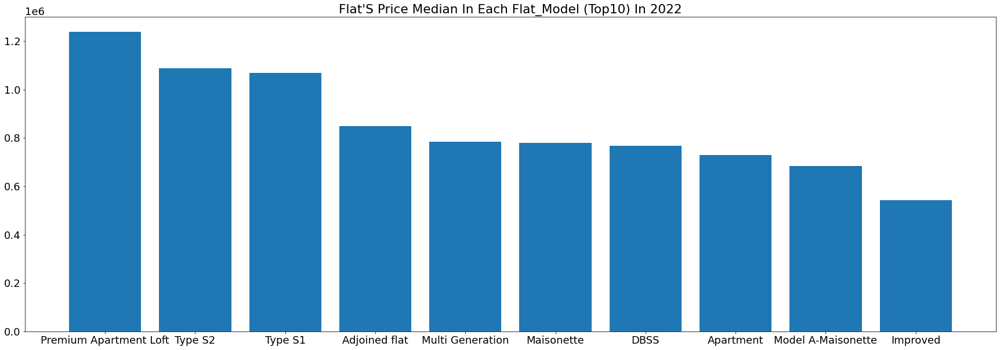

In [157]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_price_year("flat_model", 10, 2022)
plt.show()

_VOLUME GENERAL_

           flat_model  resale_price
5             Model A  2.607438e+08
3            Improved  1.902173e+08
10  Premium Apartment  1.096102e+08
9      New Generation  6.783896e+07
1           Apartment  3.621789e+07
4          Maisonette  3.450359e+07
2                DBSS  2.560666e+07
12         Simplified  2.008855e+07
13           Standard  1.714889e+07
7            Model A2  7.467000e+06


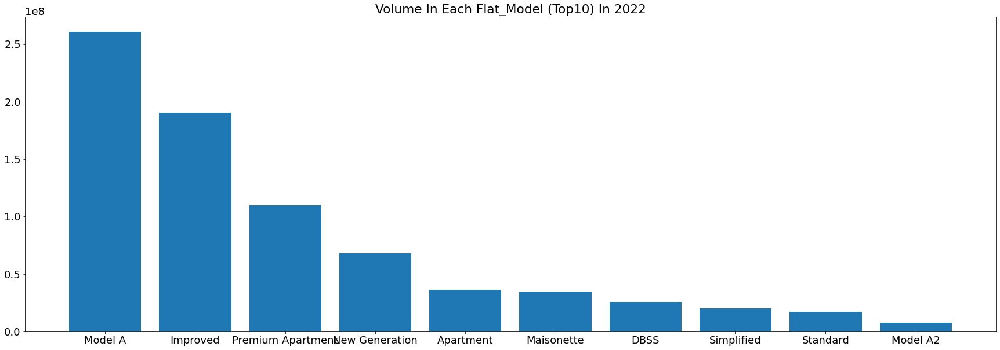

In [158]:
plt.figure(figsize=(30,10))
plt.rcParams.update({'font.size': 18})

categoric_bar_volume_year("flat_model", 10, 2022)
plt.show()

___________________________________
__FLAT MODEL = 3 ROOM and TOWN = BUKIT TIMAH and YEAR = [2017, 2020]__ 
___________________________________

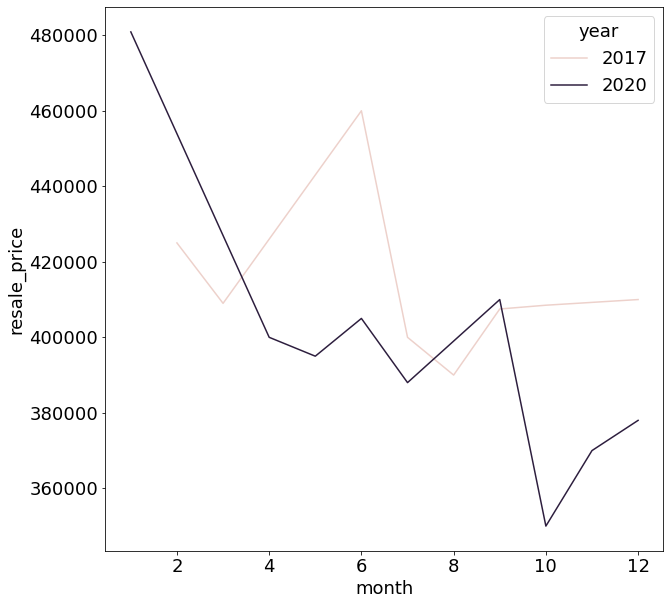

,flat_type,town,year,month,resale_price
0,3 ROOM,BUKIT TIMAH,2017,2,425000.0
1,3 ROOM,BUKIT TIMAH,2017,3,409000.0
2,3 ROOM,BUKIT TIMAH,2017,6,460000.0
3,3 ROOM,BUKIT TIMAH,2017,7,400000.0
4,3 ROOM,BUKIT TIMAH,2017,8,390000.0
5,3 ROOM,BUKIT TIMAH,2017,9,407500.0
6,3 ROOM,BUKIT TIMAH,2017,10,408500.0
7,3 ROOM,BUKIT TIMAH,2017,12,410000.0
8,3 ROOM,BUKIT TIMAH,2020,1,480888.0
9,3 ROOM,BUKIT TIMAH,2020,4,400000.0


In [159]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 18})

case_1 = df[
    (df["flat_type"]=="3 ROOM") 
   & (df["town"]=="BUKIT TIMAH")
   & (df["year"].isin([2017, 2020]))
].groupby(["flat_type", "town", "year", "month"]).median().reset_index()[["flat_type", "town", "year", "month", "resale_price"]]

sns.lineplot(data = case_1, x='month', y='resale_price', hue='year')
plt.show()

case_1

__________________________

__________________________

__________________________

__________________________

__BASKET ANALYSIS__
____________________________________

combination of Flat type Flat Model and Storey range X year

- Number of Unit Sale

In [160]:
table_3_var = pd.pivot_table(df, values=['year_month', 'resale_price'], index=['flat_type', 
                                                                       'flat_model',
                                                                        'storey_range'], aggfunc={'year_month' : 'count',
                                                                                                'resale_price': np.mean})
table_3_var = table_3_var.reset_index().sort_values(by=["year_month"], ascending=False).rename(columns={'resale_price':'avg_resale_price',
                                                                                                       'year_month' : 'number_of_unit'})
table_3_var.iloc[:20]

,flat_type,flat_model,storey_range,avg_resale_price,number_of_unit
135,4 ROOM,Model A,04 TO 06,434397.053233,6481
136,4 ROOM,Model A,07 TO 09,451732.429431,5980
137,4 ROOM,Model A,10 TO 12,458186.233160,5181
134,4 ROOM,Model A,01 TO 03,412929.981781,4885
241,5 ROOM,Improved,04 TO 06,506354.729258,4381
242,5 ROOM,Improved,07 TO 09,521275.509914,4287
243,5 ROOM,Improved,10 TO 12,532645.168110,3926
240,5 ROOM,Improved,01 TO 03,481236.524220,3365
138,4 ROOM,Model A,13 TO 15,489921.150611,3046
73,3 ROOM,New Generation,04 TO 06,299338.383108,2806


__CORRELATION__
____________________________________

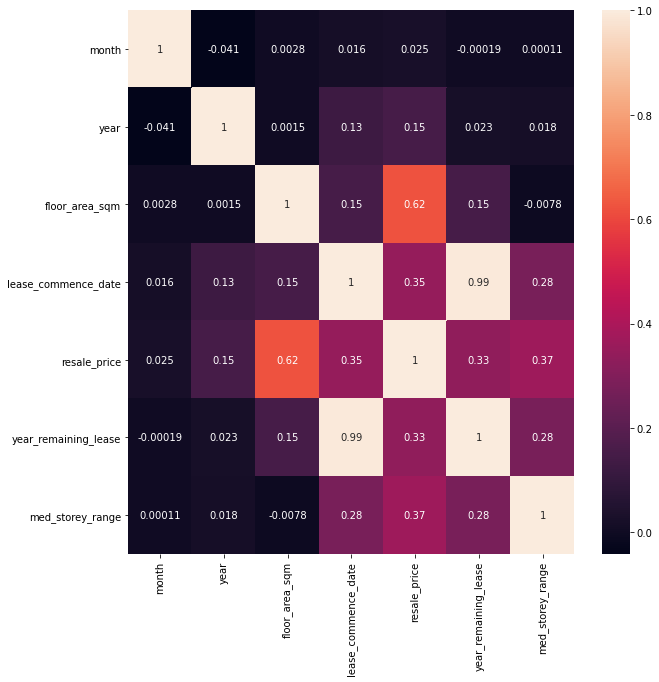

In [161]:
plt.figure(figsize=(10,10))
plt.rcParams.update({'font.size': 10})
sns.heatmap(df.corr(), annot=True)
plt.show()